In [1]:
import random
import time
import os
import sys
# Automatically find and add the project root directory to sys.path
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from tsai.all import *
from fastai.vision.all import *
from sklearn.model_selection import train_test_split
from fastai.callback.tracker import EarlyStoppingCallback
from fastai.vision.all import *
from torch.utils.data.dataset import ConcatDataset
from tsai.utils import set_seed
from sklearn.preprocessing import MinMaxScaler
from scipy.interpolate import interp1d
# from aeon.datasets import load_classification
# from sktime.datasets import load_UCR_UEA_dataset
from lomatce.explainer import LomatceExplainer
import lomatce.perturbation as perturbation 
import lomatce.utils.test_dataloader as test_loader




set_seed(1024)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = "cpu"
print(f"device: {device}")
my_setup()

device: cuda
os              : Windows-10-10.0.26200-SP0
python          : 3.11.13
tsai            : 0.3.9
fastai          : 2.7.14
fastcore        : 1.5.29
torch           : 2.2.2+cu118
device          : 1 gpu (['NVIDIA GeForce RTX 4050 Laptop GPU'])
cpu cores       : 14
threads per cpu : 1
RAM             : 15.68 GB
GPU memory      : [6.0] GB


In [2]:
# Set a random seed to ensure that the results are reproducible
random_seed = 45

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [3]:
# List of univariate datasets from UCR archive
print(get_UCR_univariate_list())

# List of multivariate datasets from UCR archieve
print(get_UCR_multivariate_list())

['ACSF1', 'Adiac', 'AllGestureWiimoteX', 'AllGestureWiimoteY', 'AllGestureWiimoteZ', 'ArrowHead', 'Beef', 'BeetleFly', 'BirdChicken', 'BME', 'Car', 'CBF', 'Chinatown', 'ChlorineConcentration', 'CinCECGTorso', 'Coffee', 'Computers', 'CricketX', 'CricketY', 'CricketZ', 'Crop', 'DiatomSizeReduction', 'DistalPhalanxOutlineAgeGroup', 'DistalPhalanxOutlineCorrect', 'DistalPhalanxTW', 'DodgerLoopDay', 'DodgerLoopGame', 'DodgerLoopWeekend', 'Earthquakes', 'ECG200', 'ECG5000', 'ECGFiveDays', 'ElectricDevices', 'EOGHorizontalSignal', 'EOGVerticalSignal', 'EthanolLevel', 'FaceAll', 'FaceFour', 'FacesUCR', 'FiftyWords', 'Fish', 'FordA', 'FordB', 'FreezerRegularTrain', 'FreezerSmallTrain', 'Fungi', 'GestureMidAirD1', 'GestureMidAirD2', 'GestureMidAirD3', 'GesturePebbleZ1', 'GesturePebbleZ2', 'GunPoint', 'GunPointAgeSpan', 'GunPointMaleVersusFemale', 'GunPointOldVersusYoung', 'Ham', 'HandOutlines', 'Haptics', 'Herring', 'HouseTwenty', 'InlineSkate', 'InsectEPGRegularTrain', 'InsectEPGSmallTrain', 'I

In [4]:
dsid = 'CBF'
dataset_name = dsid.lower()
model = 'FCN'.lower()

cur_time = time.strftime('%Y-%m-%d_%H-%M-%S')
if 'cuda' in str(device):
    base_dir = f'results/{dataset_name}/{model}--{cur_time}' 
else:
    base_dir = f'results/{dataset_name}/{model}--2023-12-28_16-37-54' 
#Create the base directory if not exist
os.makedirs(base_dir, exist_ok=True)

In [ ]:

X, y, splits  = get_UCR_data(dsid, on_disk=True, return_split=False)

In [6]:
unique_classes, counts = np.unique(y, return_counts=True)
for cls, count in zip(unique_classes, counts):
    print(f"Class {cls}: {count} instances")

Class 1: 310 instances
Class 2: 310 instances
Class 3: 310 instances


### Load and preprocess data

In [7]:
def data_preparation(X, y, test_size=0.3, random_state=12):
    # Stratified split to maintain class distribution

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y, random_state=random_state)
    X_test, X_valid, y_test, y_valid = train_test_split(X_test, y_test, test_size=0.5, stratify=y_test, random_state=random_state)

    print(f'Shape of X_train :{X_train.shape}')
    print(f'Shape of y_train :{y_train.shape}')
    print(f'Shape of X_valid :{X_valid.shape}')
    print(f'Shape of X_test :{X_test.shape}')

    tfms  = [None, [Categorize()]]
    train_ds = TSDatasets(X_train, y_train, tfms=tfms)
    valid_ds = TSDatasets(X_valid, y_valid, tfms=tfms)


    dls = TSDataLoaders.from_dsets(train_ds, valid_ds, bs=[8, 32], batch_tfms=[TSStandardize()], num_workers=0,  device=device, shuffle=True )
    print(f' Number of classes : {dls.c}')
    return dls, X_train, X_test, y_test

In [8]:
lomatce_explainer = LomatceExplainer(base_dir=base_dir)
dls, X_train, X_test, y_test = data_preparation(X, y)

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(140, 1, 128)
Shape of X_test :(139, 1, 128)
 Number of classes : 3


### Build learner and train model

In [9]:
def trainer (model, dls, epochs=100, learning_rate=1e-3, patience=15):
    kwargs = {}
    metrics=[accuracy]
    path = f'{base_dir}/export'
    os.makedirs(path, exist_ok=True)
    # Create model
    model = create_model(model, dls=dls, **kwargs)
    # Define early stopping criteria
    early_stopping = EarlyStoppingCallback(monitor='valid_loss', min_delta=0.001, patience=patience)

    # Define a call back to save the best model
    save_callback = SaveModelCallback(monitor='accuracy')
    # Train and evaluate model with early stopping
    # set_seed(42)
    cbs = [early_stopping, save_callback,ShowGraph()]
    learn = Learner(dls=dls, model=model, opt_func=Adam, metrics=metrics,cbs=cbs) #
    learn.fit_one_cycle(epochs, learning_rate)
    learn.save_all(path=path, dls_fname='dls', model_fname='model', learner_fname='learner')
    return learn

def validator(learn, X_test, y_test):
    dls = learn.dls
    valid_dl = dls.valid
    train_dl = dls.train
    # Labelled test data
    test_ds = valid_dl.dataset.add_test(X_test, y_test)# In this case I'll use X and y, but this would be your test data
    test_dl = valid_dl.new(test_ds)
    test_probas, test_targets, test_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
    # print(f'Test Accuracy: {skm.accuracy_score(test_targets, test_preds):10.6f}')
    valid_probas, valid_targets, valid_preds = learn.get_preds(dl=valid_dl, with_decoded=True)
    train_probas, train_targets, train_preds = learn.get_preds(dl=train_dl, with_decoded=True)
    
    valid_accuracy = (valid_targets == valid_preds).float().mean()
    test_accuracy = (test_targets == test_preds).float().mean()
    train_accuracy = (train_targets == train_preds).float().mean()

    print(f"Validation Accuracy :{valid_accuracy:.2f}")
    print(f"Test Accuracy :{test_accuracy:.2f}")
    print(f"Train Accuracy :{train_accuracy:.2f}")
    valid_dl.show_batch(sharey=True)
    test_dl.show_batch(sharey=True)
    learn.show_results(max_n=9)

    return train_accuracy, valid_accuracy, test_accuracy, test_preds, valid_preds

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(140, 1, 128)
Shape of X_test :(139, 1, 128)
 Number of classes : 3
Start training...


epoch,train_loss,valid_loss,accuracy,time
0,0.984406,0.854415,0.585714,00:00
1,0.817423,0.670034,0.928571,00:00
2,0.676063,0.517643,0.985714,00:00
3,0.573619,0.388531,0.992857,00:00
4,0.443837,0.277887,1.000000,00:00
5,0.339755,0.195970,1.000000,00:00
6,0.264122,0.143635,1.000000,00:00
7,0.221769,0.107279,1.000000,00:00
8,0.161658,0.074989,1.000000,00:00
9,0.149366,0.047989,1.000000,00:00


Better model found at epoch 0 with accuracy value: 0.5857142806053162.


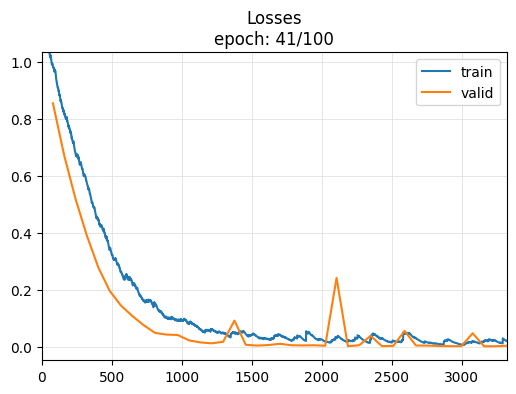

Better model found at epoch 1 with accuracy value: 0.9285714030265808.
Better model found at epoch 2 with accuracy value: 0.9857142567634583.
Better model found at epoch 3 with accuracy value: 0.9928571581840515.
Better model found at epoch 4 with accuracy value: 1.0.
No improvement since epoch 26: early stopping


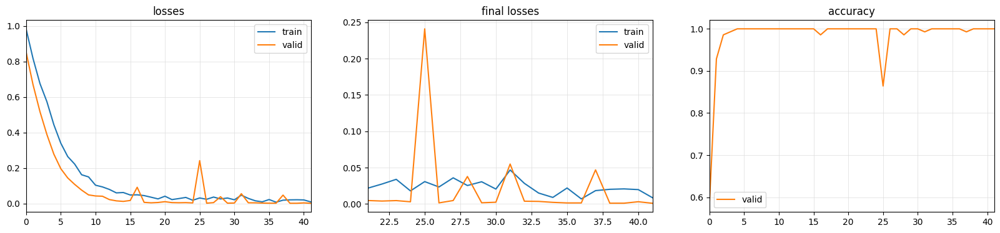

cuda


In [10]:
dls, X_train, X_test, y_test= data_preparation(X, y)
# Run the trainer function only if CUDA is available
if 'cuda' in str(device):
    print('Start training...')
    learn_new = trainer(FCN, dls)
# else:
#     learn_new = load_learner_all(path=f'{base_dir}/export/',
#                                dls_fname='dls', model_fname='model', learner_fname='learner')
    # train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)
print(device)

Validation Accuracy :1.00
Test Accuracy :0.99
Train Accuracy :0.99


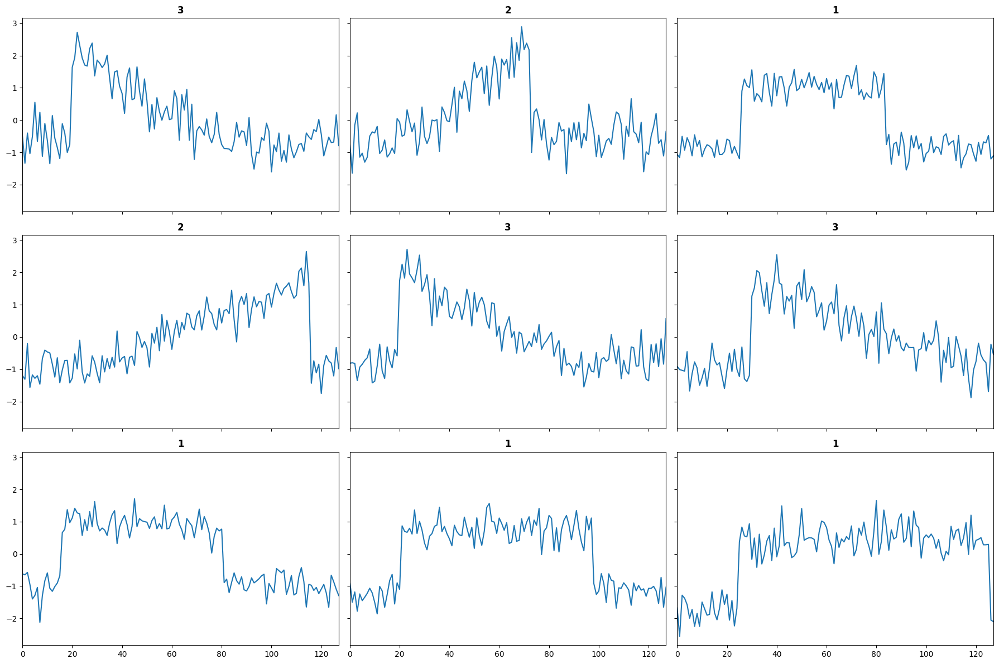

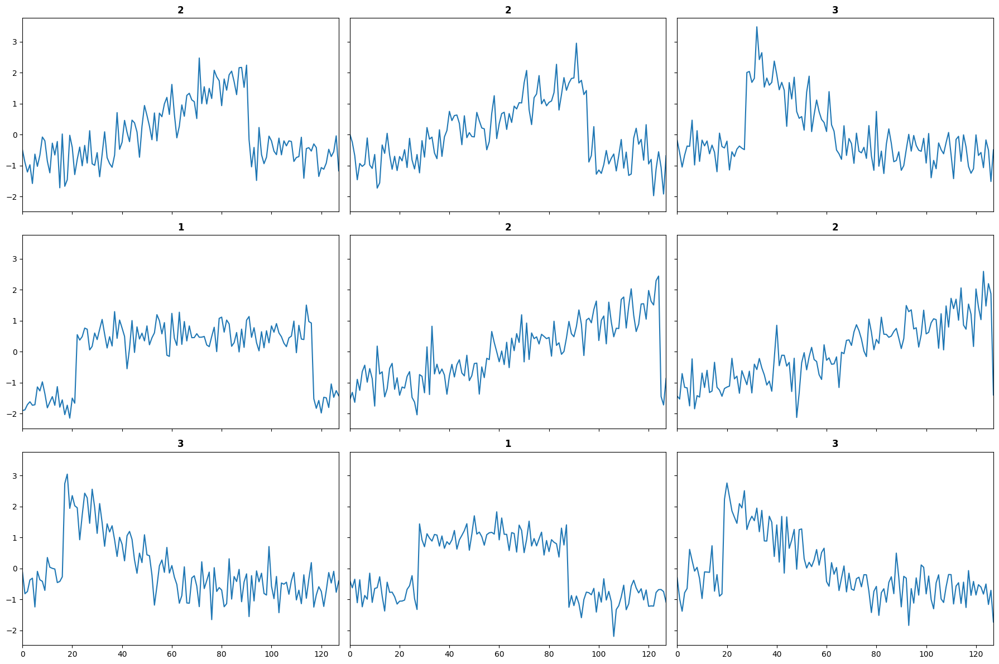

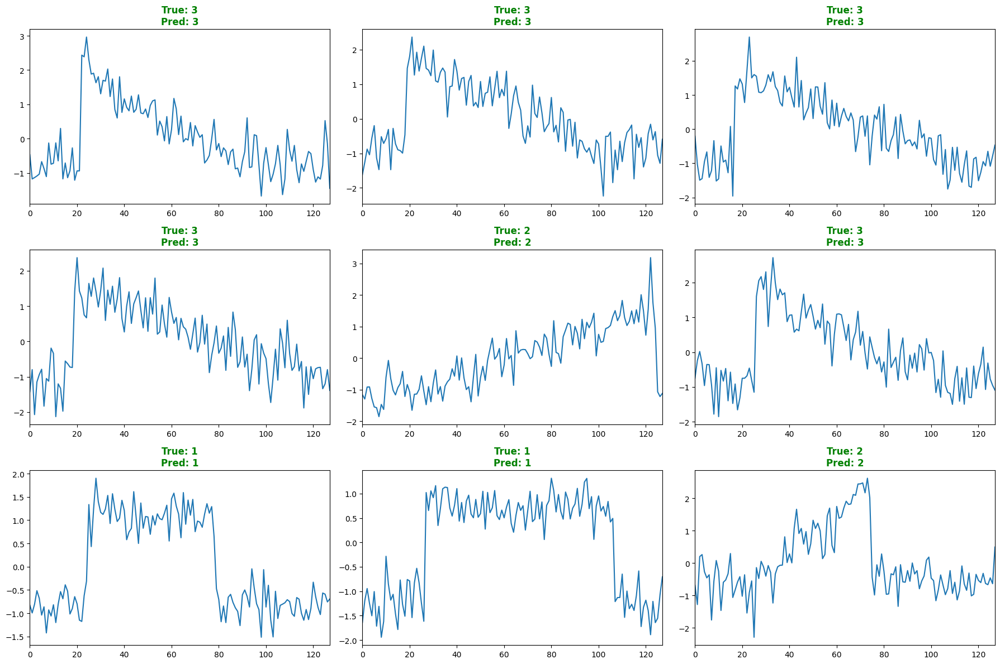

In [11]:
train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)

In [12]:
learn_new.summary()

not enough values to plot a chart


FCN (Input shape: 8 x 1 x 128)
Layer (type)         Output Shape         Param #    Trainable 
                     8 x 128 x 128       
Conv1d                                    896        True      
BatchNorm1d                               256        True      
ReLU                                                           
____________________________________________________________________________
                     8 x 256 x 128       
Conv1d                                    163840     True      
BatchNorm1d                               512        True      
ReLU                                                           
____________________________________________________________________________
                     8 x 128 x 128       
Conv1d                                    98304      True      
BatchNorm1d                               256        True      
ReLU                                                           
_________________________________________________

In [13]:
class_labels = ['Cylinder','Bell','Funnel']

In [14]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

### Apply LOMATCE (Local Model-Agnostic TimeSeries Classifers Explanation)
LOMATCE is a novel Explainable AI (XAI) method designed specifically for time series classifiers. It generates explanations that preserve the temporal characteristics of time series data.

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15223 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10891 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36335 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36808 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 42) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 42


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.78
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.91
INFO:lomatce.explainer:Model Type: Ridge


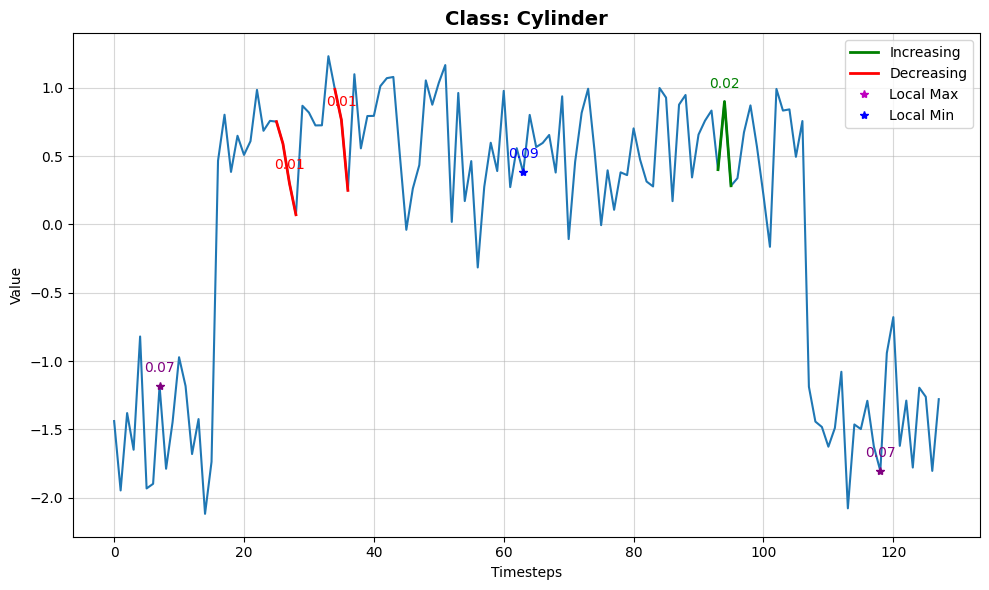

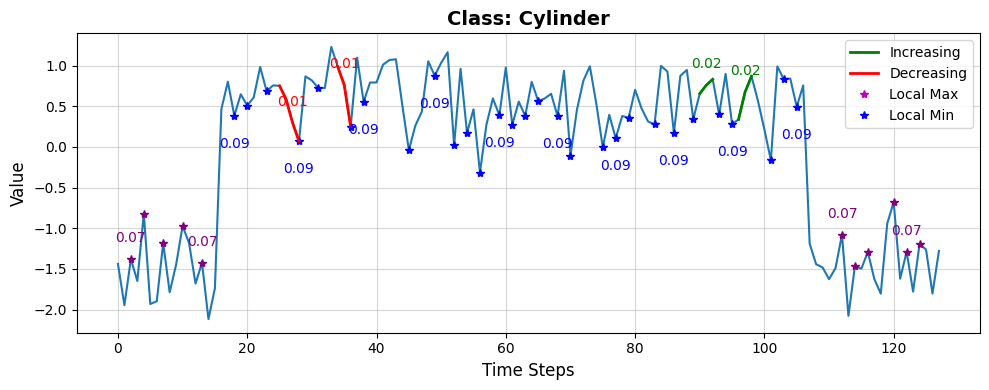

Prediction probability : tensor([0.9205, 0.0412, 0.0383])
Cylinder:                      0.9205
Bell:                      0.0412
Funnel:                      0.0383


In [15]:

origi_instance_0 = X_test[5] # Instance that is classified as Cylinder
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16579 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14321 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37014 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37122 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


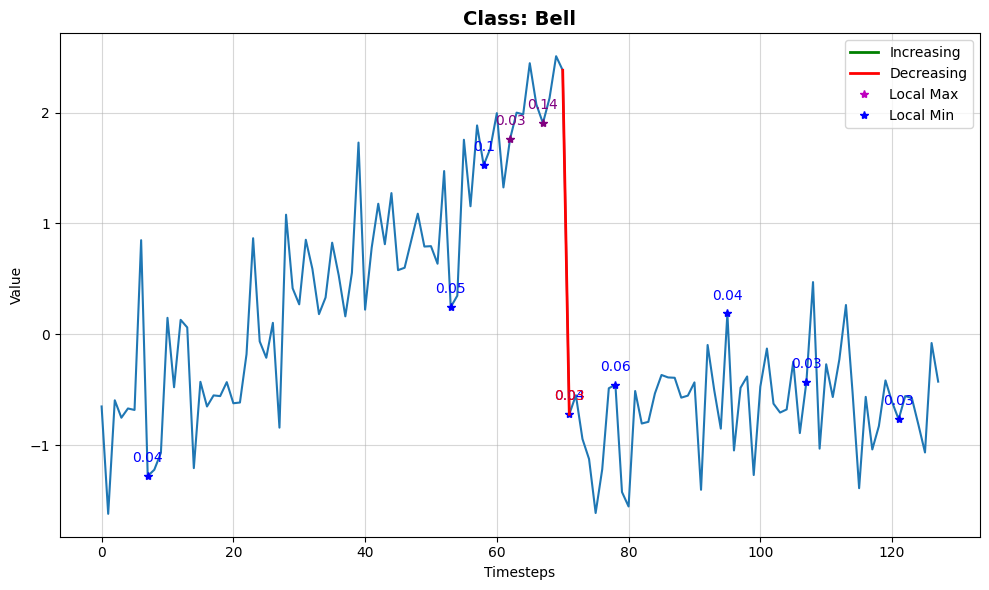

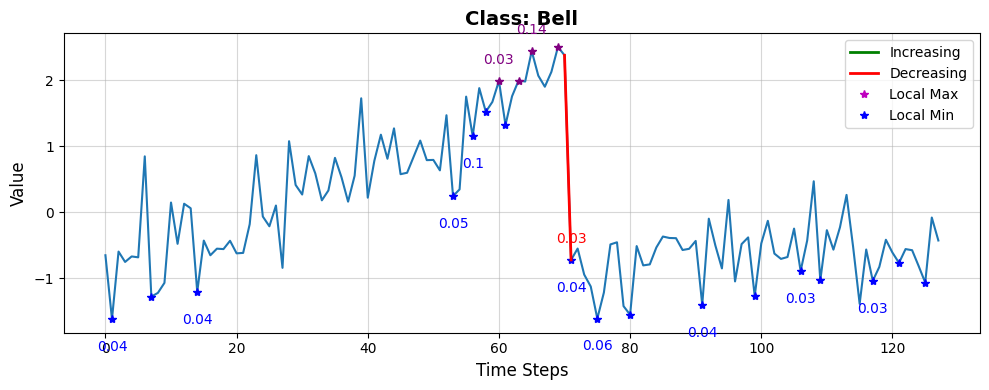

Prediction probability : tensor([0.1006, 0.8297, 0.0697])
Cylinder:                      0.1006
Bell:                      0.8297
Funnel:                      0.0697


In [16]:
origi_instance_0 = X_test[7] # Instance that is classified as Bell
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

In [17]:
print(y_test[:10])
test_preds[:10]

['1' '1' '1' '1' '3' '1' '2' '2' '3' '1']


tensor([0, 1, 0, 0, 2, 0, 1, 1, 2, 0])

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12566 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16954 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33269 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33351 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.81
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.64
INFO:lomatce.explainer:Model Type: Ridge


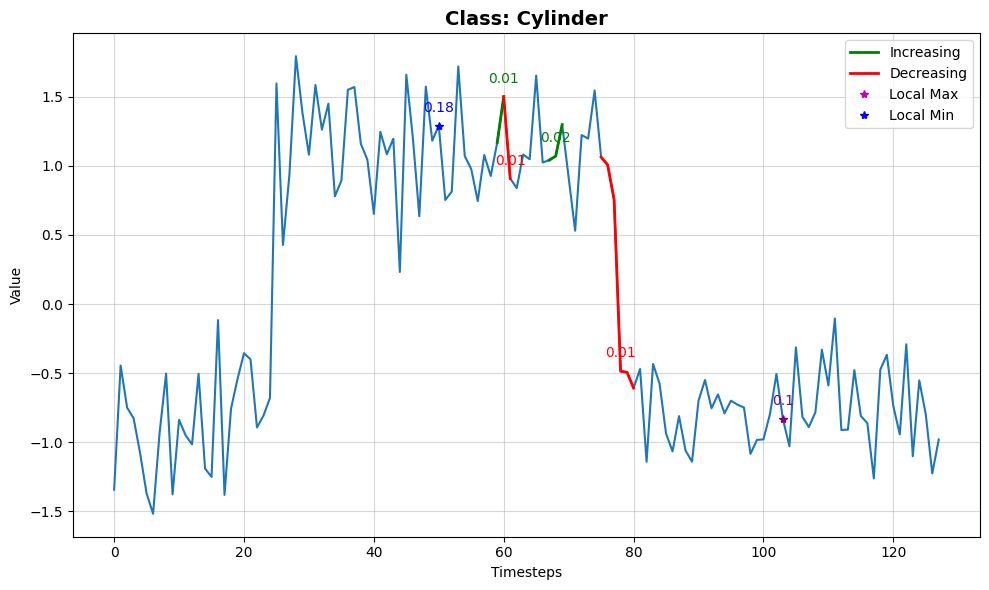

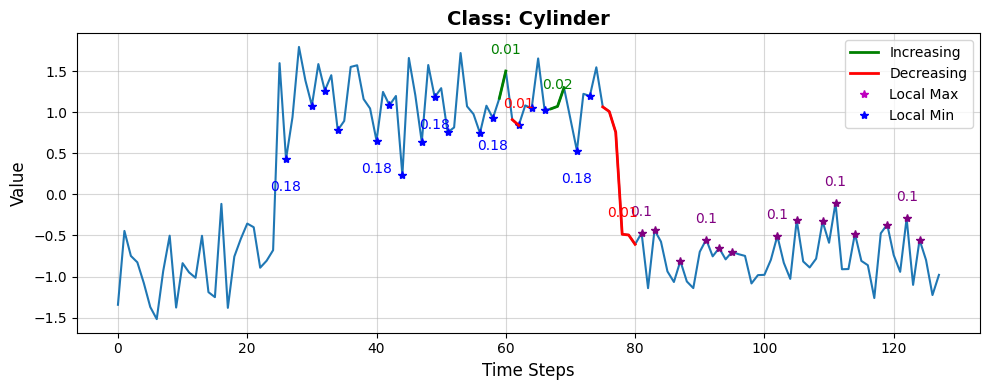

Prediction probability : tensor([0.6768, 0.1404, 0.1828])
Cylinder:                      0.6768
Bell:                      0.1404
Funnel:                      0.1828


In [18]:
origi_instance_1 = X_test[3] # Instance that is classified as cylinder
explanation = lomatce_explainer.explain_instance(origi_instance_1, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16634 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14315 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36930 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37039 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


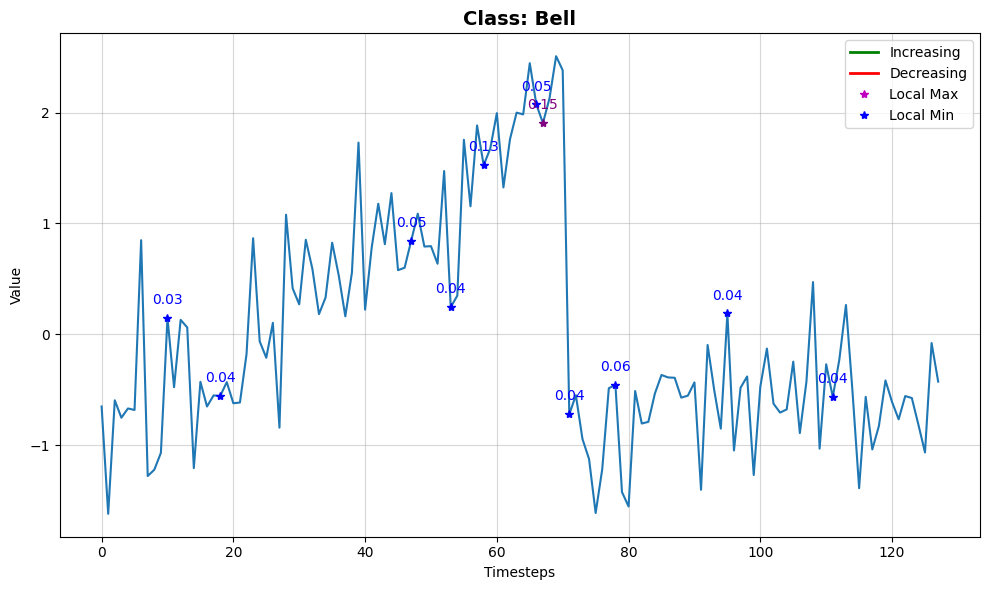

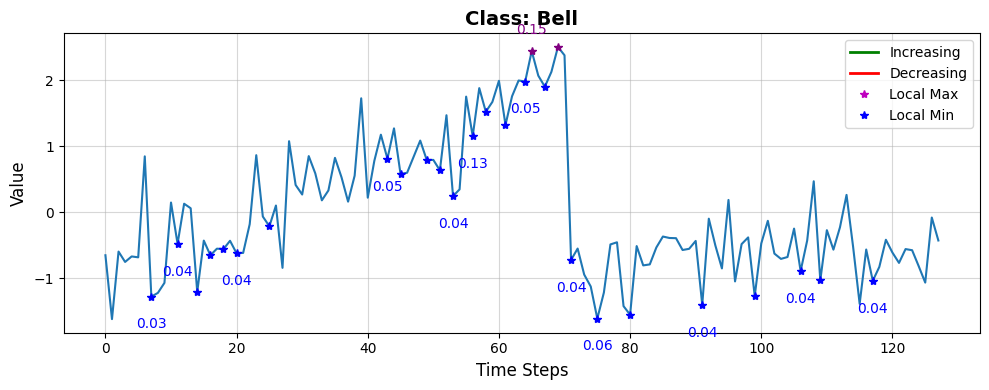

Prediction probability : tensor([0.1006, 0.8297, 0.0697])
Cylinder:                      0.1006
Bell:                      0.8297
Funnel:                      0.0697


In [19]:
origi_instance_2 = X_test[7] # Instance that is classified as bell
explanation = lomatce_explainer.explain_instance(origi_instance_2, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='total_mean')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12455 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19310 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33423 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32358 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.65
INFO:lomatce.explainer:Model Type: Ridge


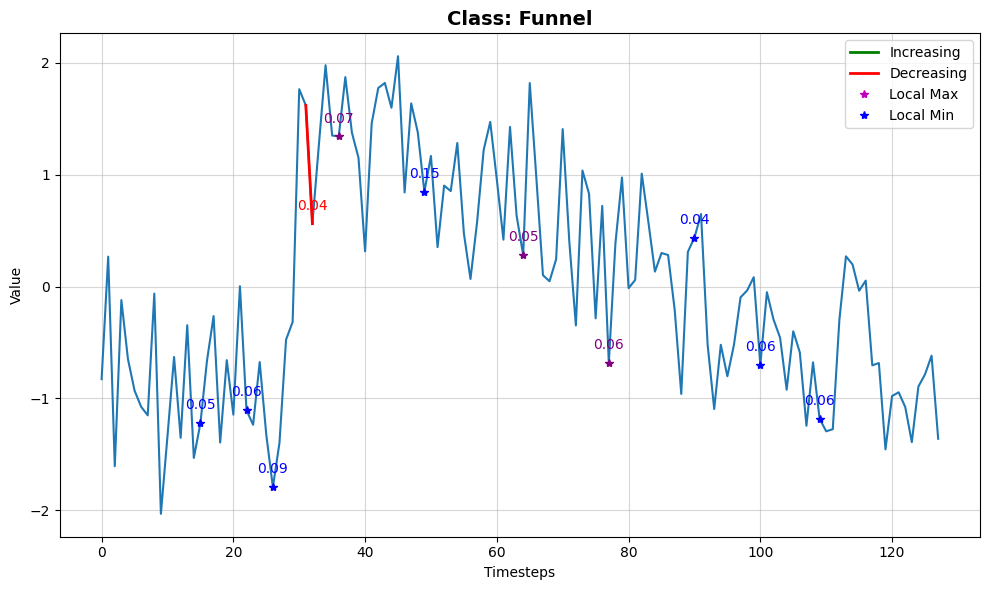

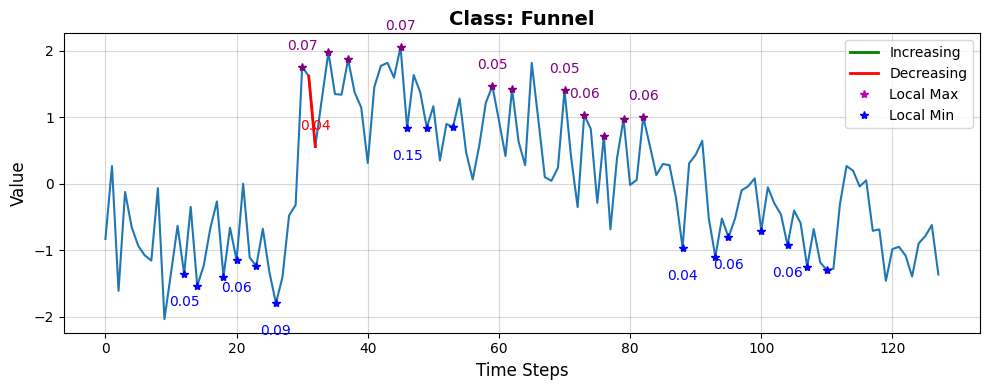

Prediction probability : tensor([0.1606, 0.2121, 0.6272])
Cylinder:                      0.1606
Bell:                      0.2121
Funnel:                      0.6272


In [20]:
origi_instance_3 = X_test[4] # Instance that is classified as Funnel
explanation = lomatce_explainer.explain_instance(origi_instance_3, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16204 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12603 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36206 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37116 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.64
INFO:lomatce.explainer:Model Type: Ridge


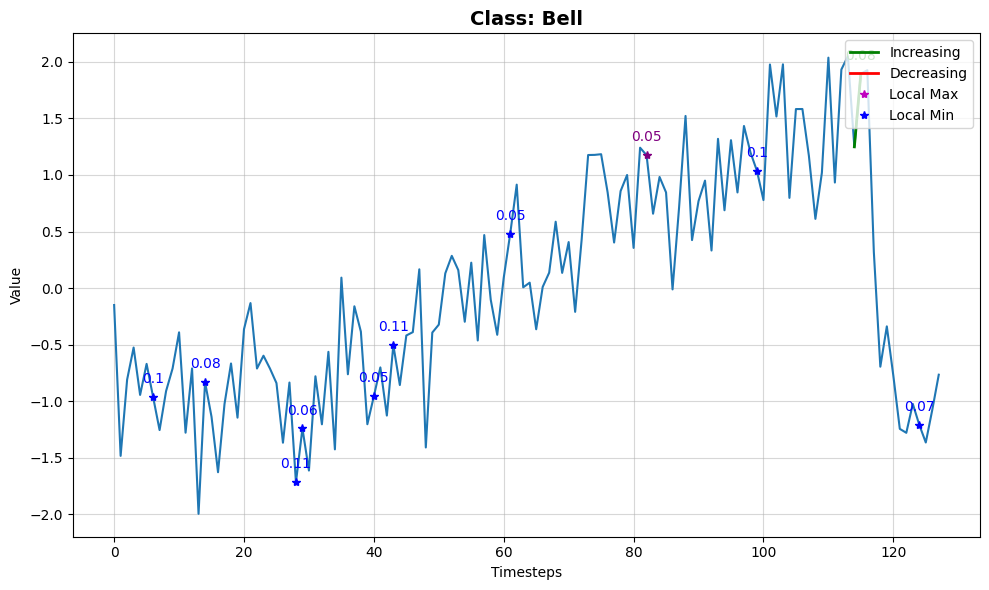

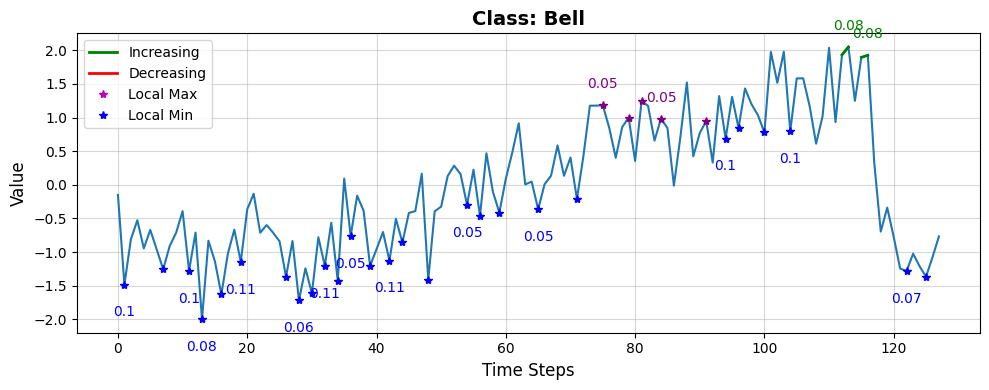

Prediction probability : tensor([0.2591, 0.6362, 0.1047])
Cylinder:                      0.2591
Bell:                      0.6362
Funnel:                      0.1047


In [21]:
origi_instance_2 = X_test[16] # Instance that is classified as bell
explanation = lomatce_explainer.explain_instance(origi_instance_2, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation


Replacement methods: zero


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.7
INFO:lomatce.explainer:Model Type: Ridge


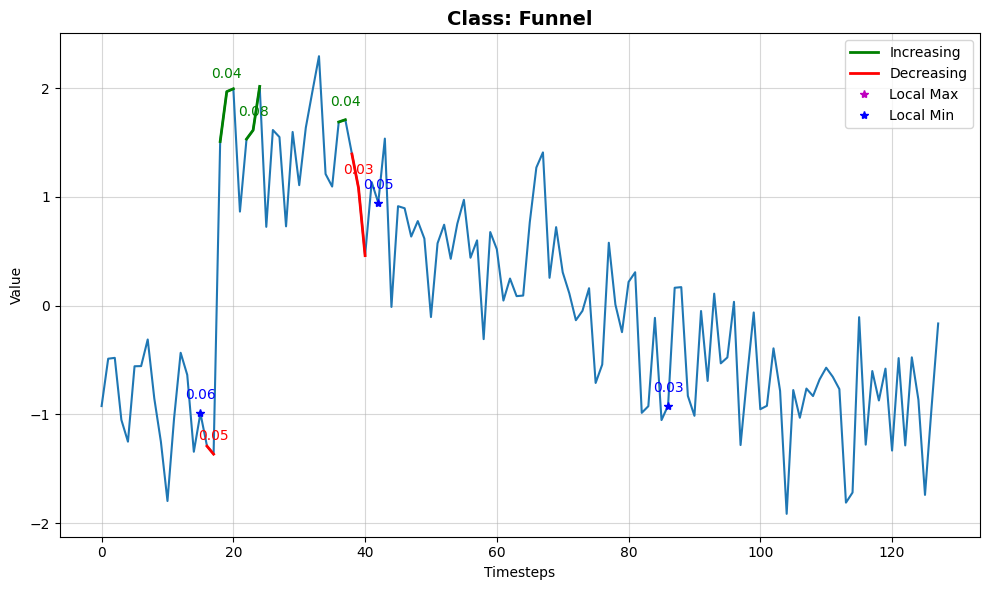

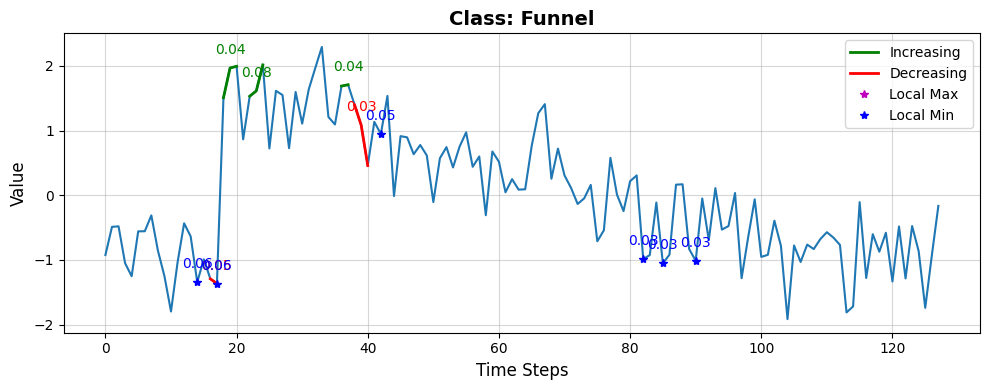

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1861, 0.1287, 0.6852])
Cylinder:                      0.1861
Bell:                      0.1287
Funnel:                      0.6852


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 3 = 3


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.82
INFO:lomatce.explainer:Model Type: Ridge


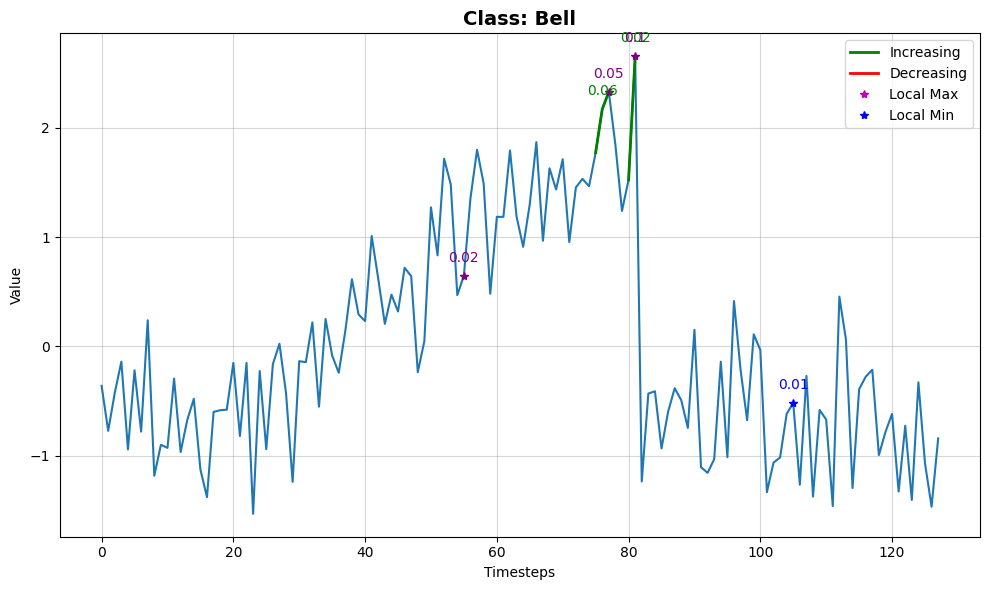

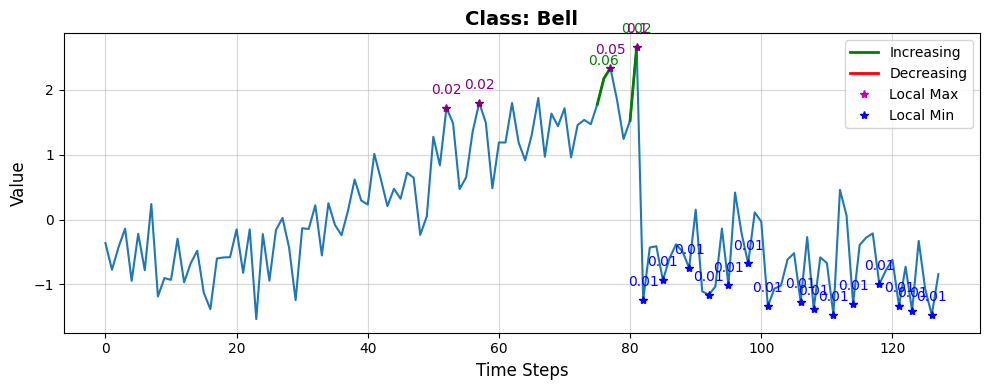

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0863, 0.8203, 0.0934])
Cylinder:                      0.0863
Bell:                      0.8203
Funnel:                      0.0934


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 3 = 3
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 3 = 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.94
INFO:lomatce.explainer:Model Type: Ridge


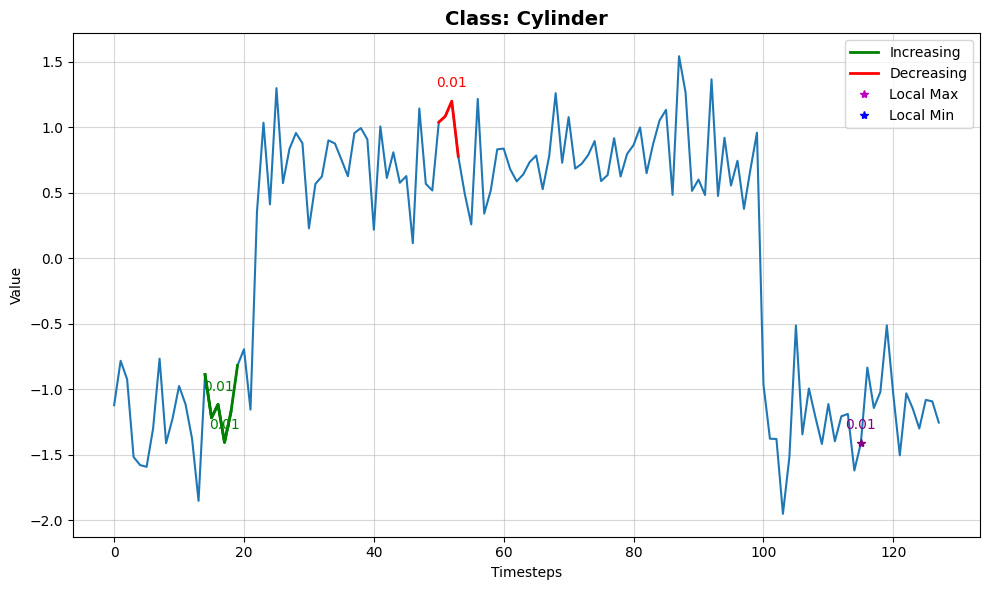

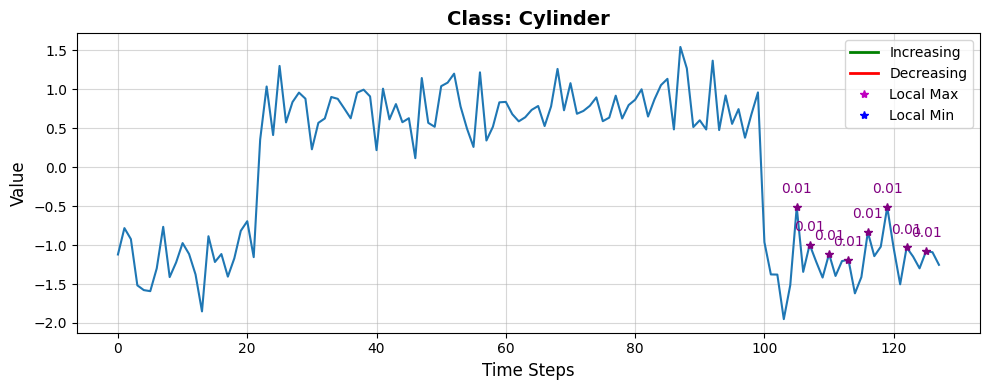

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9486, 0.0266, 0.0249])
Cylinder:                      0.9486
Bell:                      0.0266
Funnel:                      0.0249
Replacement methods: total_mean


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 18 = 18
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.81
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.6
INFO:lomatce.explainer:Model Type: Ridge


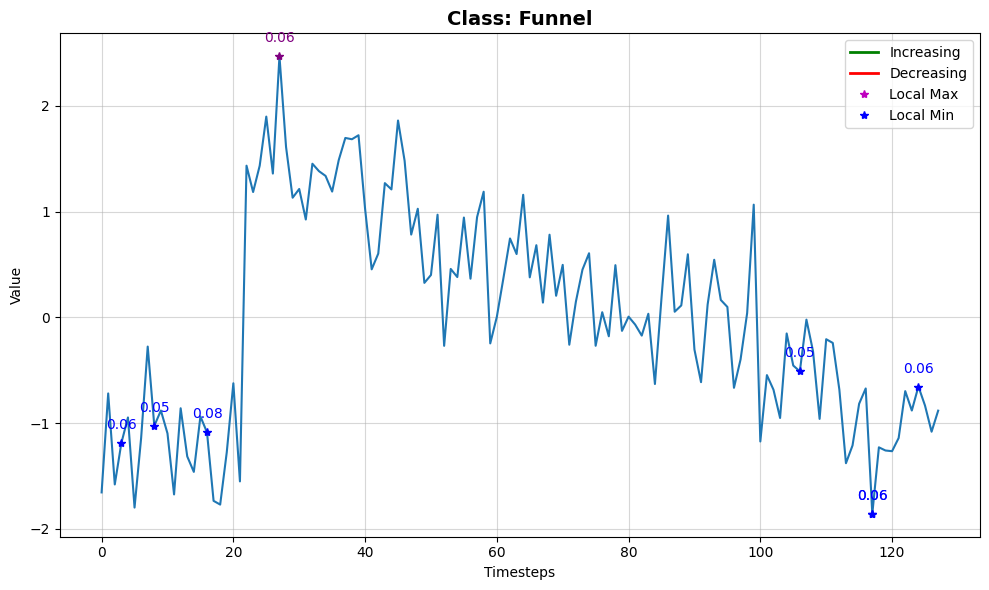

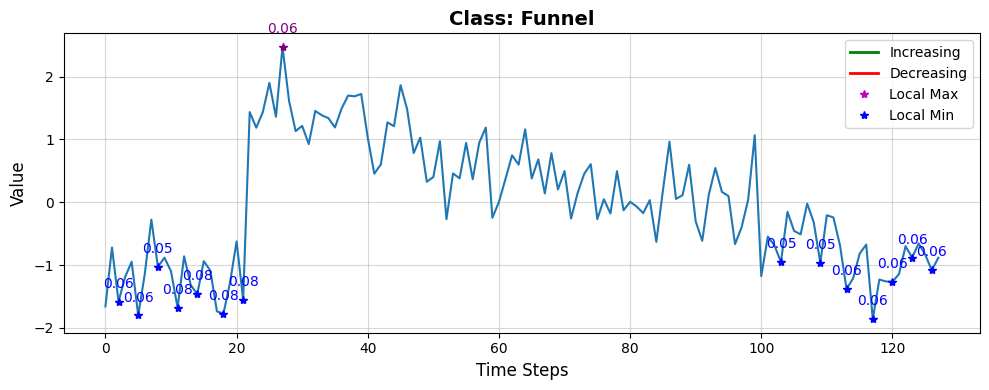

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.2557, 0.1265, 0.6178])
Cylinder:                      0.2557
Bell:                      0.1265
Funnel:                      0.6178


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.86
INFO:lomatce.explainer:Model Type: Ridge


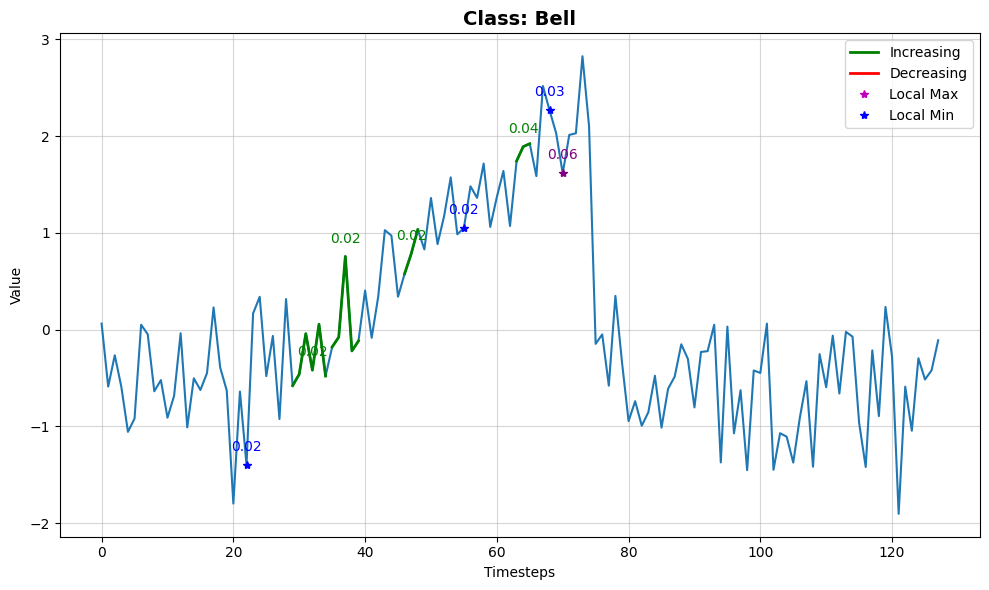

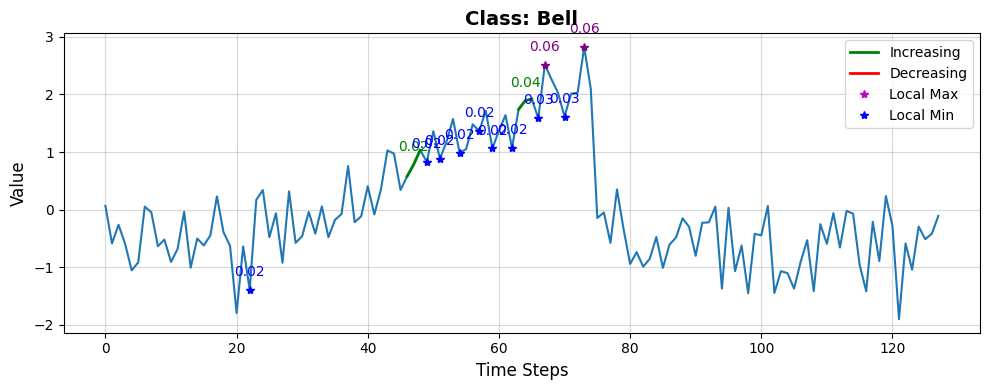

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0807, 0.8538, 0.0655])
Cylinder:                      0.0807
Bell:                      0.8538
Funnel:                      0.0655


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Increasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for Decreasing_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMax_ch1: 19 = 19
Running on 5 cpu cores (5/20 of total cores)
Optimal number of clusters for LocalMin_ch1: 19 = 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.84
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.6
INFO:lomatce.explainer:Model Type: Ridge


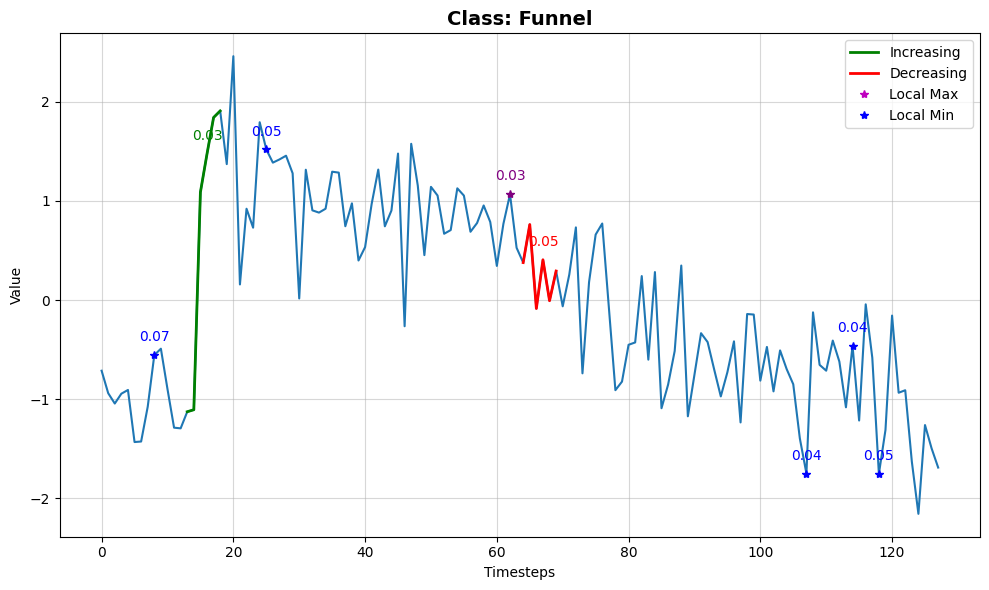

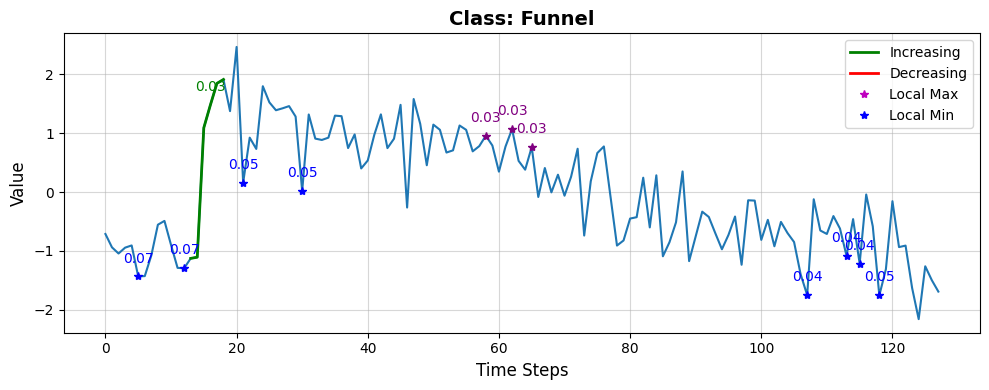

Predection probability : tensor([0.2884, 0.1175, 0.5941])
Cylinder:                      0.2884
Bell:                      0.1175
Funnel:                      0.5941


In [22]:
# Define the replacement methods
replacement_methods = ['zero', 'total_mean']

# Initialize a dictionary to store the results
results = {}

# Iterate over the replacement methods
for method in replacement_methods:
    # Initialize a list to store prediction scores for the current method
    print(f'Replacement methods: {method}')
    prediction_scores = []
    
    # Run the function 100 times for the current method
    for _ in range(3):
        # Randomly select an instance
        origi_instance = X_test[np.random.randint(len(X_test))]

        # Call the ts_local_explanation function with the current replacement method
        explanation = lomatce_explainer.explain_instance(origi_instance, lambda data : predict_fn(data, learn_new), num_perturbations=1000, class_names=class_labels, replacement_method=method)
        
        # Append the prediction score to the list
        # prediction_scores.append(prediction_score)
    
    # Compute the mean and standard deviation of the prediction scores for the current method
#     mean_prediction_score = np.mean(prediction_scores)
#     std_prediction_score = np.std(prediction_scores)
    
#     # Store the results in the dictionary
#     results[method] = (mean_prediction_score, std_prediction_score)

# # Print the results in tabular format
# print("Replacement Method\tAverage Prediction Score\tStandard Deviation")
# for method, (mean_score, std_score) in results.items():
#     print(f"{method}\t\t\t{mean_score:.2f}  \u00B1 {std_score:.2f}")


### Integrated Gradient

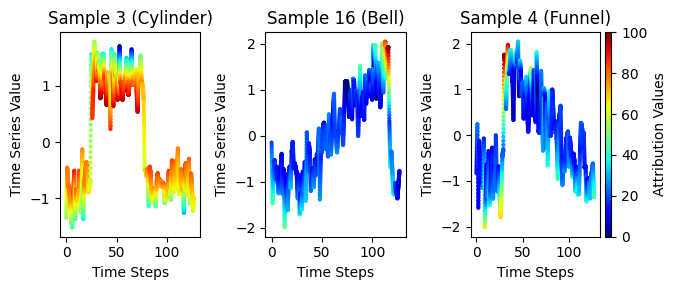

In [ ]:
import torch
import numpy as np
from torch import tensor
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
from captum.attr import IntegratedGradients
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define a function to compute Integrated Gradients
def compute_integrated_gradients(x, target):
    integrated_gradients = IntegratedGradients(learn_new.model.cpu())
    attr, delta = integrated_gradients.attribute(x, target=target, return_convergence_delta=True)
    return attr.squeeze().cpu().numpy()

# Function to plot Integrated Gradients
def plot_integrated_gradients(x_sample, target, ax):
    # Compute Integrated Gradients for the sample
    attributions = compute_integrated_gradients(x_sample, target)

    max_length = 3000  # Adjust as needed

    time_steps = torch.arange(len(x_sample.reshape(-1,1)))  # Generate time step indices
    minimum = np.min(attributions)

    attributions = attributions - minimum
    attributions = attributions / max(attributions)
    attributions = attributions * 100

    x = np.linspace(0, x_sample.shape[2] - 1, max_length, endpoint=True)

    # Interpolate the time series values
    f_ts = interp1d(range(x_sample.shape[2]), x_sample[0, 0, :])
    y_ts = f_ts(x)

    # Interpolate the attribution values
    f_cas = interp1d(range(len(attributions)), attributions)
    cas_interpolated = f_cas(x).astype(int)

    # Plot the interpolated attribution values against the interpolated time series
    scatter = ax.scatter(x=x, y=y_ts, c=cas_interpolated, cmap='jet', marker='.', vmin=0, vmax=100, linewidths=0.0)
    return scatter

# Select two samples from the test set for visualization
sample_indices = [3, 16, 4]
targets = [0, 1, 2]  # Specify the target for each sample
x_samples = [tensor(X_test[sample_idx][None]) for sample_idx in sample_indices]

# Create subplots side by side
fig, axs = plt.subplots(1, 3, figsize=(7, 3))
labels = class_labels

# Plot Integrated Gradients for each sample
for i, (x_sample, target, ax) in enumerate(zip(x_samples, targets, axs)):
    scatter = plot_integrated_gradients(x_sample, target, ax)
    ax.set_title(f'Sample {sample_indices[i]} ({labels[target]})')
    ax.set_xlabel('Time Steps')
    ax.set_ylabel('Time Series Value')

# Create a new axis on the right side of the last subplot for the color bar
divider = make_axes_locatable(axs[-1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(scatter, cax=cax)
cbar.set_label('Attribution Values')

plt.tight_layout()
plt.show()


Cylinder found: 46
Bell found: 47
Funnel found: 46


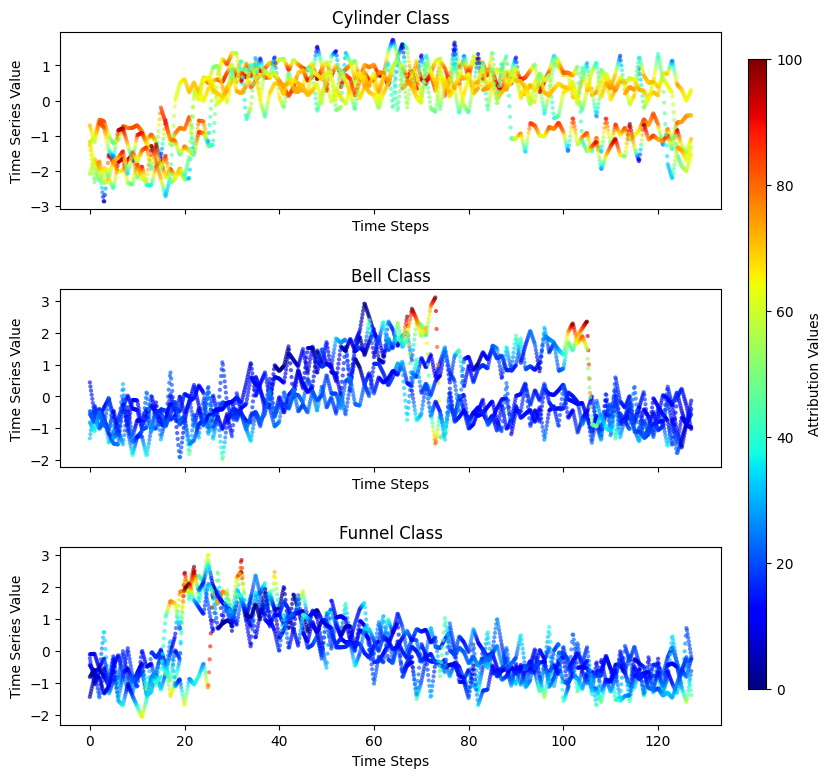

In [35]:
import torch
import numpy as np
from torch import tensor
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
from captum.attr import IntegratedGradients
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ---------------------------------------------------
# Integrated Gradients
# ---------------------------------------------------

def compute_integrated_gradients(x, target):
    model = learn_new.model.cpu()
    model.eval()

    ig = IntegratedGradients(model)

    attr, delta = ig.attribute(
        x.float(),
        target=target,
        return_convergence_delta=True
    )

    return attr.squeeze().detach().cpu().numpy()


# ---------------------------------------------------
# Plot overlaid IG explanations for one predicted class
# ---------------------------------------------------

def plot_class_explanations(ax, class_idx, n_samples=3, max_length=1000):
    pred_indices = np.where(np.array(test_preds) == class_idx)[0]

    print(f"{class_labels[class_idx]} found:", len(pred_indices))

    chosen = np.random.choice(
        pred_indices,
        size=min(n_samples, len(pred_indices)),
        replace=False
    )

    for idx in chosen:
        x_sample = tensor(
            X_test[idx][None],
            dtype=torch.float32
        )

        attributions = compute_integrated_gradients(
            x_sample,
            target=class_idx
        )

        # Normalise attribution to 0–100
        attributions = attributions - np.min(attributions)
        attributions = attributions / (np.max(attributions) + 1e-8)
        attributions = attributions * 100

        x_interp = np.linspace(
            0,
            x_sample.shape[2] - 1,
            max_length,
            endpoint=True
        )

        f_ts = interp1d(
            range(x_sample.shape[2]),
            x_sample[0, 0, :].numpy()
        )
        y_ts = f_ts(x_interp)

        f_attr = interp1d(
            range(len(attributions)),
            attributions
        )
        attr_interp = f_attr(x_interp)

        ax.scatter(
            x_interp,
            y_ts,
            c=attr_interp,
            cmap="jet",
            norm=norm,
            marker=".",
            linewidths=0.0,
            alpha=0.65
        )

    ax.set_title(f"{class_labels[class_idx]} Class")
    ax.set_xlabel("Time Steps")
    ax.set_ylabel("Time Series Value")


# ---------------------------------------------------
# Shared colour scale
# ---------------------------------------------------

norm = Normalize(vmin=0, vmax=100)

# ---------------------------------------------------
# Create figure
# ---------------------------------------------------

fig, axs = plt.subplots(
    len(class_labels),
    1,
    figsize=(9, 9),
    sharex=True
)

if len(class_labels) == 1:
    axs = [axs]

for class_idx, ax in enumerate(axs):
    plot_class_explanations(
        ax,
        class_idx,
        n_samples=5,
        max_length=1000
    )

# Add more vertical space between subplots
fig.subplots_adjust(
    right=0.86,
    hspace=0.45
)

# Shared colourbar on the far right
cbar_ax = fig.add_axes([0.89, 0.15, 0.02, 0.7])

sm = ScalarMappable(norm=norm, cmap="jet")
sm.set_array([])

cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Attribution Values")

plt.show()

### LIME


🔍 Explaining instance 0 — Predicted class: Cylinder


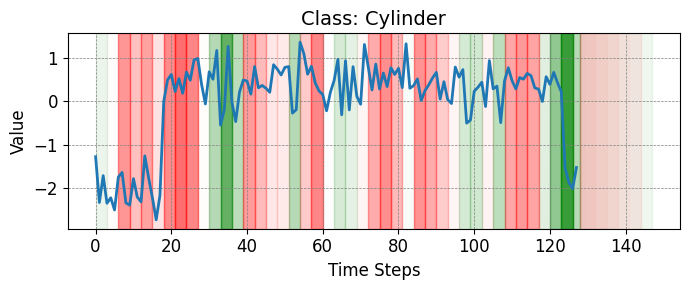


🔍 Explaining instance 1 — Predicted class: Bell


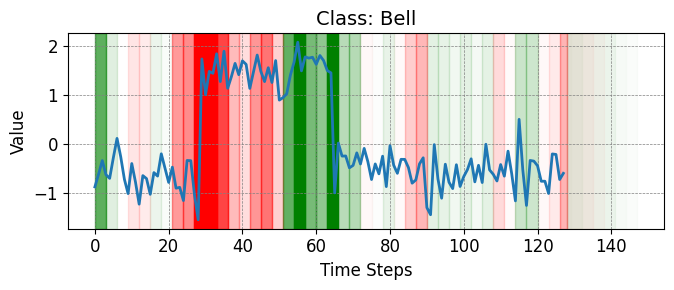


🔍 Explaining instance 2 — Predicted class: Cylinder


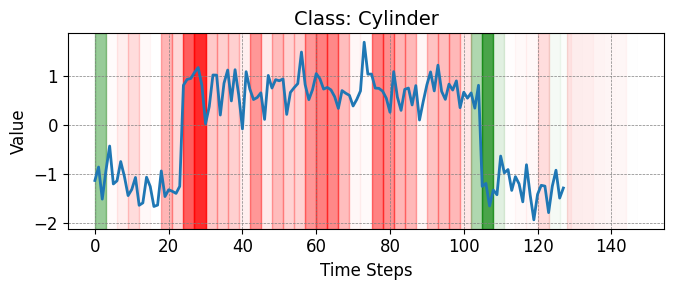


🔍 Explaining instance 3 — Predicted class: Cylinder


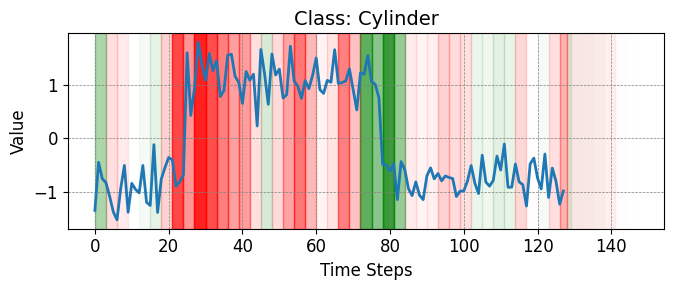


🔍 Explaining instance 4 — Predicted class: Funnel


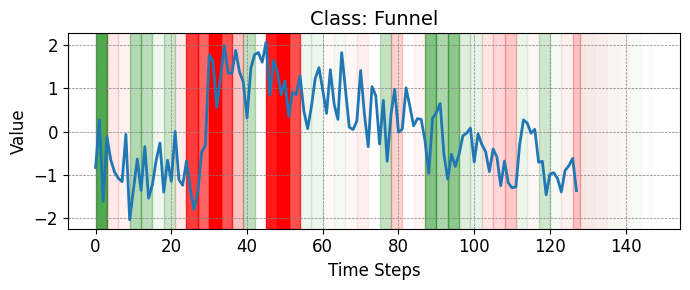

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math
from lomatce.lime_timeseries import LimeTimeSeriesExplainer
import logging
logging.getLogger().setLevel(logging.WARNING) 

# Predict function that LIME will use
def predict_fn(data):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])  # Handle univariate case
    data_dl = test_loader.test_dataloader(learn_new, data)
    data_probas, _, _ = learn_new.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# Compute LIME and visualize importance
def compute_lime_importances(flat_series, predict_fn, num_slices=25, num_features=10, num_samples=5000, class_label=None, class_names=None):
    if num_slices is None:
        num_slices = len(flat_series)
    explainer = LimeTimeSeriesExplainer(class_names=class_names)

    exp = explainer.explain_instance(
        flat_series,
        predict_fn,
        num_features=num_features,
        num_samples=num_samples,
        num_slices=num_slices,
        replacement_method='total_mean'
    )

    values_per_slice = math.ceil(len(flat_series) / num_slices)
    segments_weights = exp.as_list()
    sorted_segments = sorted(segments_weights, key=lambda x: x[1], reverse=True)

    # Plot
    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)

    for feature, weight in sorted_segments:
        start = feature * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 20, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_label}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5, color='gray')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

    return sorted_segments

# 🔁 Explain multiple instances
num_instances_to_explain = 5  # Change to 6 or more if desired
for idx in range(num_instances_to_explain):
    label_index = int(test_preds[idx])  # Convert '0' or '1' string to int
    class_label = class_labels[label_index]

    instance = X_test[idx]  # Shape: (channels, time)
    flat_series = instance.flatten() if instance.ndim == 2 else instance  # Flatten if 2D

    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_label}")
    compute_lime_importances(
        flat_series,
        predict_fn,
        num_slices=50,
        num_features=50,
        num_samples=5000,
        class_label=class_label,
        class_names=class_labels
    )


### SHAP


🔍 Explaining instance 0 — Predicted class: Cylinder


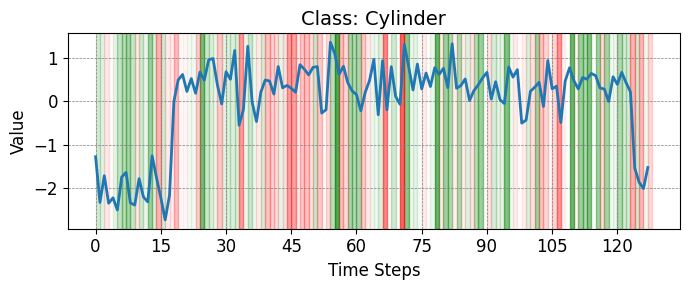


🔍 Explaining instance 1 — Predicted class: Bell


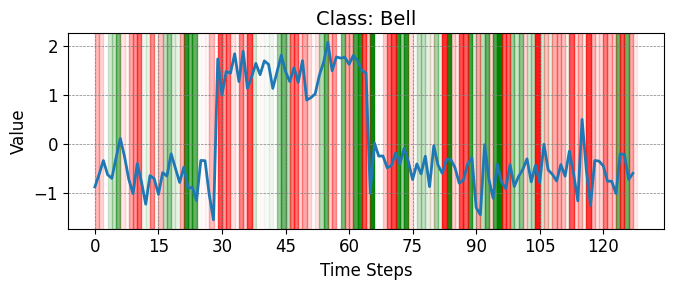


🔍 Explaining instance 2 — Predicted class: Cylinder


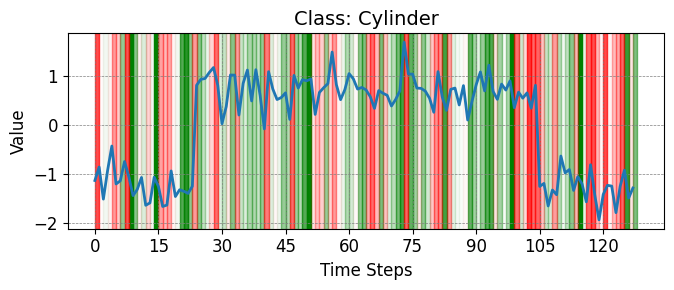

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import math

# --- 1. Segmenting Function ---
def create_segments(X, num_segments=None):
    num_samples, num_channels, sequence_length = X.shape
    if num_segments is None:
        num_segments = sequence_length
    segment_length = sequence_length // num_segments
    return num_segments, segment_length

# --- 2. Predict Function for SHAP ---
def predict_fn(masks, instance, background_data, num_segments, segment_length, learner):
    masked_inputs = []
    for mask in masks:
        masked_instance = instance.copy()
        for seg_idx in range(num_segments):
            start = seg_idx * segment_length
            end = (seg_idx + 1) * segment_length
            if mask[seg_idx] == 0:
                random_idx = np.random.randint(0, background_data.shape[0])
                background_segment = background_data[random_idx, :, start:end]
                masked_instance[0, :, start:end] = background_segment
        masked_inputs.append(masked_instance[0])
    masked_inputs = np.stack(masked_inputs)  # (num_masks, channels, time)
    data_dl = test_loader.test_dataloader(learner, masked_inputs)
    data_probas, _, _ = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# --- 3. Plotting SHAP Segment Importance ---
def plot_segment_importance(flat_series, shap_values, segment_length, class_name):
    num_segments = len(shap_values)
    flat_series = flat_series.flatten() if len(flat_series.shape) == 2 else flat_series
    values_per_slice = math.ceil(len(flat_series) / segment_length)
    sorted_segments = sorted(enumerate(shap_values), key=lambda x: x[1], reverse=True)

    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)
    
    for segment_idx, weight in sorted_segments:
        start = segment_idx * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 10, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_name}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

# --- 4. SHAP Explanation for Multiple Instances ---
# Set number of segments
num_segments, segment_length = create_segments(X_train, num_segments=None)

# Sample background for masking
background_data = X_train[np.random.choice(len(X_train), min(100, len(X_train)), replace=False)]

# Loop over multiple test instances
num_instances_to_explain = 3

for idx in range(num_instances_to_explain):
    instance_to_explain = X_test[idx:idx+1]  # Shape: (1, C, T)
    label_index = int(test_preds[idx])
    class_name = class_labels[label_index]
    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_name}")
    # SHAP explainer setup
    predict_fn_shap = lambda masks: predict_fn(
        masks,
        instance=instance_to_explain,
        background_data=background_data,
        num_segments=num_segments,
        segment_length=segment_length,
        learner=learn_new
    )

    explainer = shap.Explainer(predict_fn_shap, np.zeros((1, num_segments)))
    shap_values = explainer.shap_values(np.ones((1, num_segments)))
    
    # Extract SHAP values for the predicted class
    if isinstance(shap_values, list):
        shap_value = shap_values[label_index][0]
    else:
        shap_value = shap_values[0, :, label_index]

    shap_values_flat = np.array(shap_value).flatten()
    sorted_indices = np.argsort(-np.abs(shap_values_flat))
    sorted_shap_values = shap_values_flat[sorted_indices]
    important_time_steps = sorted_indices

    # Plot the explanation
    flat_series = instance_to_explain.reshape(1, instance_to_explain.shape[2])
    plot_segment_importance(flat_series, shap_values_flat, num_segments, class_name)


### SP-LOMATCE

In [22]:
from lomatce.sp_lomatce import SPLOMATCE

In [23]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

In [25]:
# Initialize SP-LOMATCE
splomatce_explainer = SPLOMATCE(class_labels=class_labels, dataset_name=dataset_name.upper(), lomatce_explainer=lomatce_explainer, predict_fn=lambda data: predict_fn(data, learn_new), output_dir=base_dir)


INFO:lomatce.explainer:Starting time series local explanation



=== Running SP-LOMATCE for class Cylinder ===


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18938 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 9967 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35356 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35424 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 41) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 41


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.86
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.68
INFO:lomatce.explainer:Model Type: Ridge


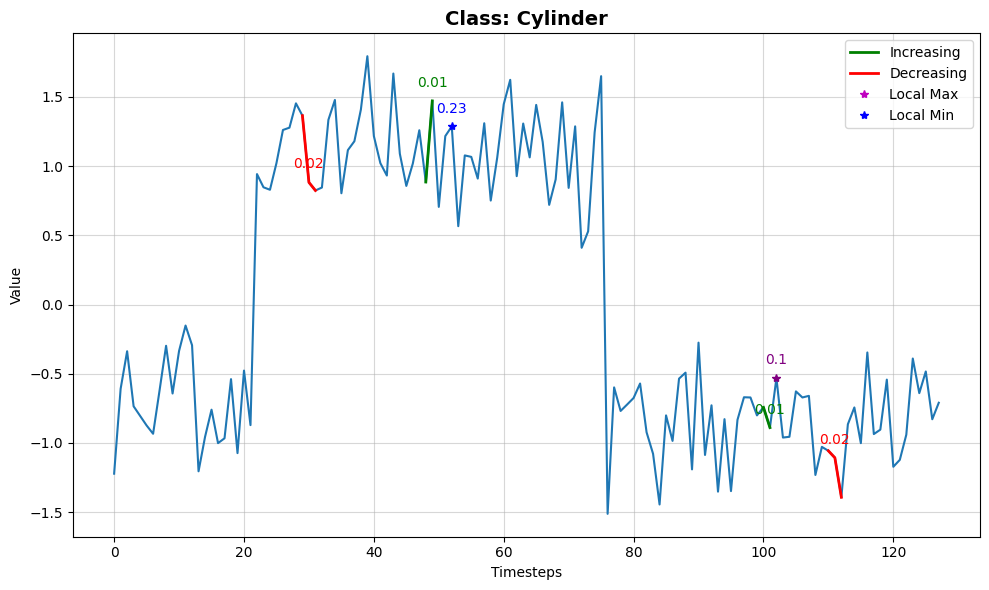

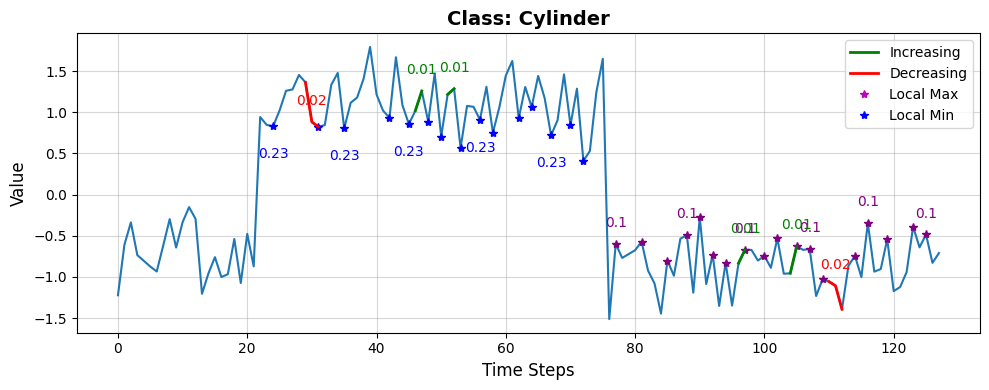

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.7201, 0.1571, 0.1228])
Cylinder:                      0.7201
Bell:                      0.1571
Funnel:                      0.1228


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16114 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12675 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35156 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35266 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.86
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.67
INFO:lomatce.explainer:Model Type: Ridge


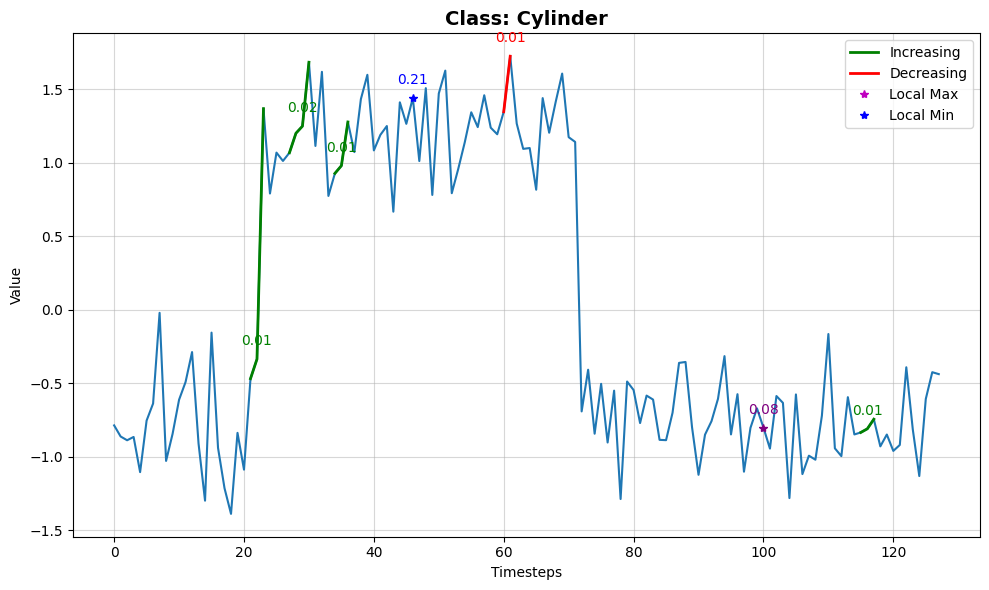

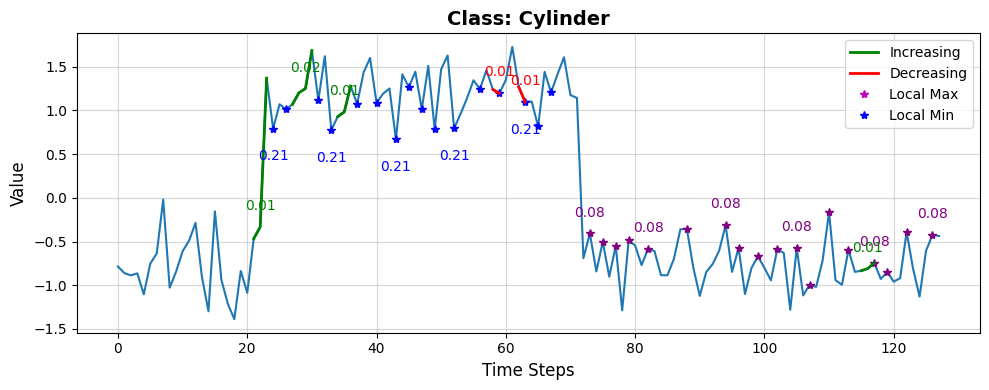

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.7111, 0.1829, 0.1060])
Cylinder:                      0.7111
Bell:                      0.1829
Funnel:                      0.1060


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13494 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13556 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40140 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38679 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.81
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.83
INFO:lomatce.explainer:Model Type: Ridge


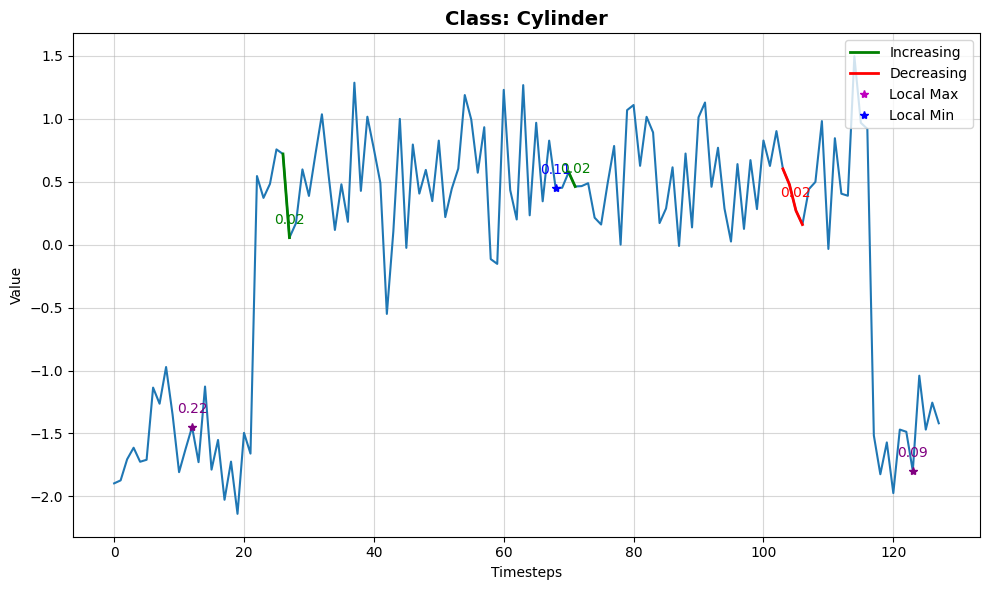

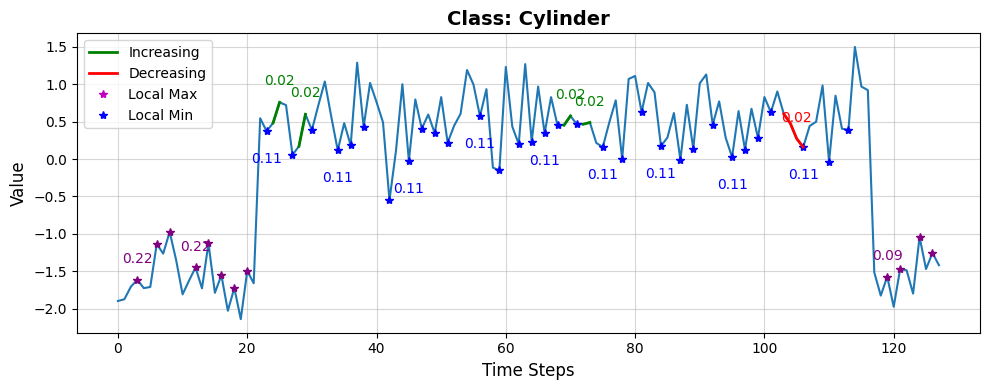

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.8507, 0.0889, 0.0604])
Cylinder:                      0.8507
Bell:                      0.0889
Funnel:                      0.0604


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14321 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14168 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40151 samples)
Optimal number of clusters for LocalMax_ch1: 2
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40724 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.91
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


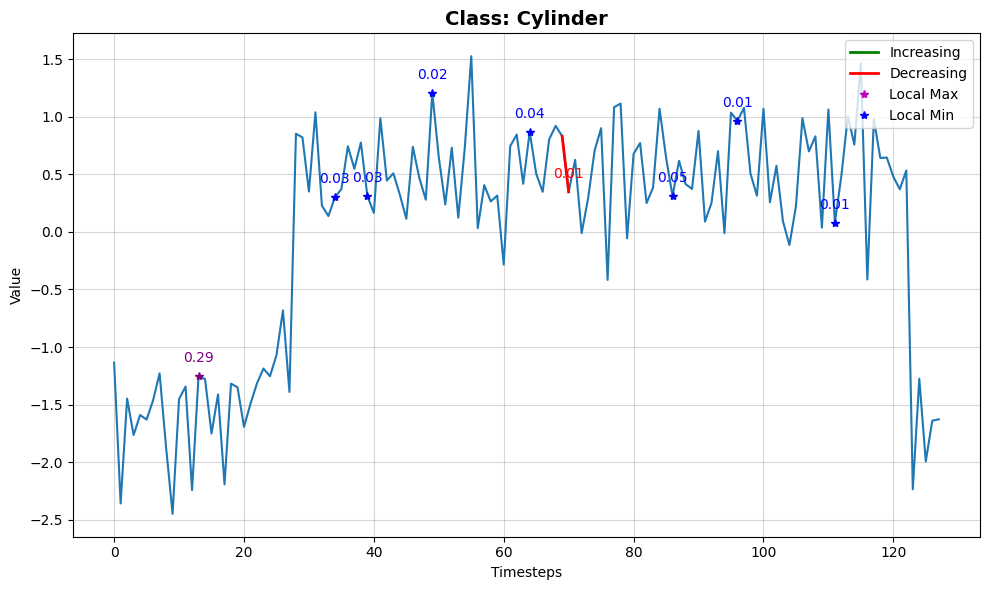

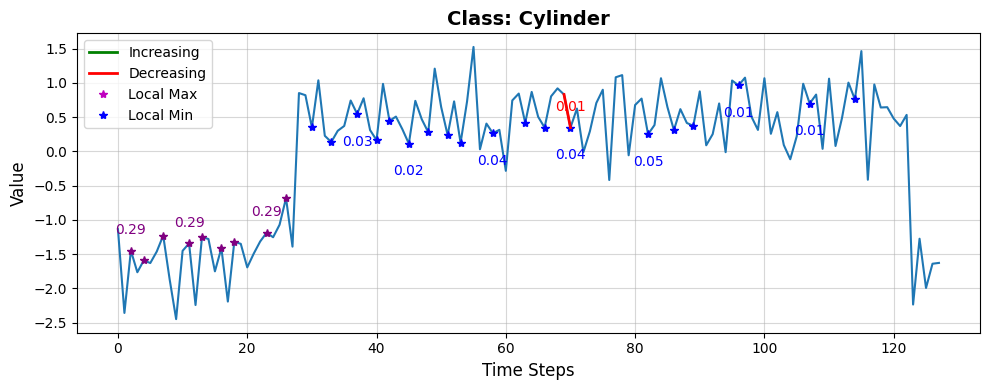

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.7859, 0.1152, 0.0989])
Cylinder:                      0.7859
Bell:                      0.1152
Funnel:                      0.0989


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12272 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15201 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38300 samples)
Optimal number of clusters for LocalMax_ch1: 4
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36870 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.71
INFO:lomatce.explainer:Model Type: Ridge


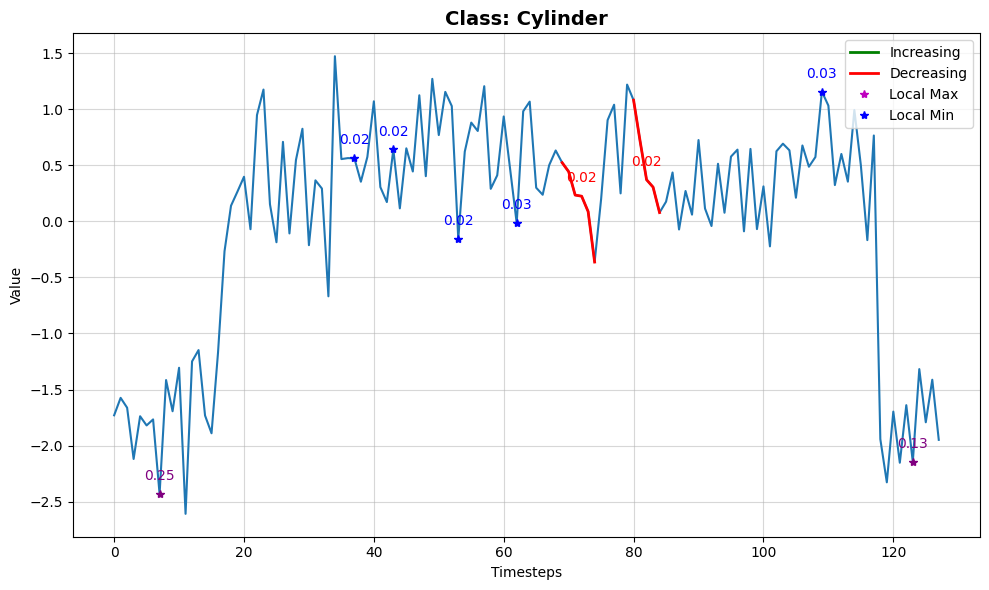

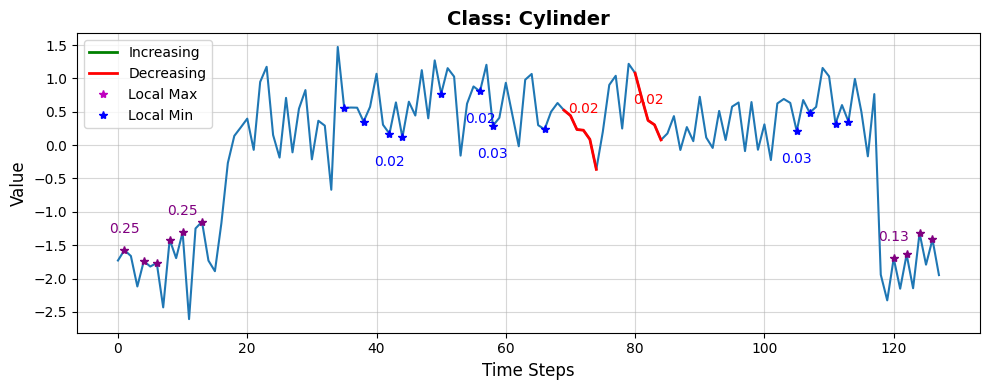

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.7347, 0.1326, 0.1327])
Cylinder:                      0.7347
Bell:                      0.1326
Funnel:                      0.1327


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10775 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16984 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37086 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36594 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.94
INFO:lomatce.explainer:Model Type: Ridge


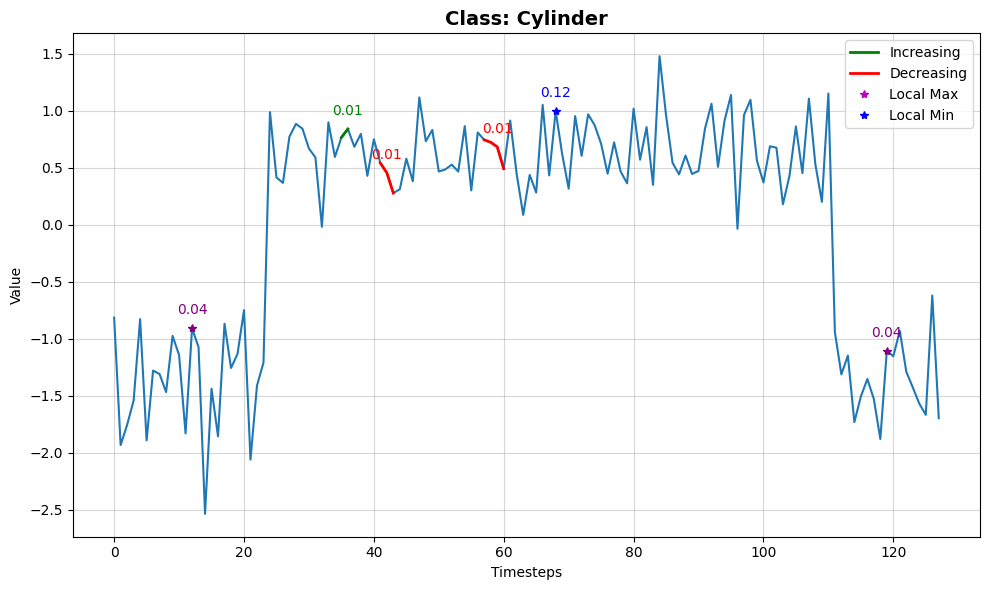

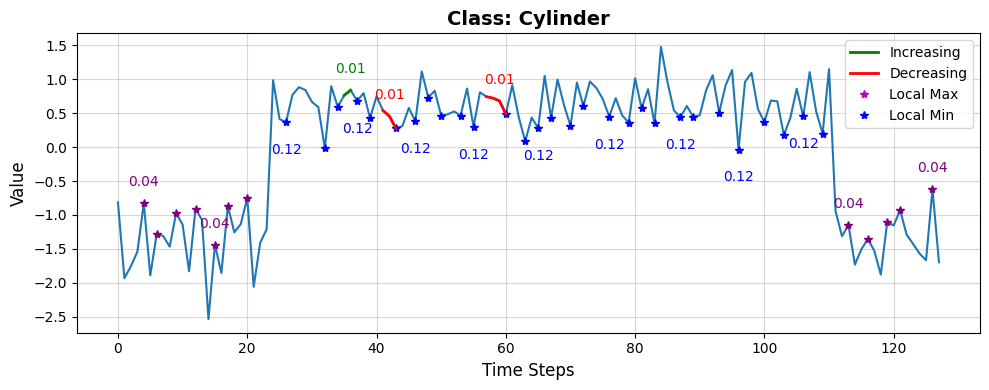

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.9443, 0.0275, 0.0282])
Cylinder:                      0.9443
Bell:                      0.0275
Funnel:                      0.0282


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15260 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10863 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36474 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36958 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 42) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 42


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.77
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.91
INFO:lomatce.explainer:Model Type: Ridge


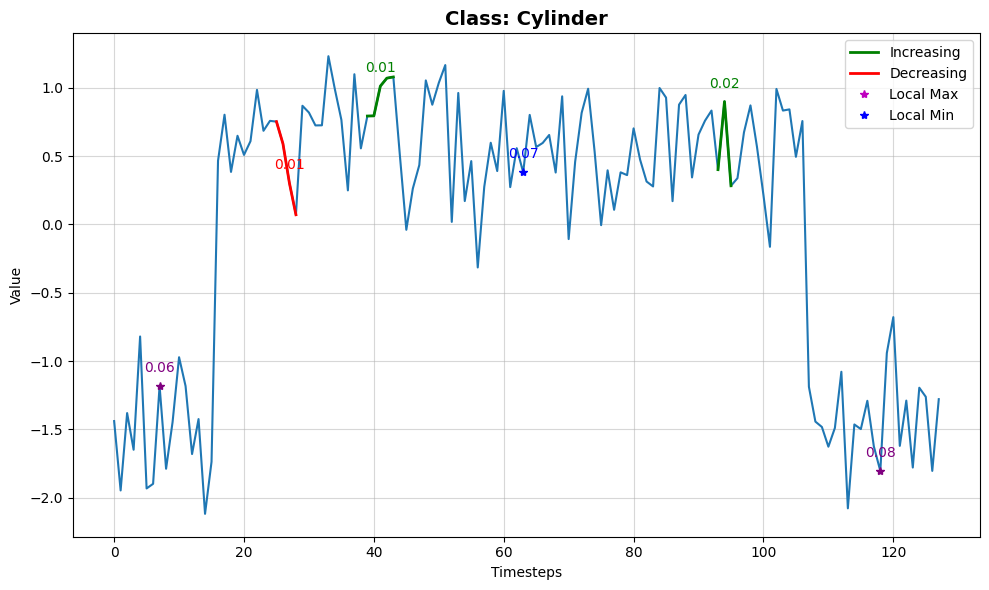

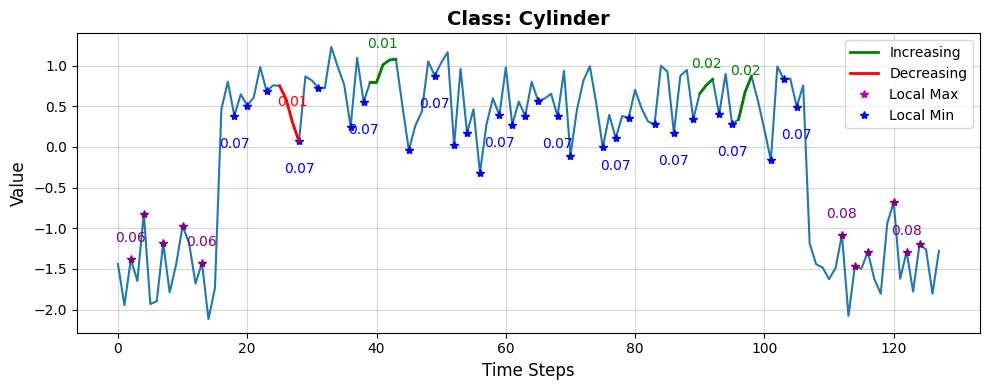

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.9205, 0.0412, 0.0383])
Cylinder:                      0.9205
Bell:                      0.0412
Funnel:                      0.0383


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15307 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16775 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32918 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32482 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.58
INFO:lomatce.explainer:Model Type: Ridge


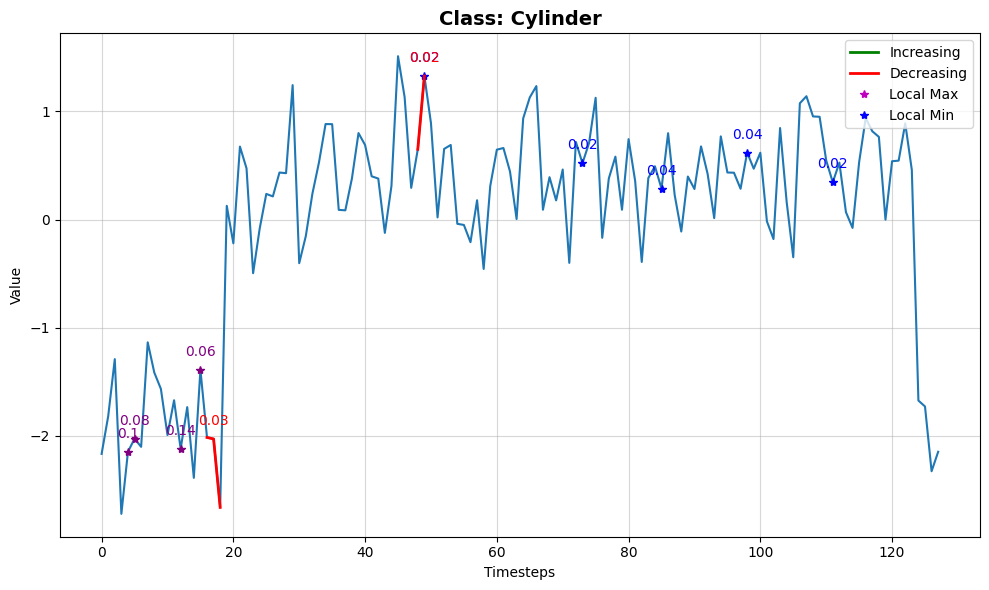

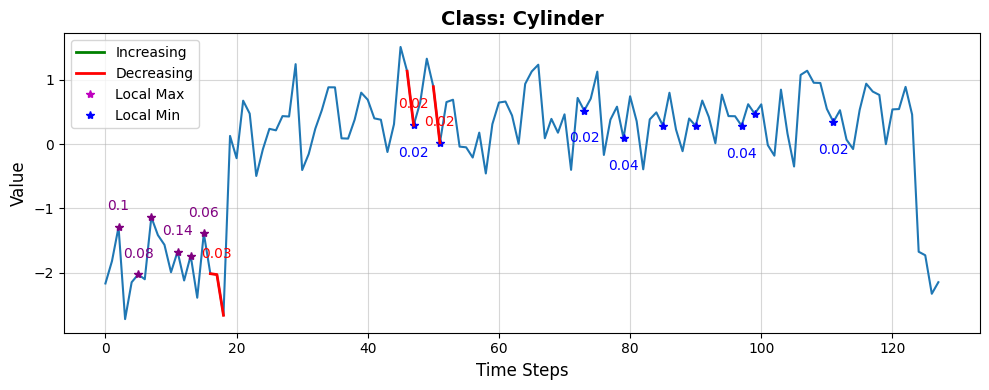

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.6069, 0.2123, 0.1808])
Cylinder:                      0.6069
Bell:                      0.2123
Funnel:                      0.1808


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14275 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12492 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37384 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37922 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.83
INFO:lomatce.explainer:Model Type: Ridge


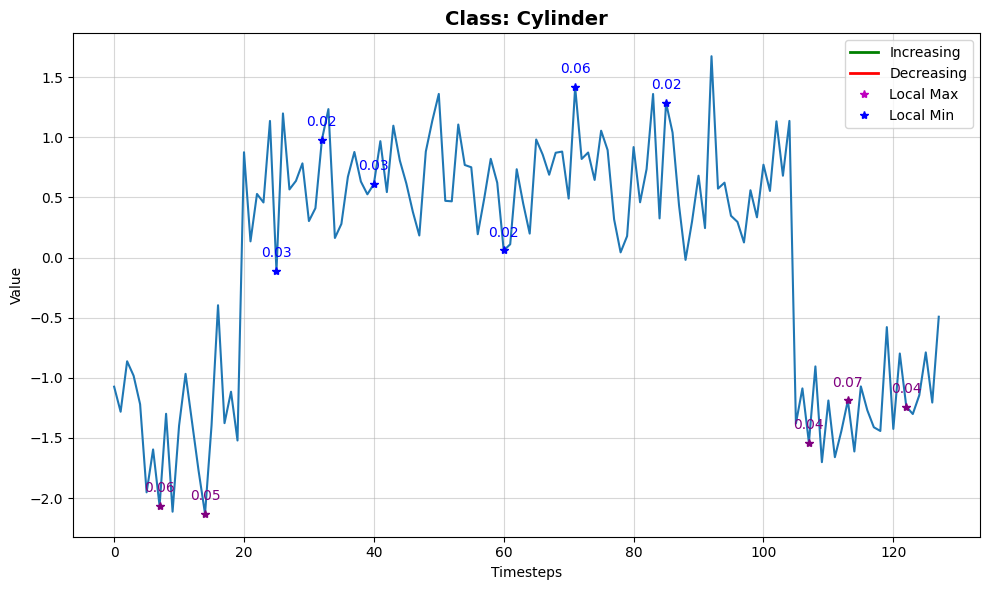

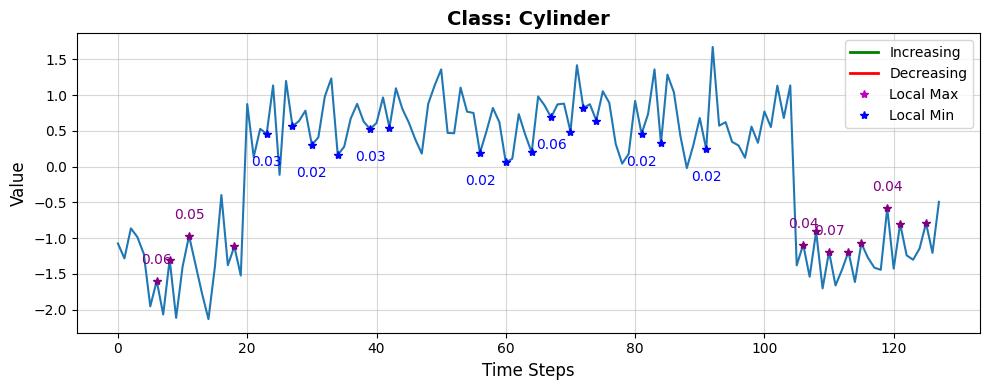

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.8490, 0.0841, 0.0669])
Cylinder:                      0.8490
Bell:                      0.0841
Funnel:                      0.0669


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15449 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15085 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35485 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35075 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.89
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.91
INFO:lomatce.explainer:Model Type: Ridge


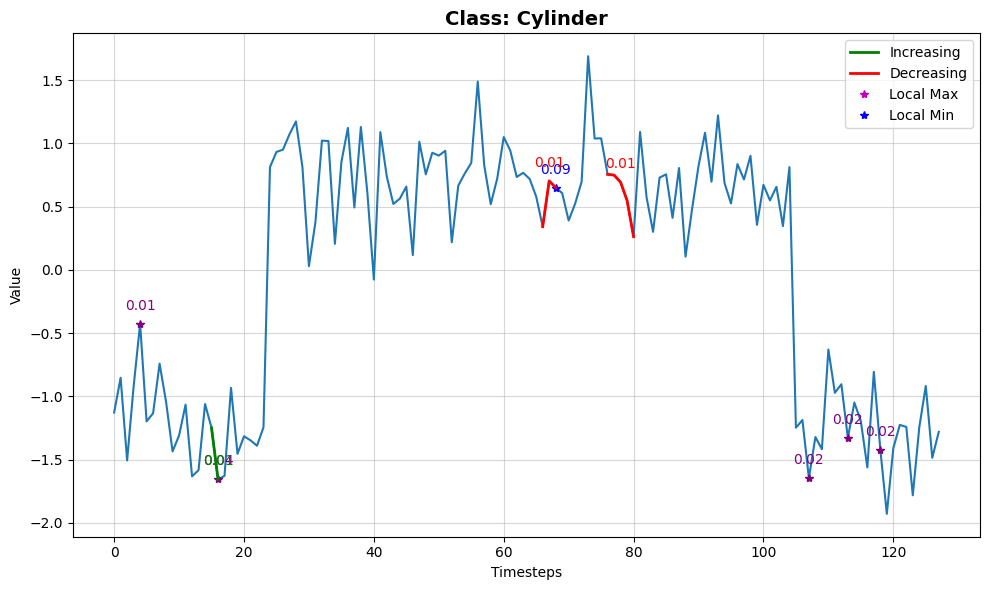

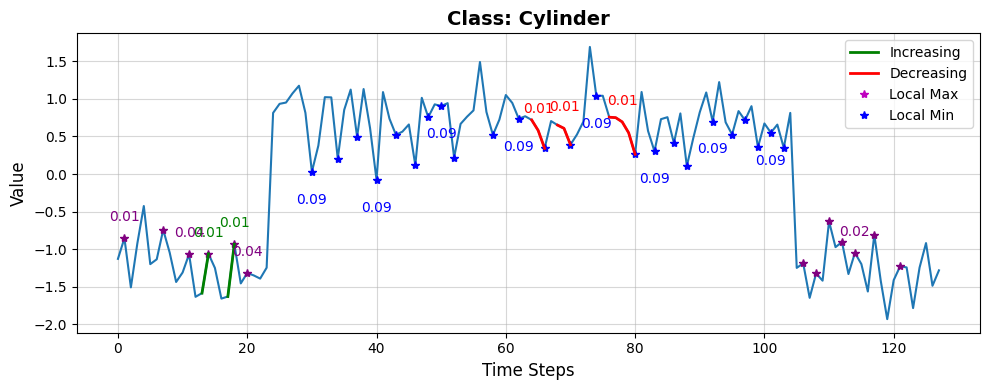

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.9268, 0.0263, 0.0469])
Cylinder:                      0.9268
Bell:                      0.0263
Funnel:                      0.0469


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14508 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12316 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38000 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38054 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.86
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.69
INFO:lomatce.explainer:Model Type: Ridge


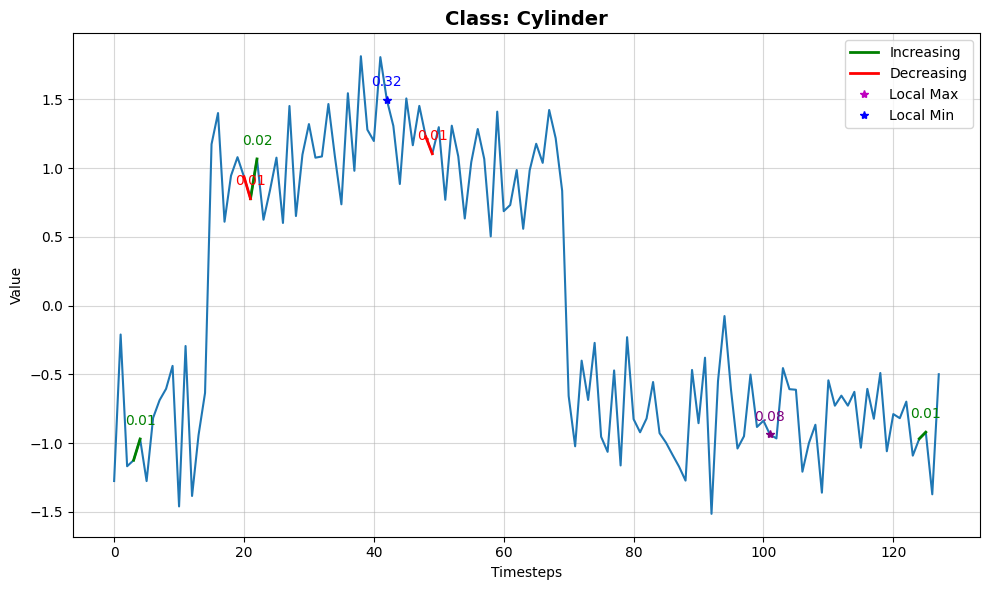

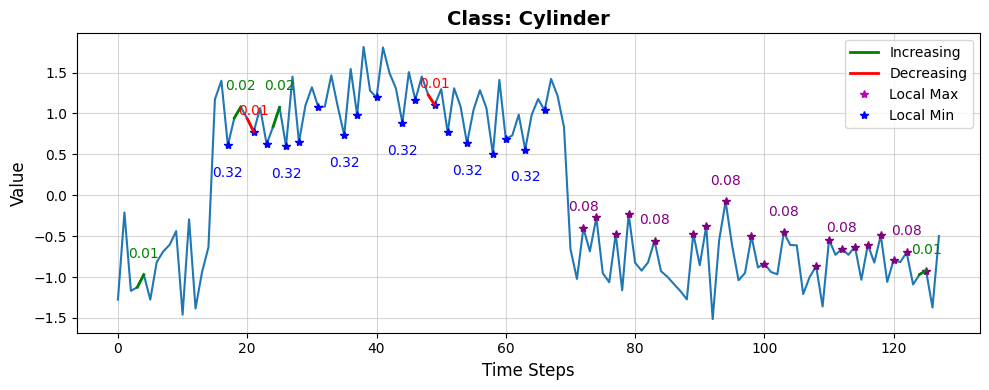

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.7280, 0.1439, 0.1282])
Cylinder:                      0.7280
Bell:                      0.1439
Funnel:                      0.1282


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16851 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11609 samples)
Optimal number of clusters for Decreasing_ch1: 15
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36134 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36284 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 40) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 40


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.88
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.36
INFO:lomatce.explainer:Model Type: Ridge


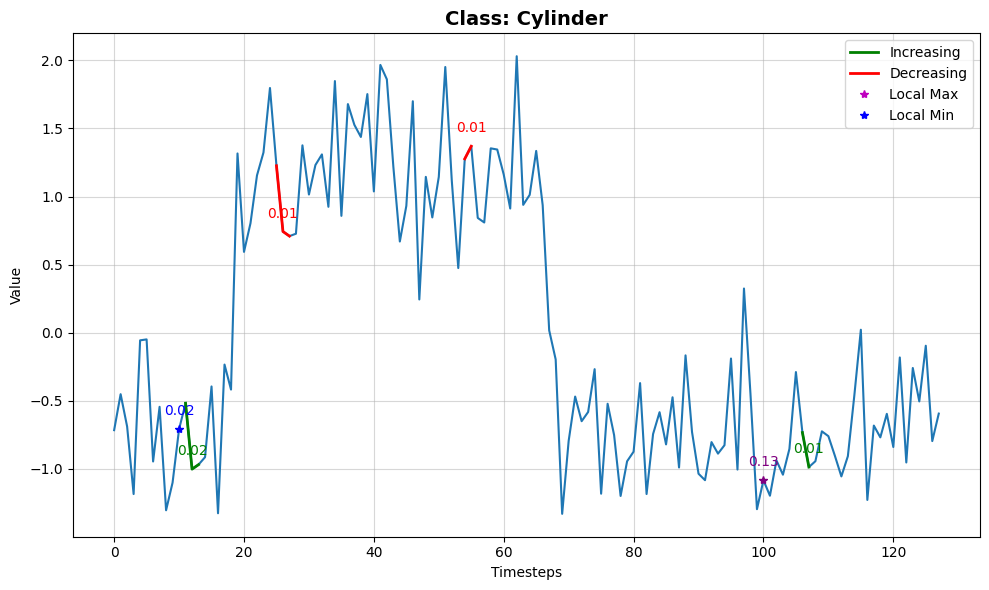

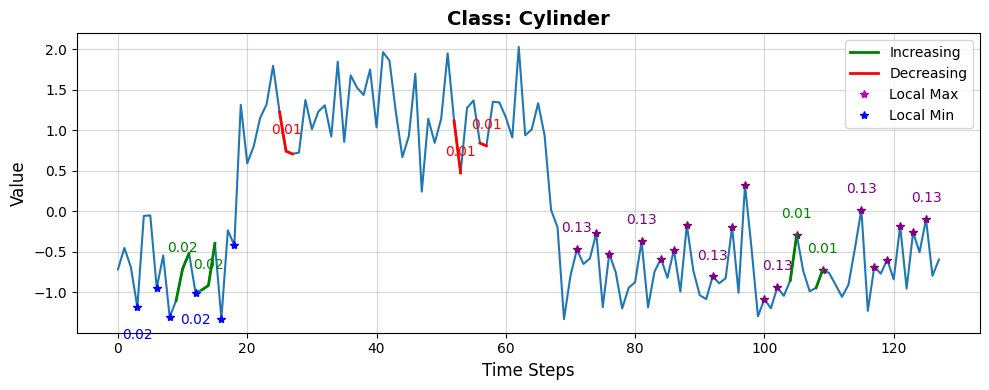

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.3988, 0.3811, 0.2201])
Cylinder:                      0.3988
Bell:                      0.3811
Funnel:                      0.2201


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12446 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15236 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36933 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37008 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.86
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.55
INFO:lomatce.explainer:Model Type: Ridge


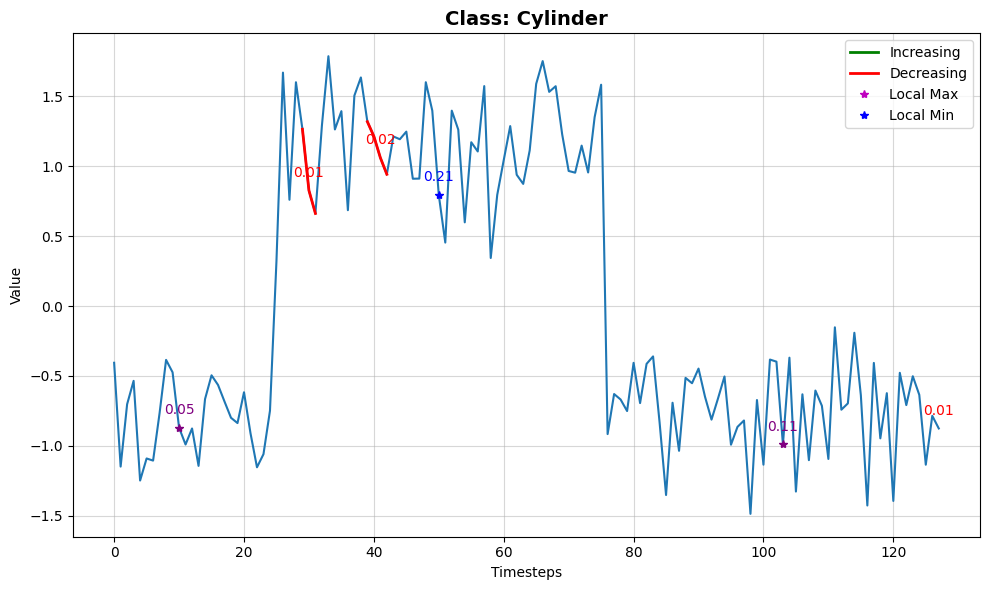

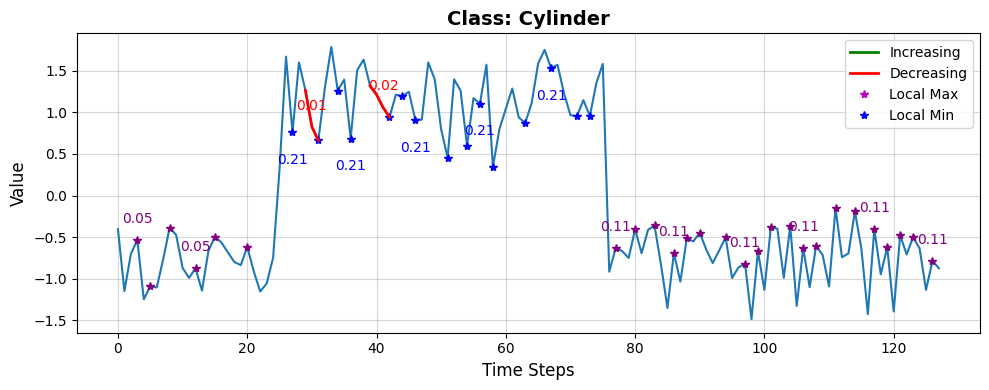

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.5912, 0.1993, 0.2095])
Cylinder:                      0.5912
Bell:                      0.1993
Funnel:                      0.2095


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15923 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16270 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34603 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34125 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.9
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.82
INFO:lomatce.explainer:Model Type: Ridge


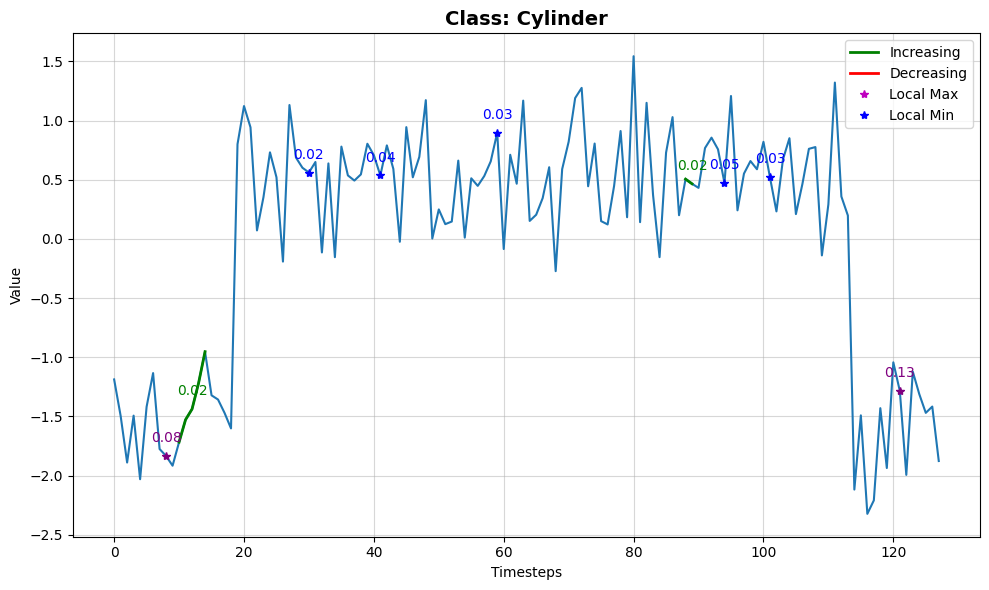

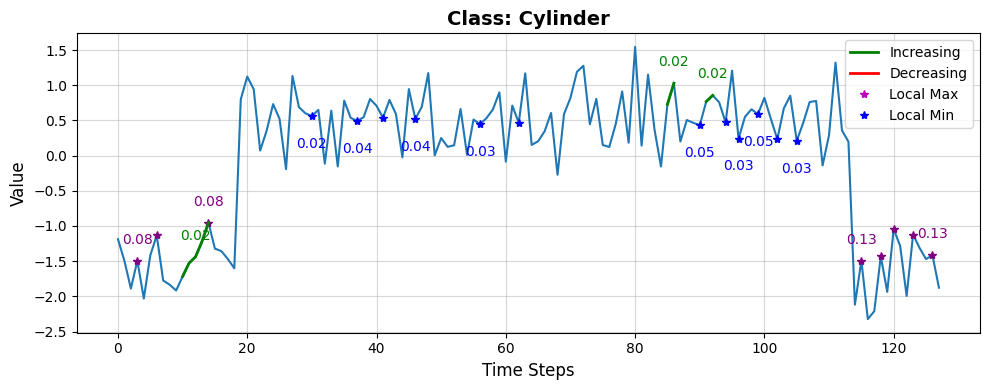

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.8366, 0.0808, 0.0826])
Cylinder:                      0.8366
Bell:                      0.0808
Funnel:                      0.0826


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12753 samples)
Optimal number of clusters for Increasing_ch1: 11
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15145 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37025 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37952 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 36) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 36


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.85
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


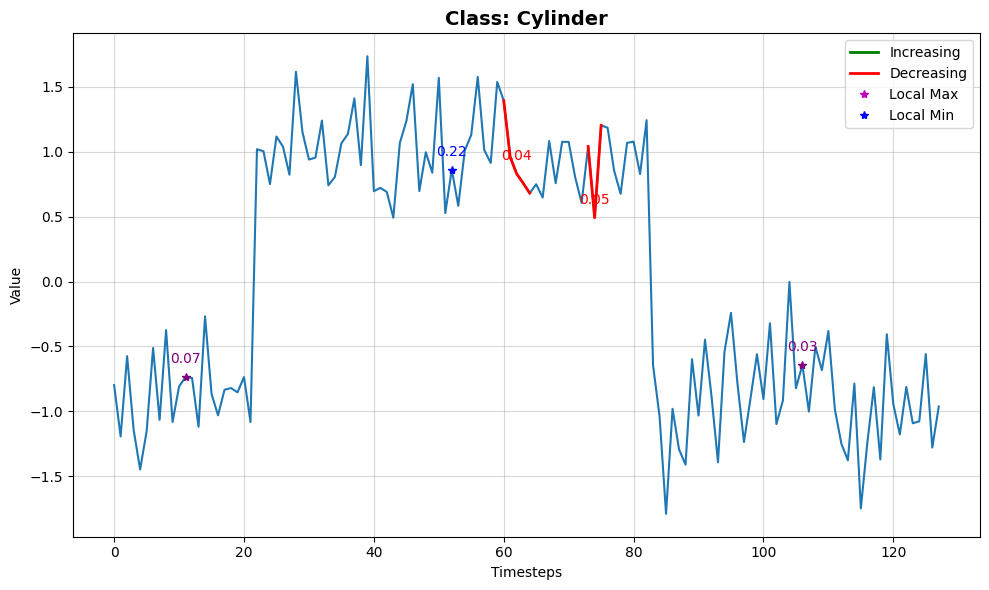

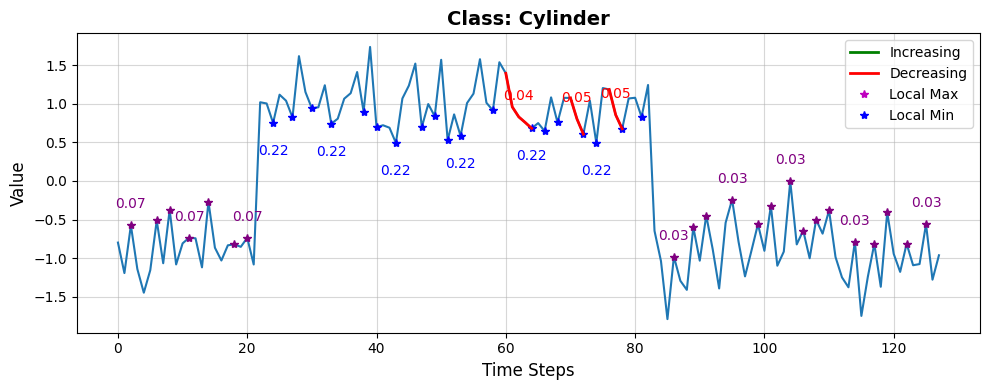

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.7827, 0.1208, 0.0966])
Cylinder:                      0.7827
Bell:                      0.1208
Funnel:                      0.0966


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16886 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13242 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37967 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37525 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.86
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.85
INFO:lomatce.explainer:Model Type: Ridge


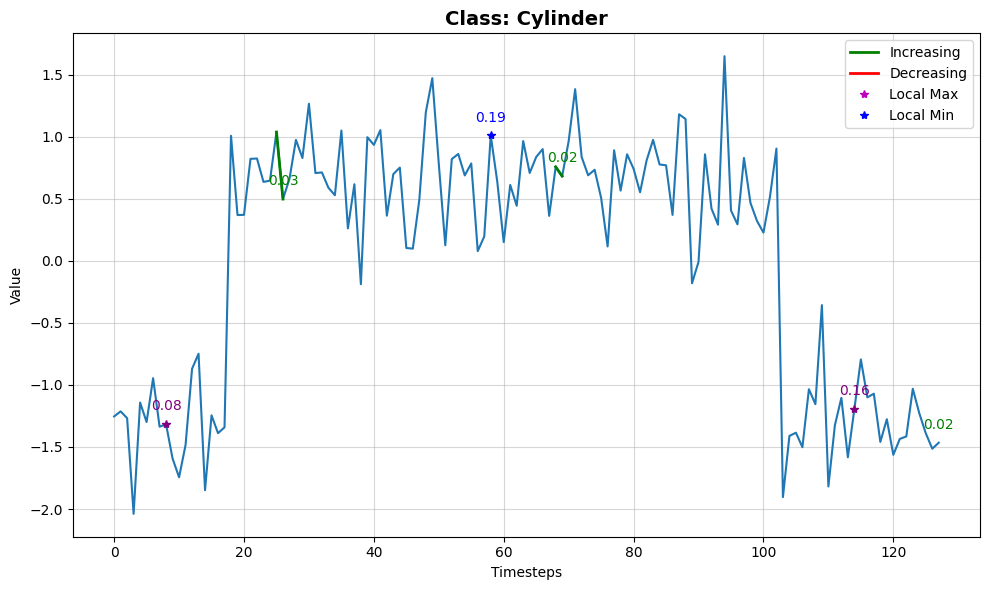

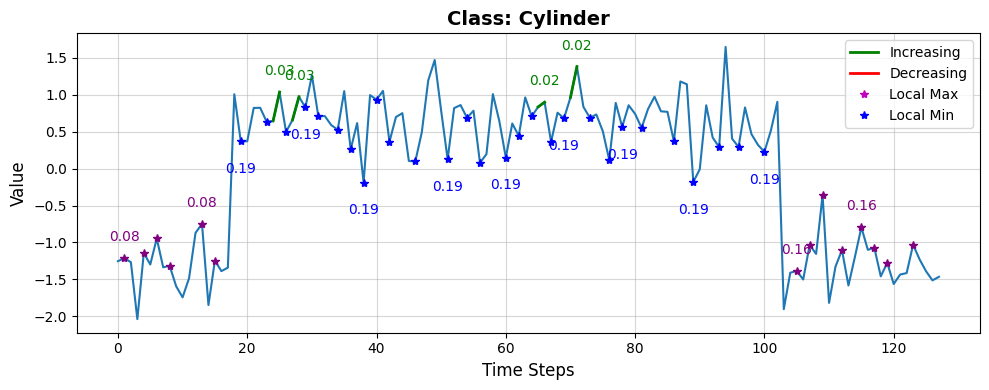

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.8710, 0.0610, 0.0681])
Cylinder:                      0.8710
Bell:                      0.0610
Funnel:                      0.0681


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 7236 samples)
Optimal number of clusters for Increasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15222 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39270 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39214 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 40) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 40


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.7
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.69
INFO:lomatce.explainer:Model Type: Ridge


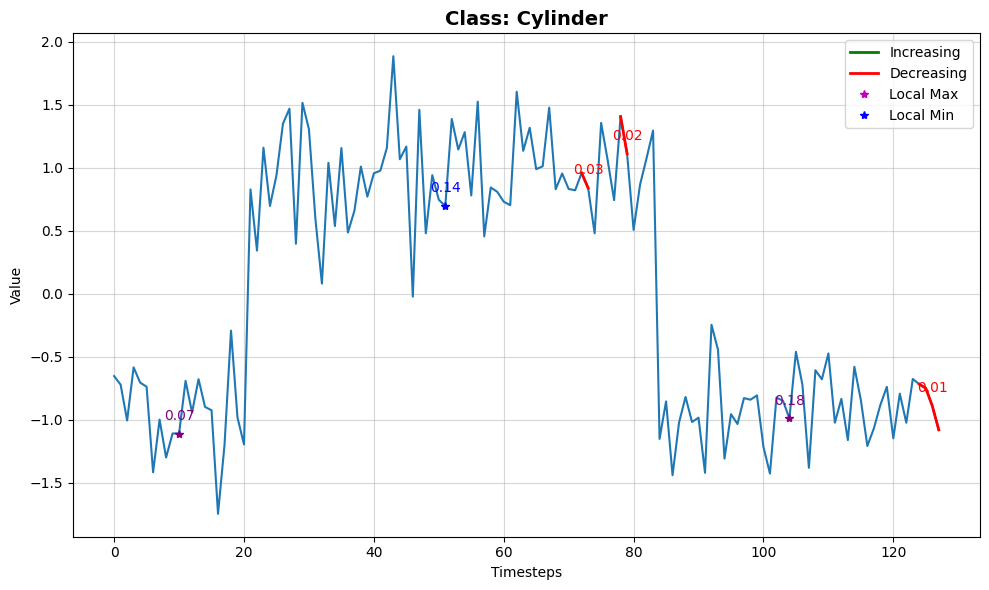

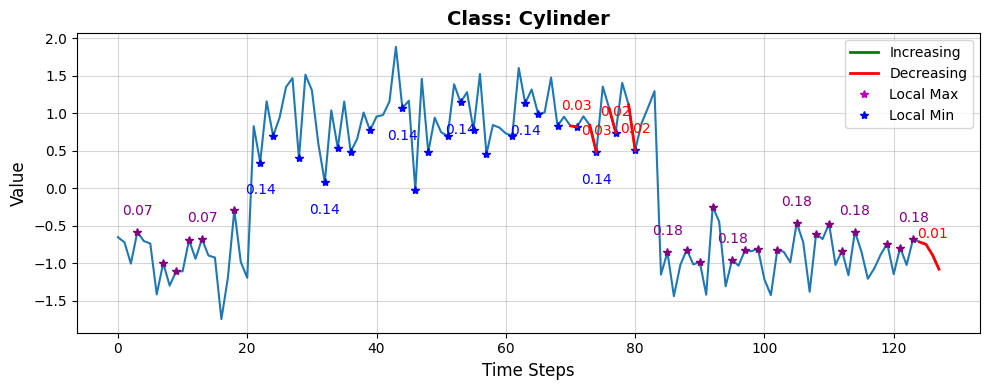

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.7253, 0.1606, 0.1142])
Cylinder:                      0.7253
Bell:                      0.1606
Funnel:                      0.1142


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16097 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10816 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37792 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37671 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.91
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.78
INFO:lomatce.explainer:Model Type: Ridge


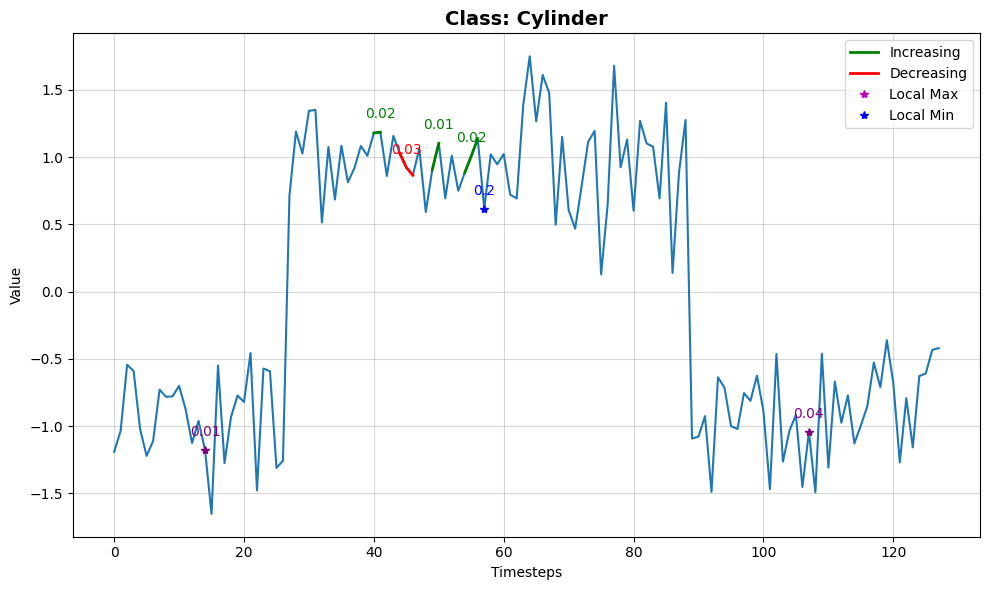

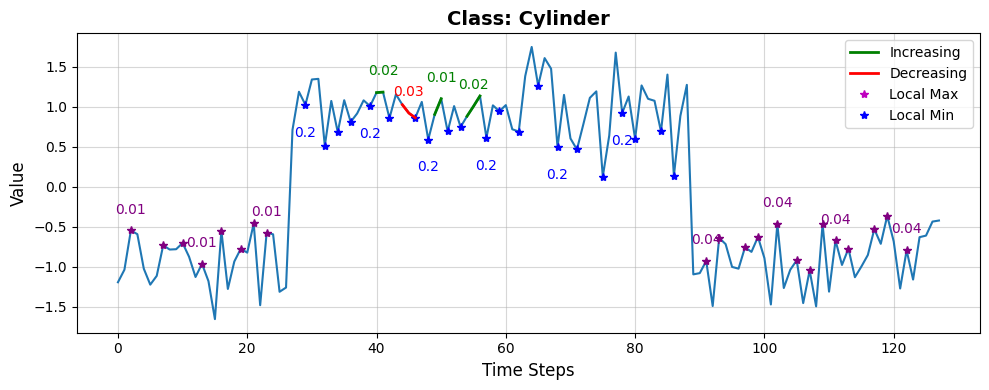

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.8071, 0.0990, 0.0939])
Cylinder:                      0.8071
Bell:                      0.0990
Funnel:                      0.0939


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13399 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13132 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39096 samples)
Optimal number of clusters for LocalMax_ch1: 2
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39621 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.42
INFO:lomatce.explainer:Model Type: Ridge


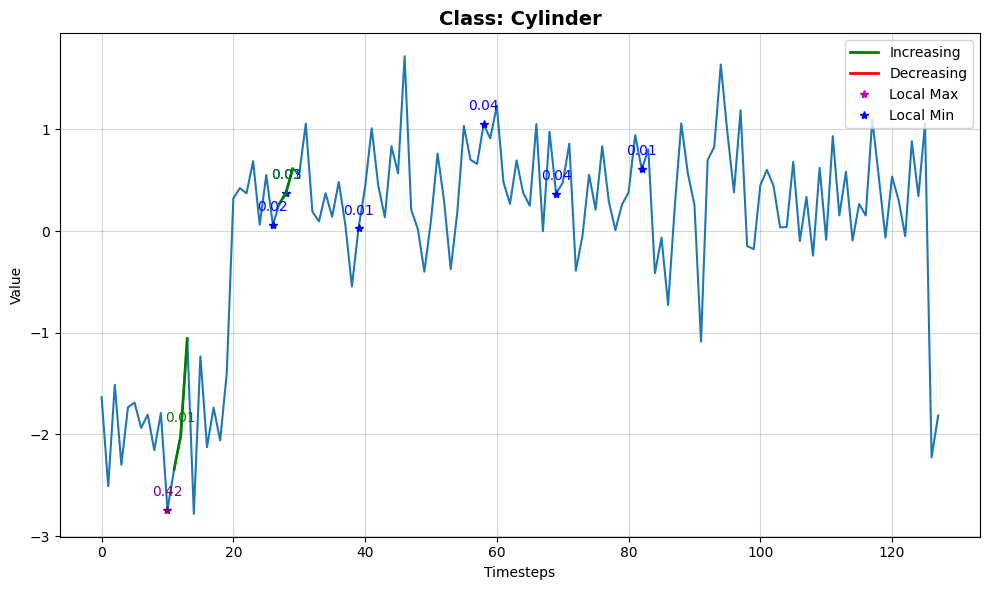

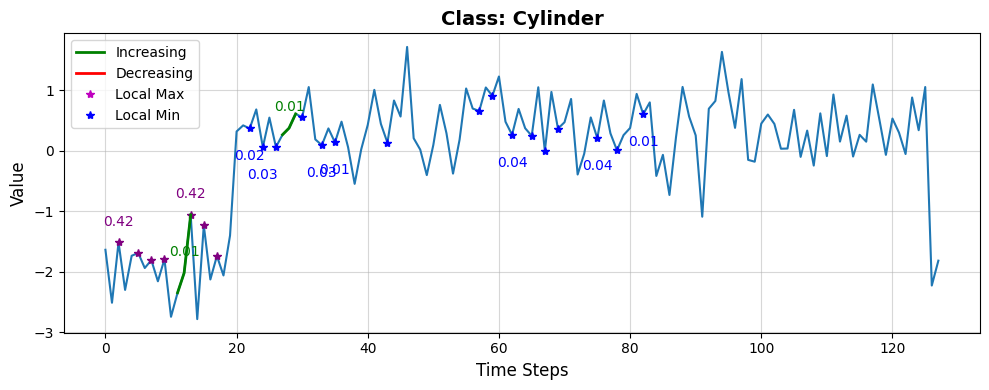

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.4461, 0.2508, 0.3031])
Cylinder:                      0.4461
Bell:                      0.2508
Funnel:                      0.3031


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13496 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19535 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34658 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33160 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.9
INFO:lomatce.explainer:Model Type: Ridge


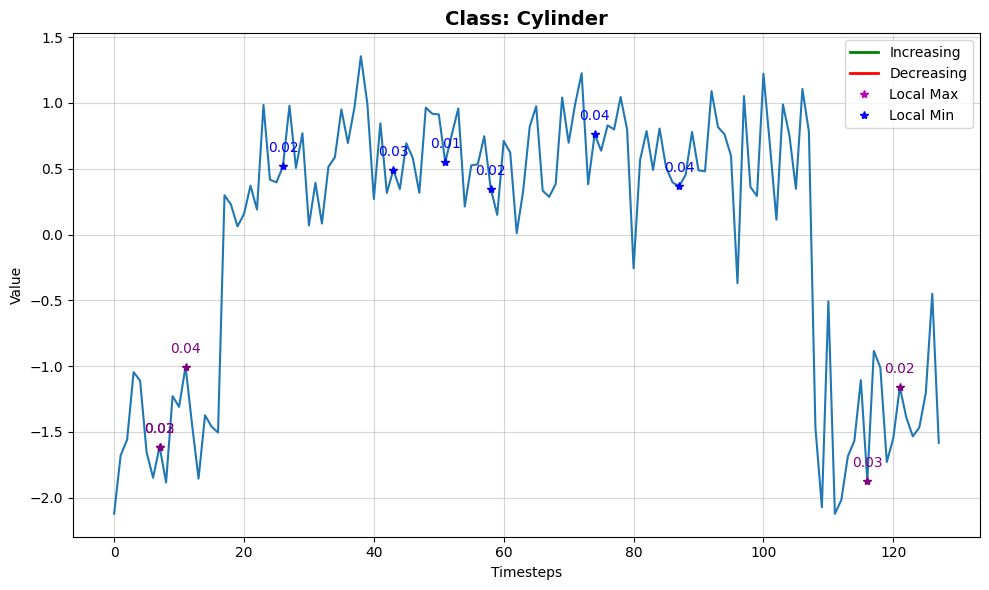

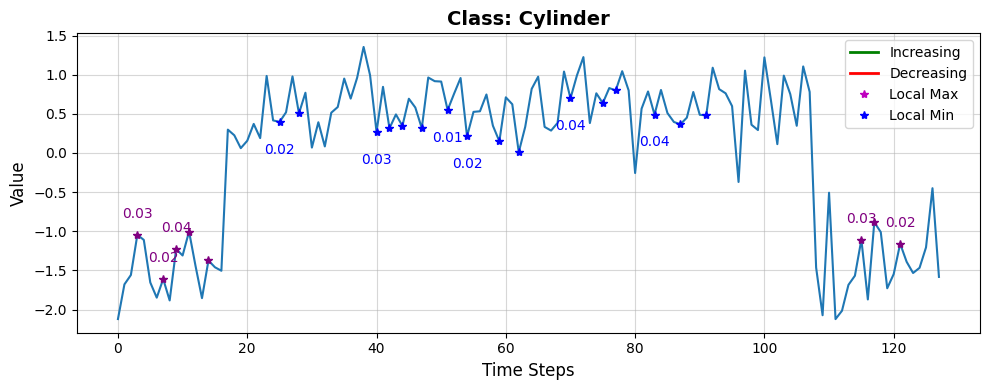

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.9100, 0.0590, 0.0310])
Cylinder:                      0.9100
Bell:                      0.0590
Funnel:                      0.0310

📈 Global Faithfulness (Avg Local Fidelity): 0.8781

=== Running SP-LOMATCE for class Bell ===


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14314 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12488 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37591 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36668 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.63
INFO:lomatce.explainer:Model Type: Ridge


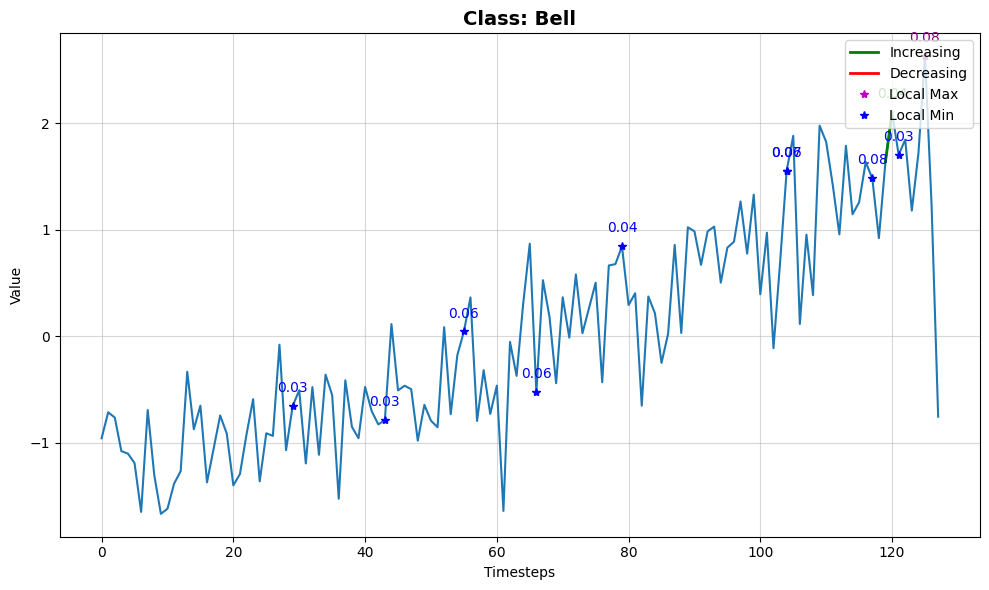

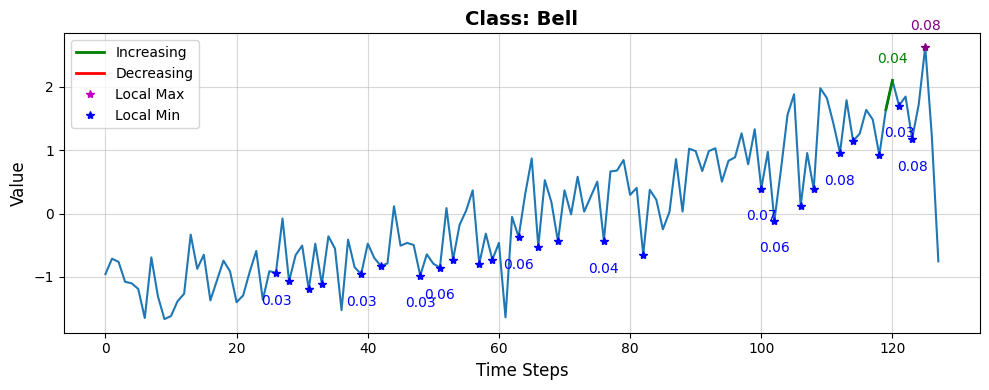

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2183, 0.6137, 0.1679])
Cylinder:                      0.2183
Bell:                      0.6137
Funnel:                      0.1679


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 8340 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17958 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37519 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37841 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.35
INFO:lomatce.explainer:Model Type: Ridge


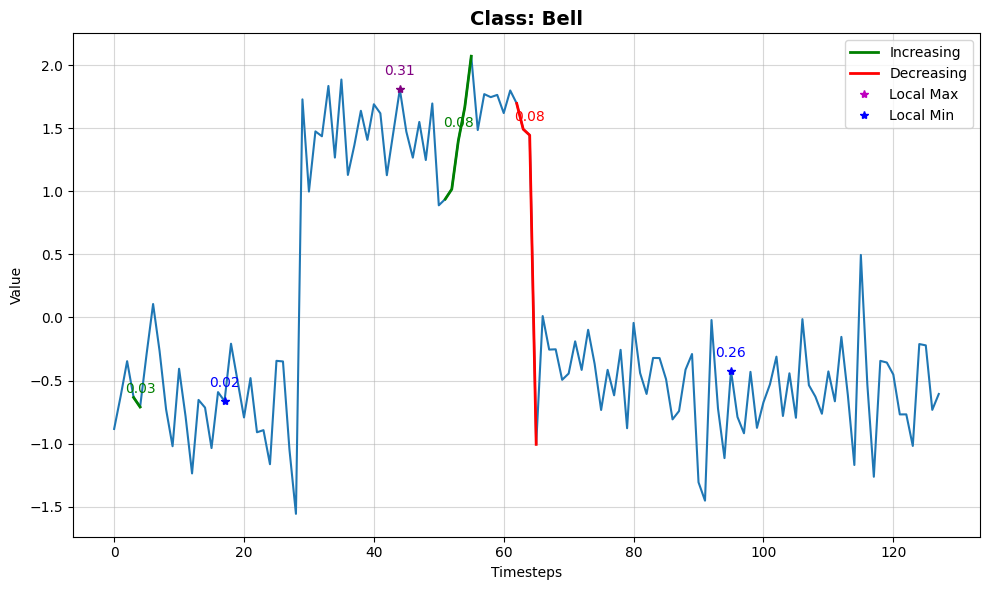

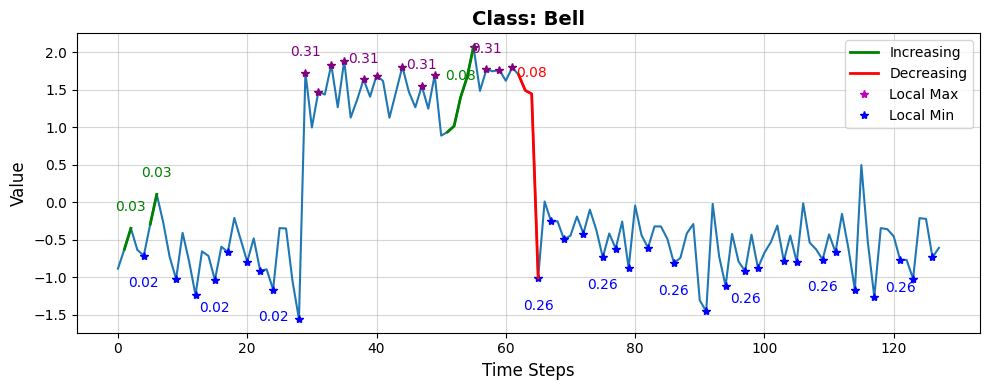

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.3167, 0.3442, 0.3391])
Cylinder:                      0.3167
Bell:                      0.3442
Funnel:                      0.3391


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15934 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14899 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36795 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37850 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.82
INFO:lomatce.explainer:Model Type: Ridge


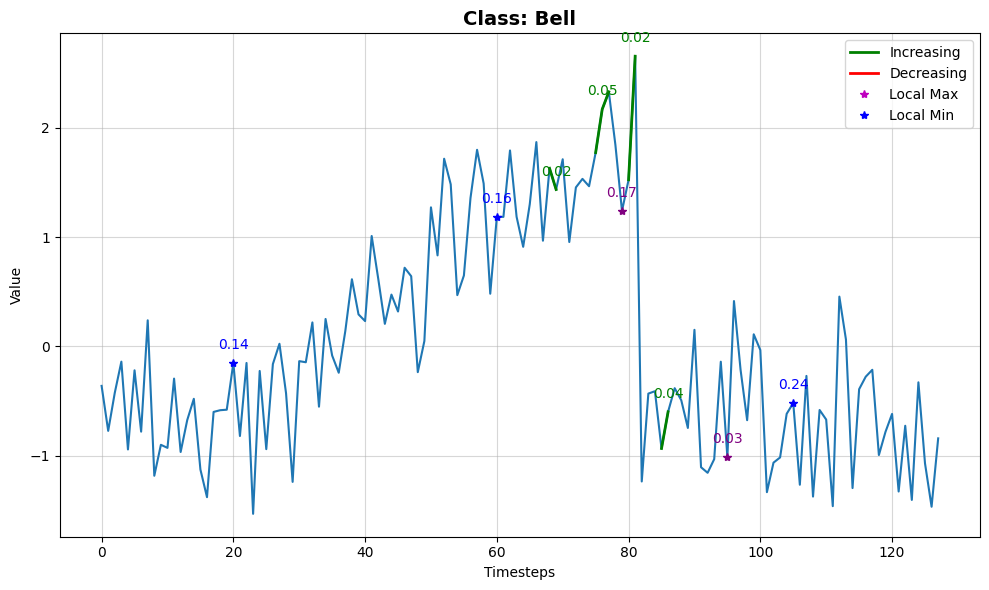

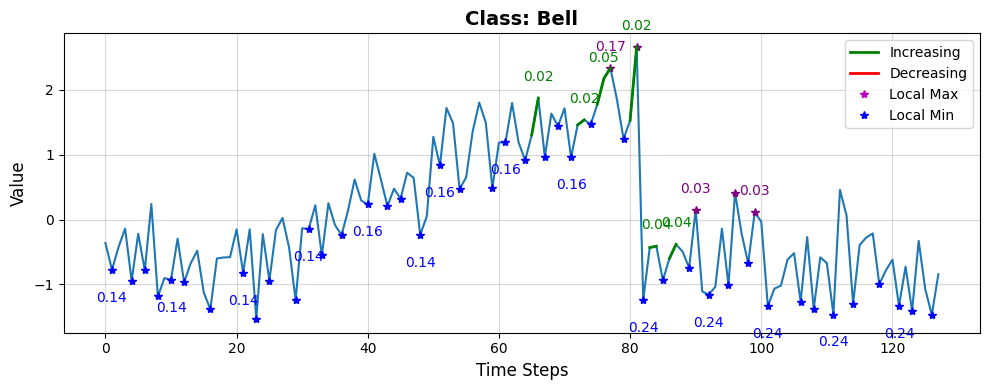

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0861, 0.8208, 0.0931])
Cylinder:                      0.0861
Bell:                      0.8208
Funnel:                      0.0931


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14264 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14419 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37867 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38874 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.68
INFO:lomatce.explainer:Model Type: Ridge


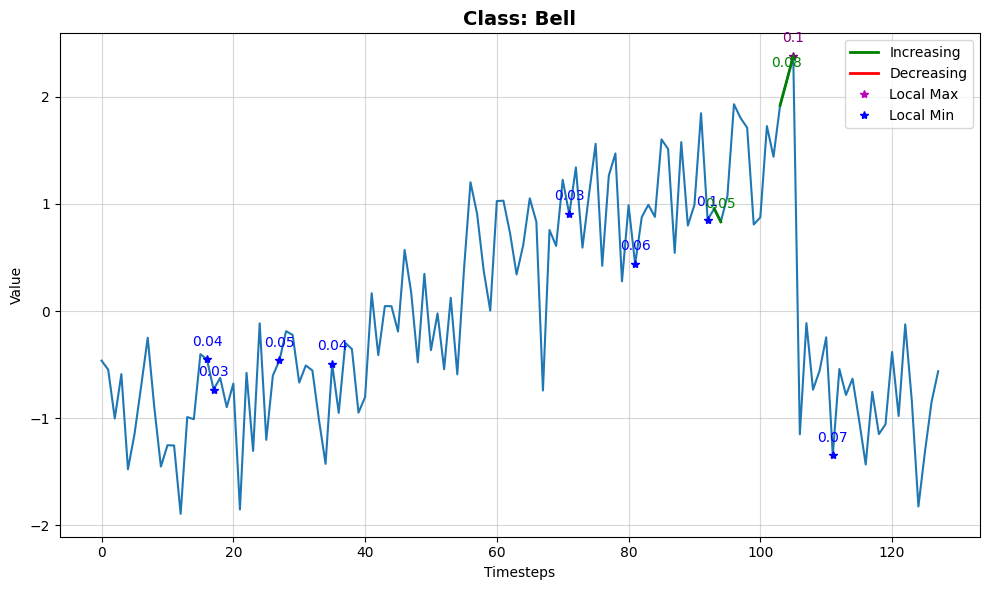

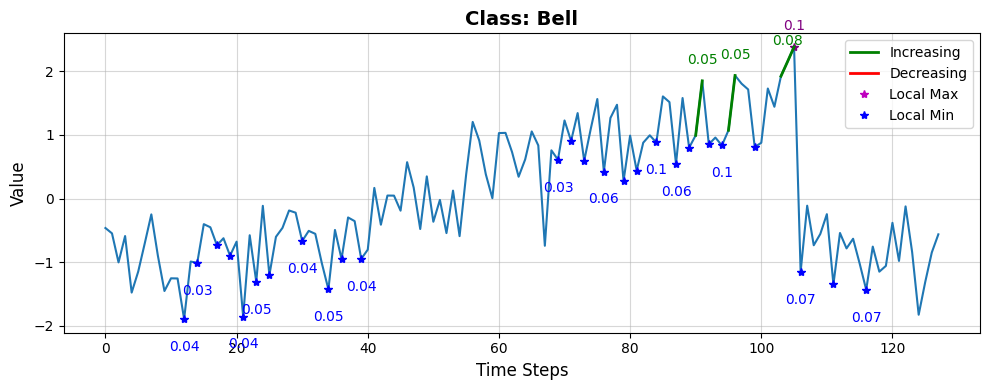

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1837, 0.6706, 0.1457])
Cylinder:                      0.1837
Bell:                      0.6706
Funnel:                      0.1457


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10814 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12762 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38604 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39785 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.87
INFO:lomatce.explainer:Model Type: Ridge


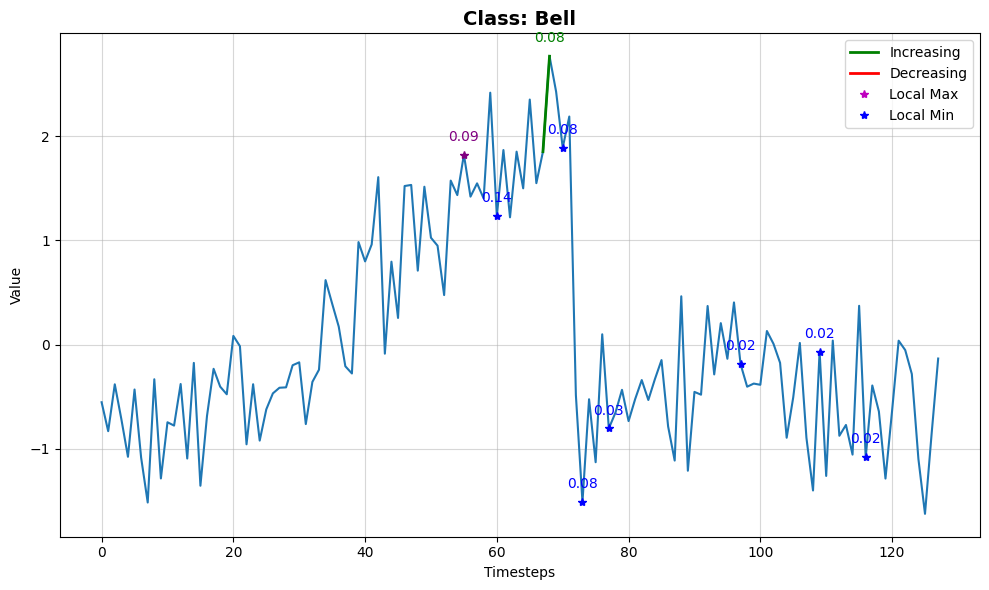

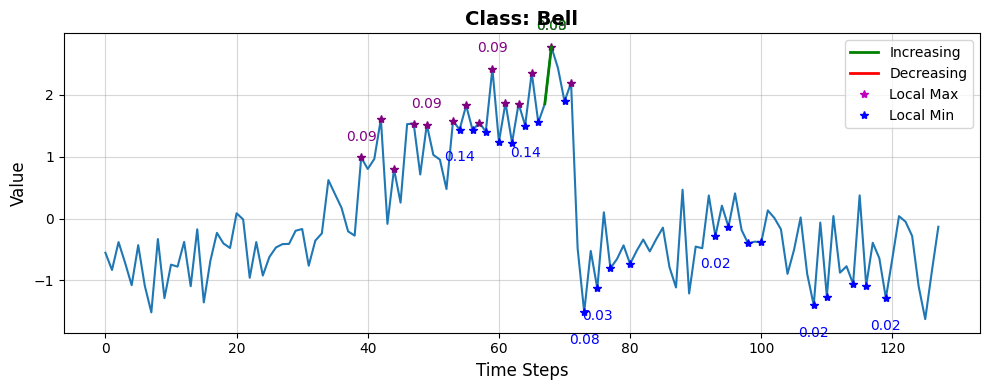

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0535, 0.8615, 0.0851])
Cylinder:                      0.0535
Bell:                      0.8615
Funnel:                      0.0851


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14385 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14399 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37935 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37080 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.88
INFO:lomatce.explainer:Model Type: Ridge


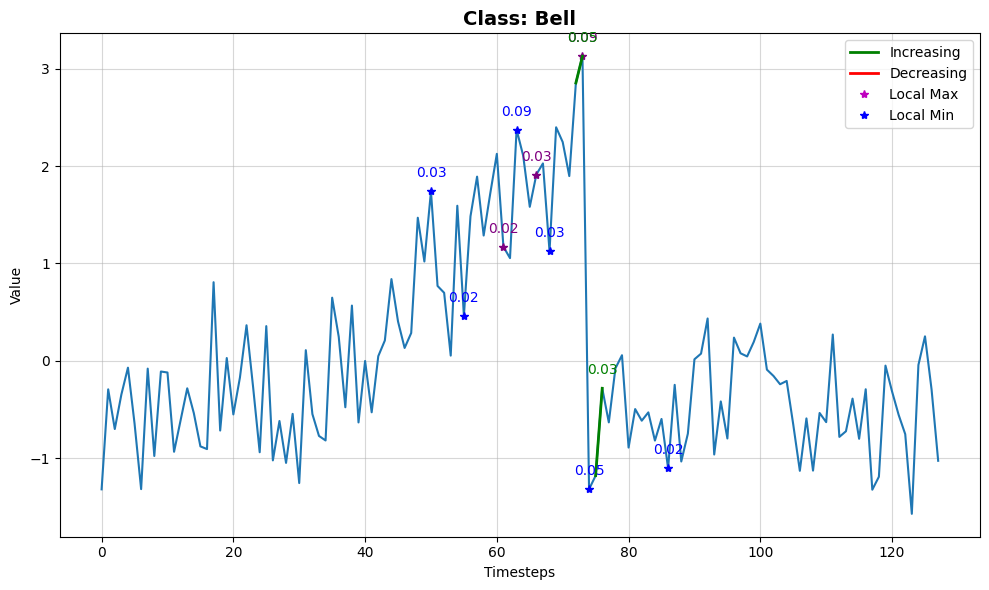

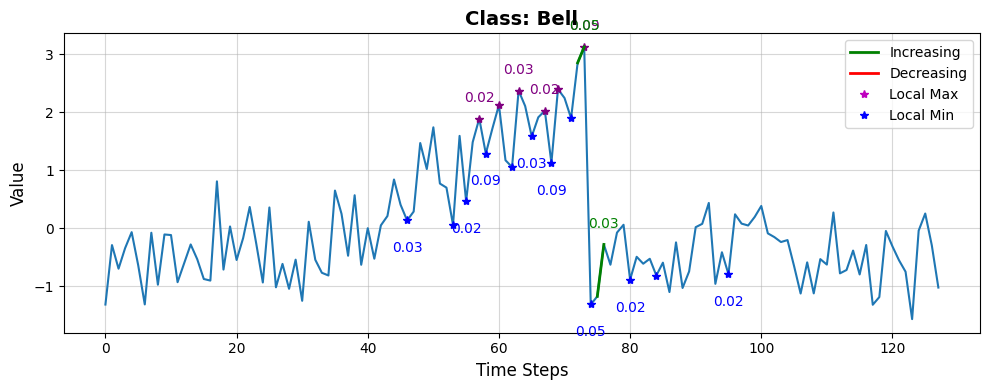

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0276, 0.8747, 0.0977])
Cylinder:                      0.0276
Bell:                      0.8747
Funnel:                      0.0977


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19544 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15111 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33429 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33738 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.83
INFO:lomatce.explainer:Model Type: Ridge


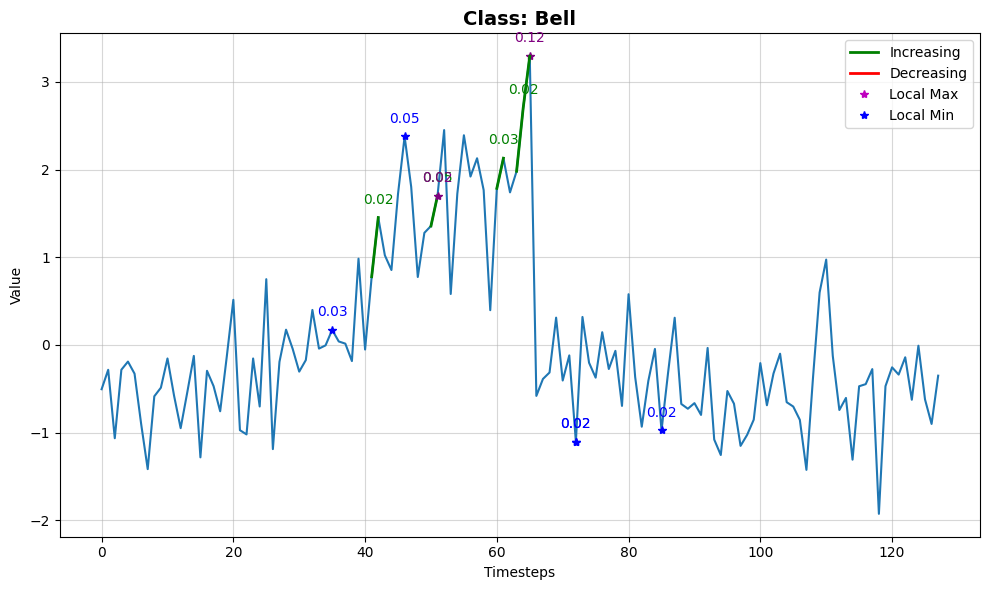

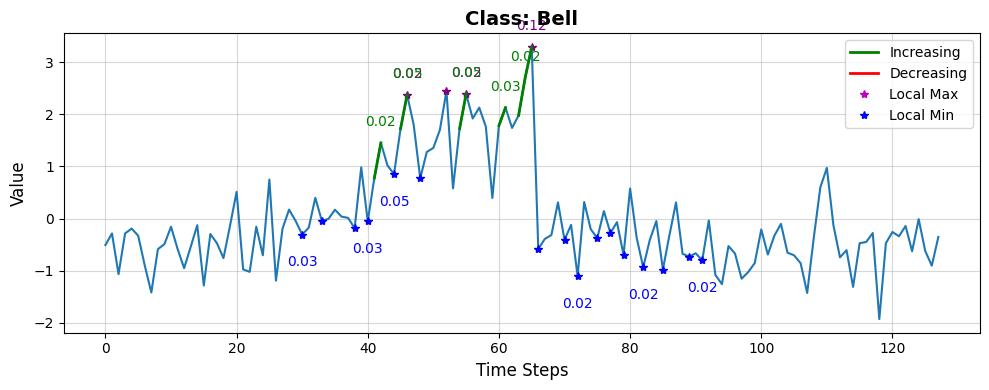

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0290, 0.8354, 0.1356])
Cylinder:                      0.0290
Bell:                      0.8354
Funnel:                      0.1356


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16023 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16084 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35404 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35507 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


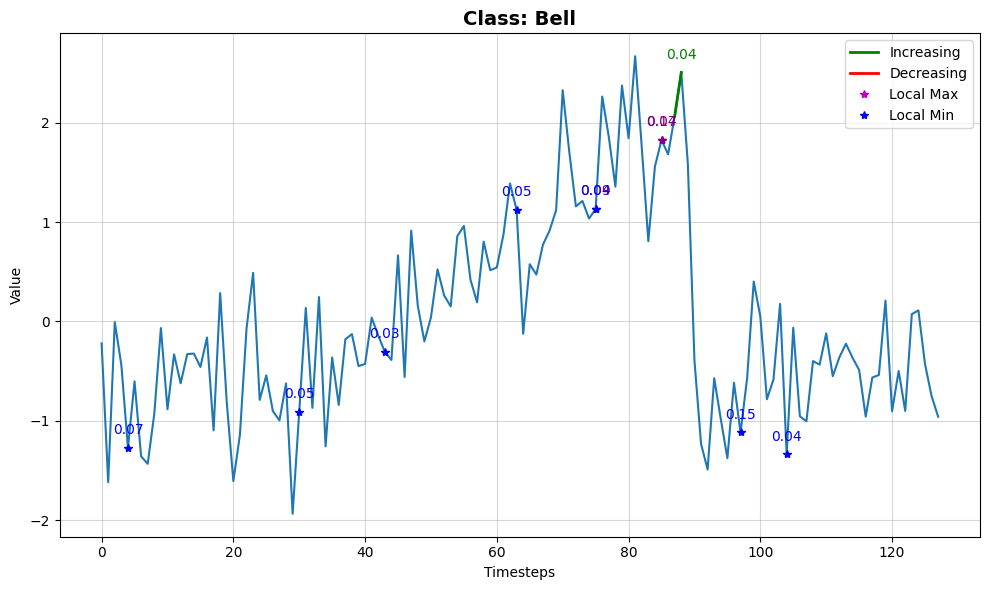

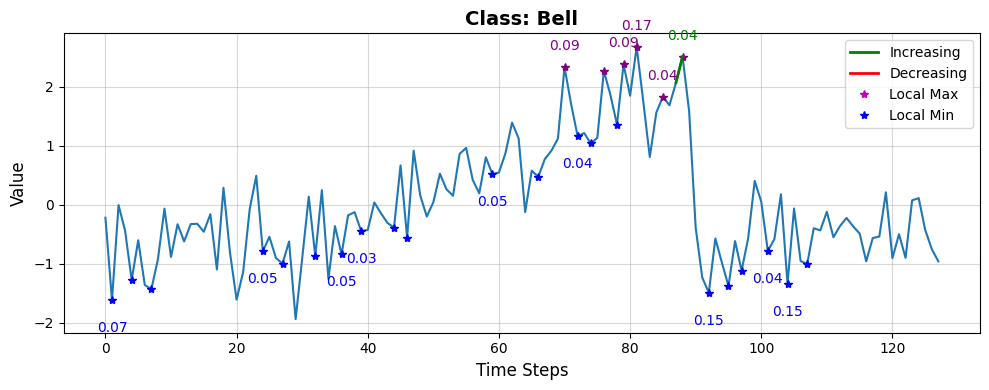

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0613, 0.8451, 0.0936])
Cylinder:                      0.0613
Bell:                      0.8451
Funnel:                      0.0936


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13458 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10791 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39583 samples)
Optimal number of clusters for LocalMax_ch1: 4
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38744 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.81
INFO:lomatce.explainer:Model Type: Ridge


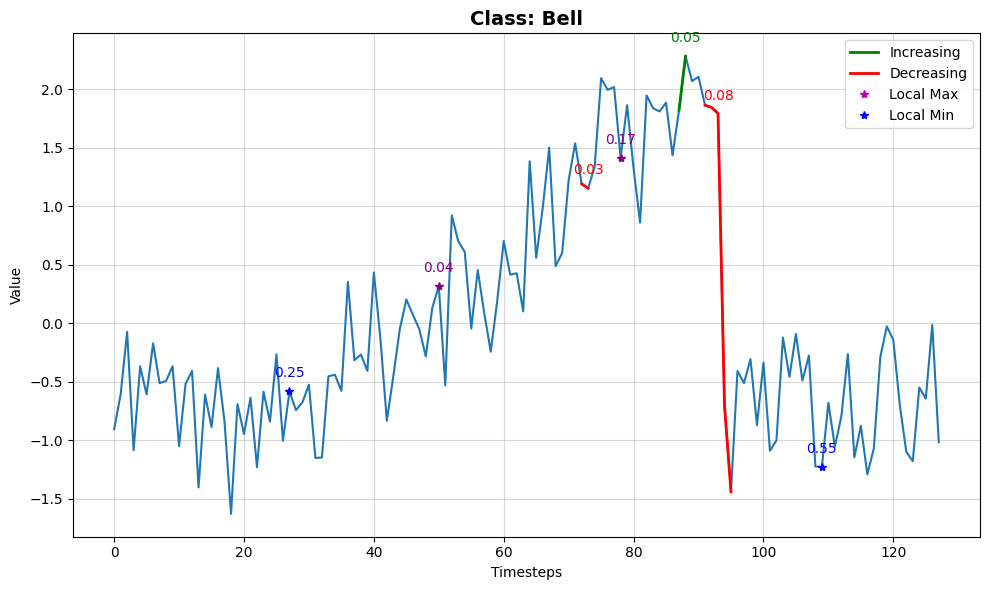

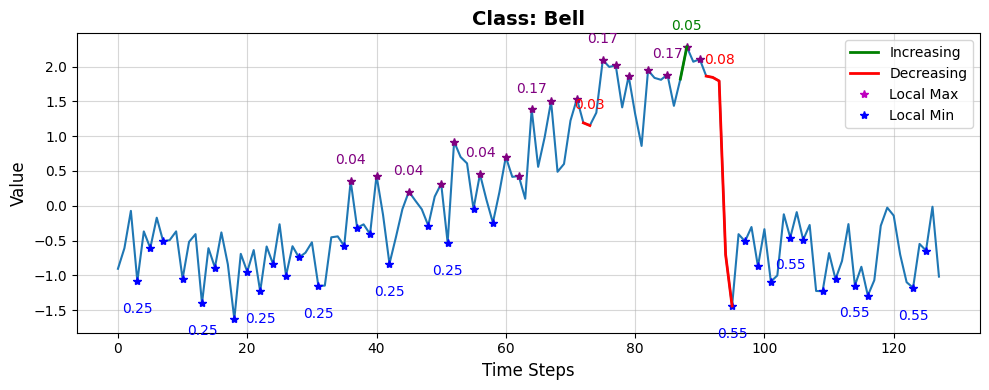

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1117, 0.8160, 0.0723])
Cylinder:                      0.1117
Bell:                      0.8160
Funnel:                      0.0723


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14541 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11661 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40357 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40368 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.74
INFO:lomatce.explainer:Model Type: Ridge


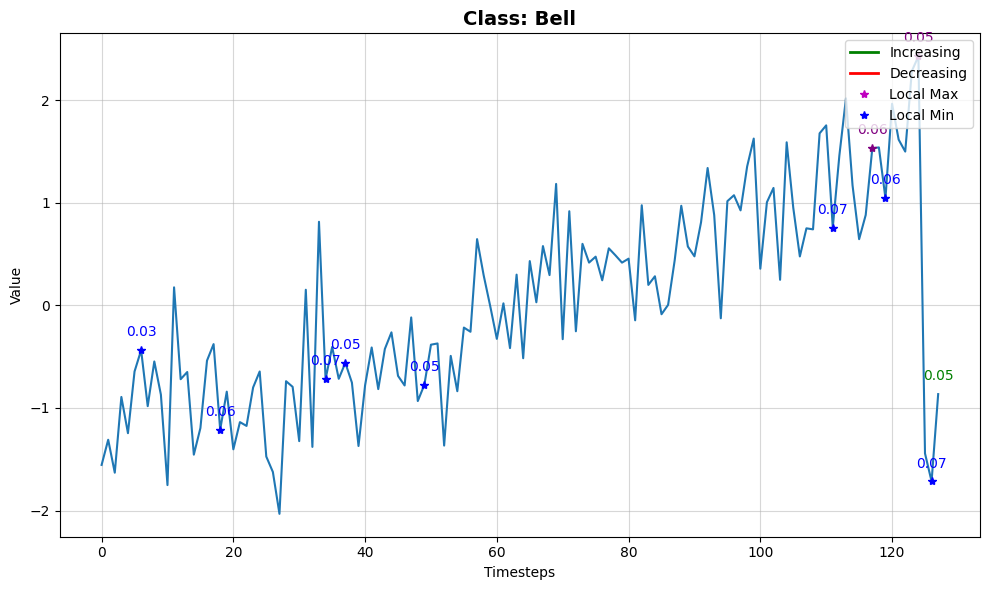

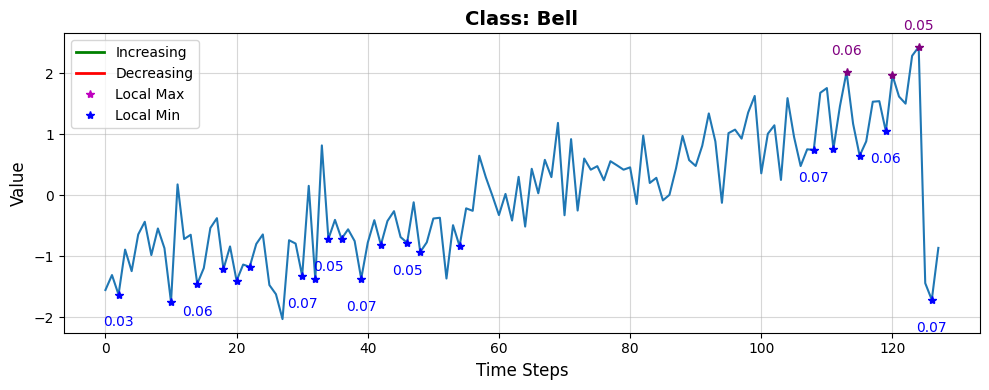

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1555, 0.7343, 0.1102])
Cylinder:                      0.1555
Bell:                      0.7343
Funnel:                      0.1102


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15256 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13379 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34500 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34556 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.62
INFO:lomatce.explainer:Model Type: Ridge


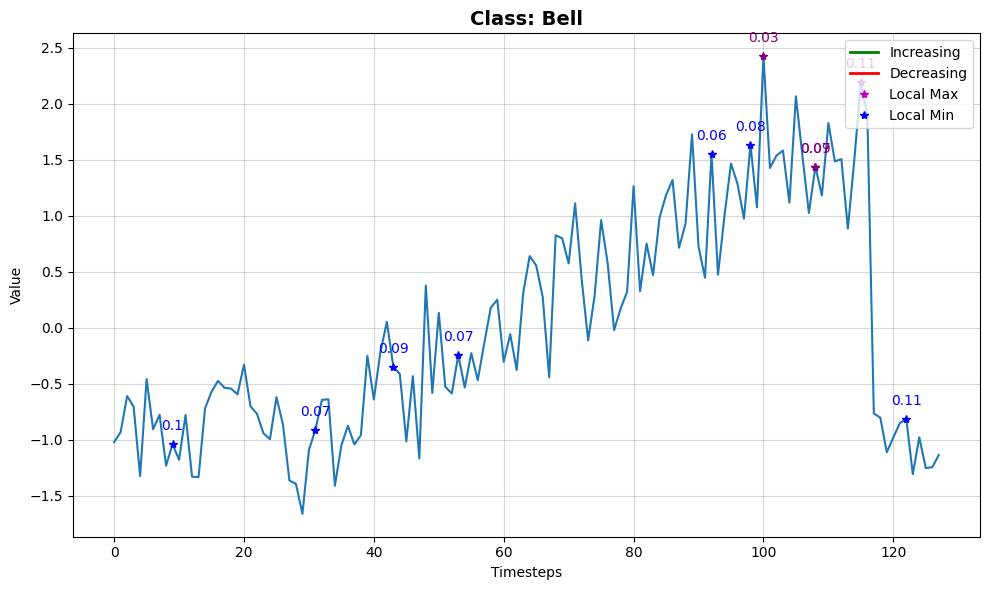

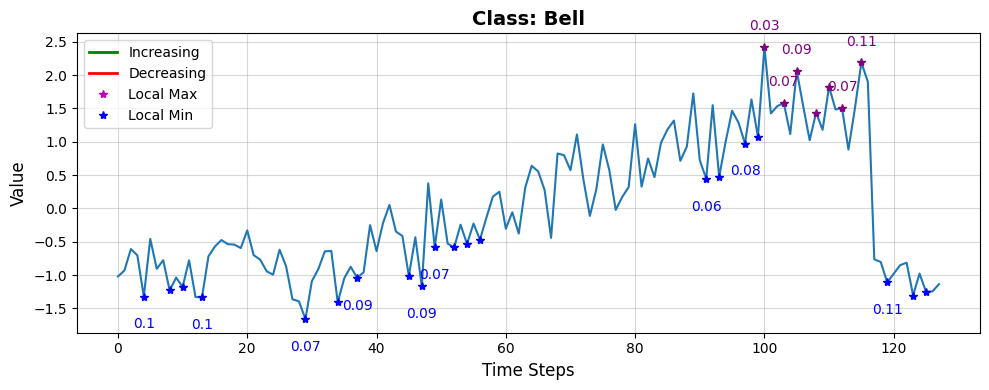

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2927, 0.6095, 0.0978])
Cylinder:                      0.2927
Bell:                      0.6095
Funnel:                      0.0978


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14863 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15370 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36172 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36334 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.81
INFO:lomatce.explainer:Model Type: Ridge


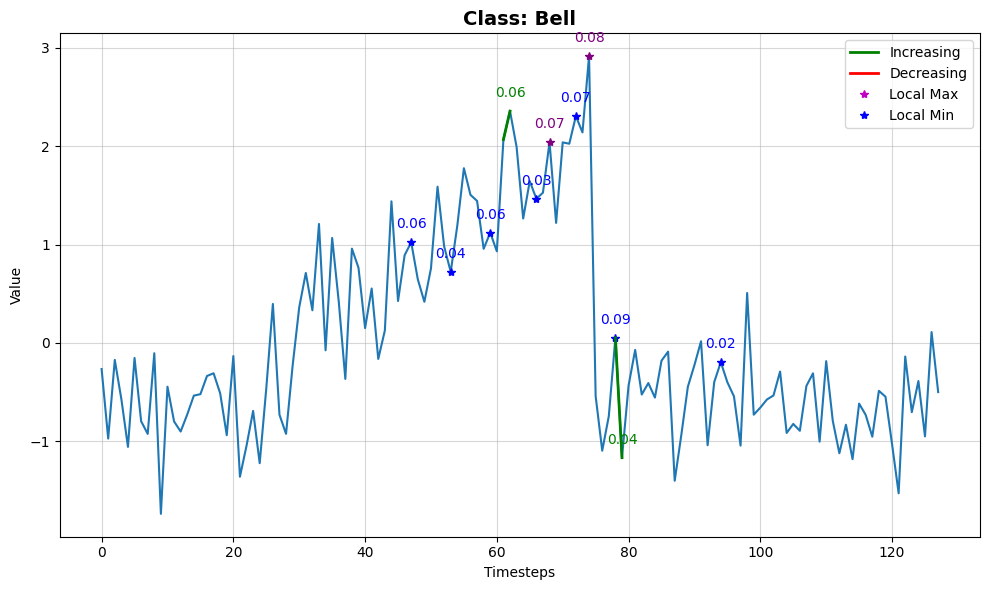

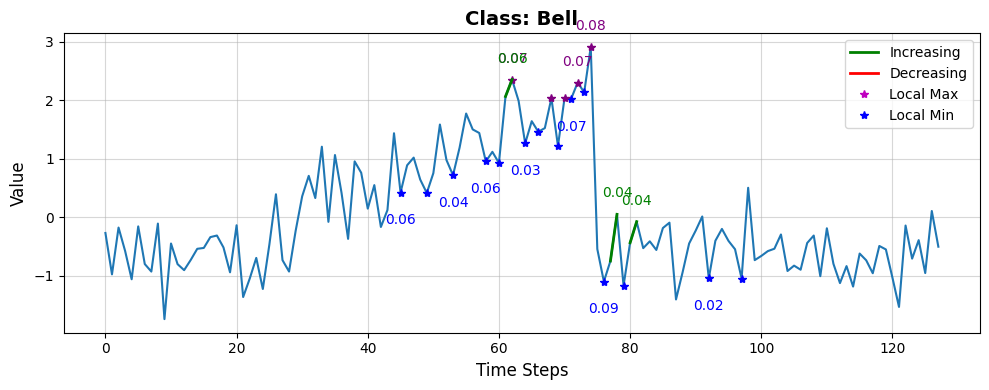

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0884, 0.8018, 0.1099])
Cylinder:                      0.0884
Bell:                      0.8018
Funnel:                      0.1099


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18721 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10882 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37580 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37587 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.78
INFO:lomatce.explainer:Model Type: Ridge


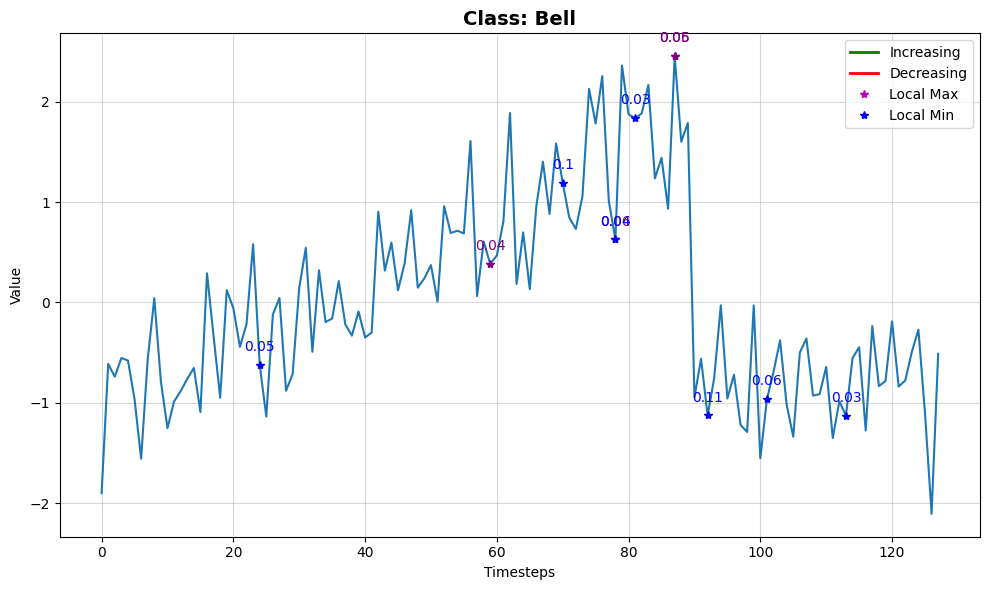

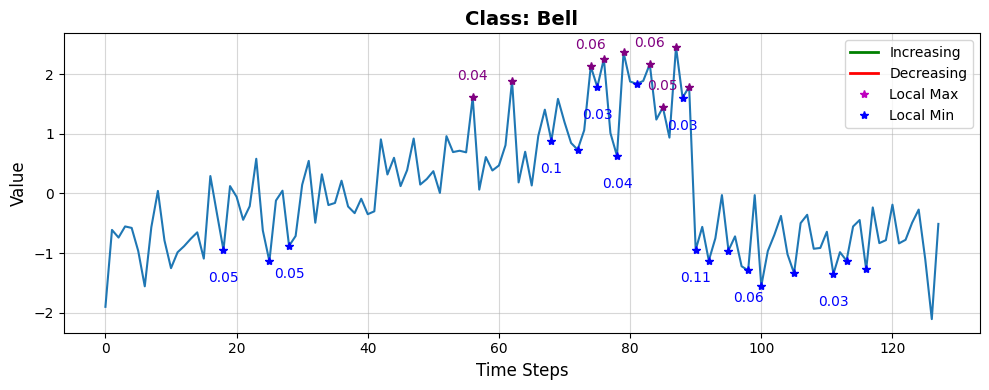

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0933, 0.7705, 0.1362])
Cylinder:                      0.0933
Bell:                      0.7705
Funnel:                      0.1362


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17764 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18758 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 29964 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 30005 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.66
INFO:lomatce.explainer:Model Type: Ridge


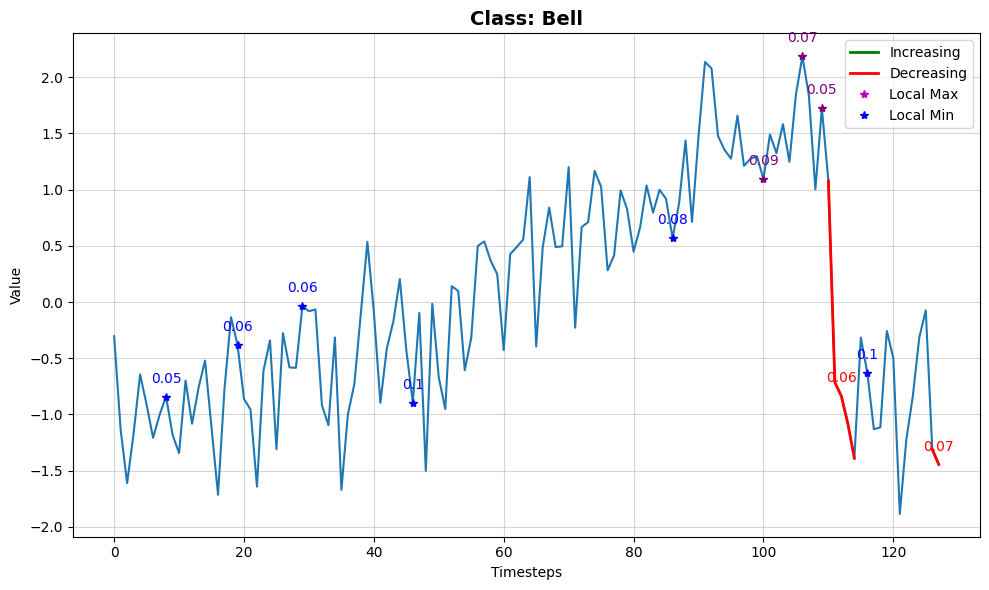

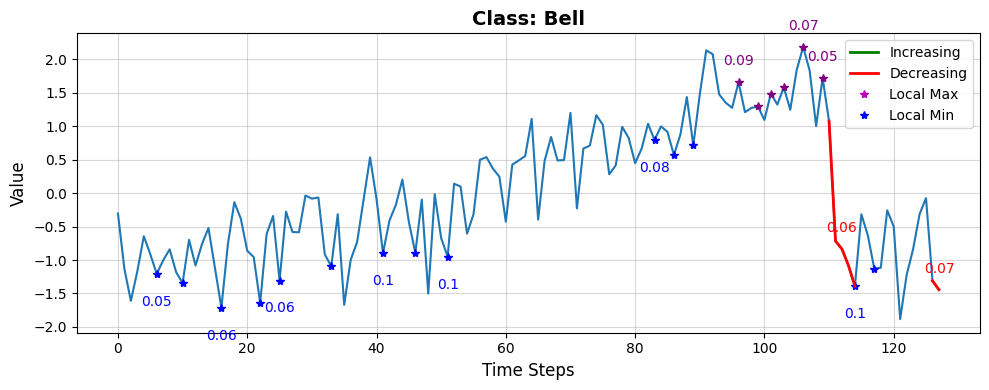

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2418, 0.6499, 0.1083])
Cylinder:                      0.2418
Bell:                      0.6499
Funnel:                      0.1083


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16059 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16164 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37070 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38189 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.89
INFO:lomatce.explainer:Model Type: Ridge


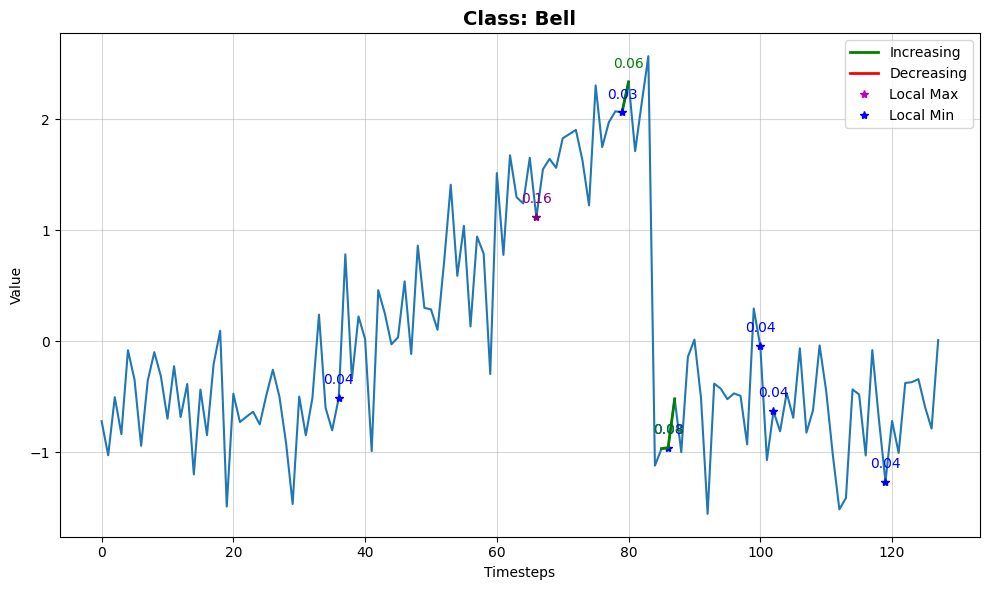

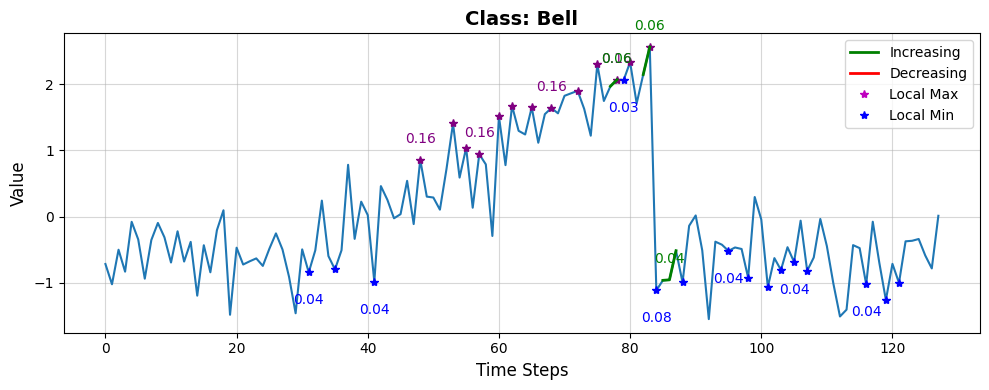

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0595, 0.8829, 0.0576])
Cylinder:                      0.0595
Bell:                      0.8829
Funnel:                      0.0576


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10627 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13477 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37840 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37841 samples)
Optimal number of clusters for LocalMin_ch1: 2


INFO:lomatce.explainer:Final data shape: (1001, 57) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 57


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.59
INFO:lomatce.explainer:Model Type: Ridge


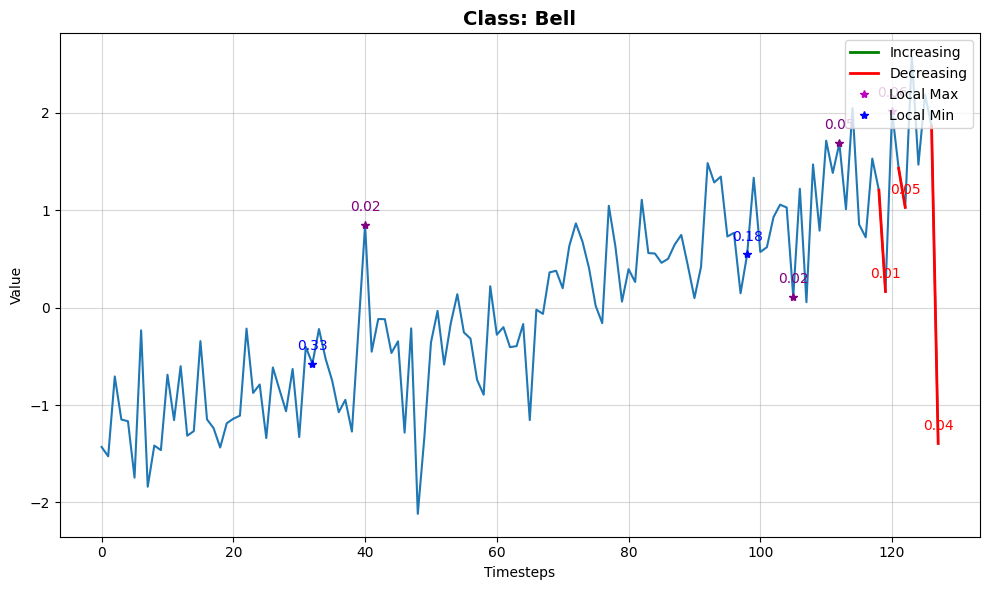

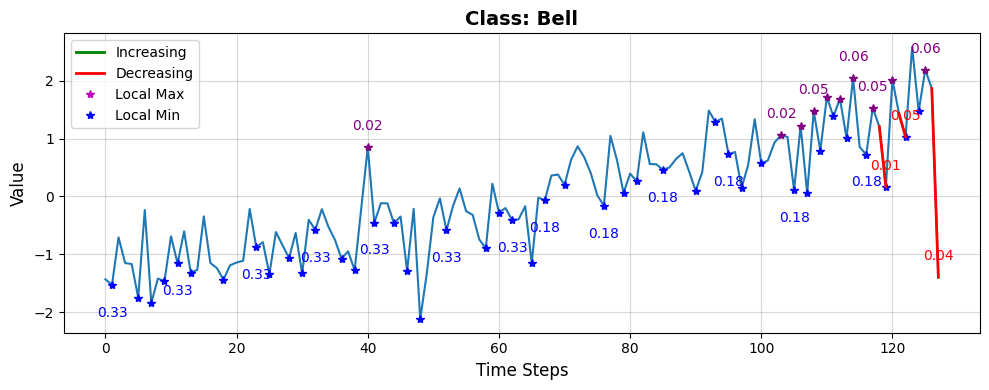

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2684, 0.5765, 0.1551])
Cylinder:                      0.2684
Bell:                      0.5765
Funnel:                      0.1551


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16489 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14284 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36852 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36947 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


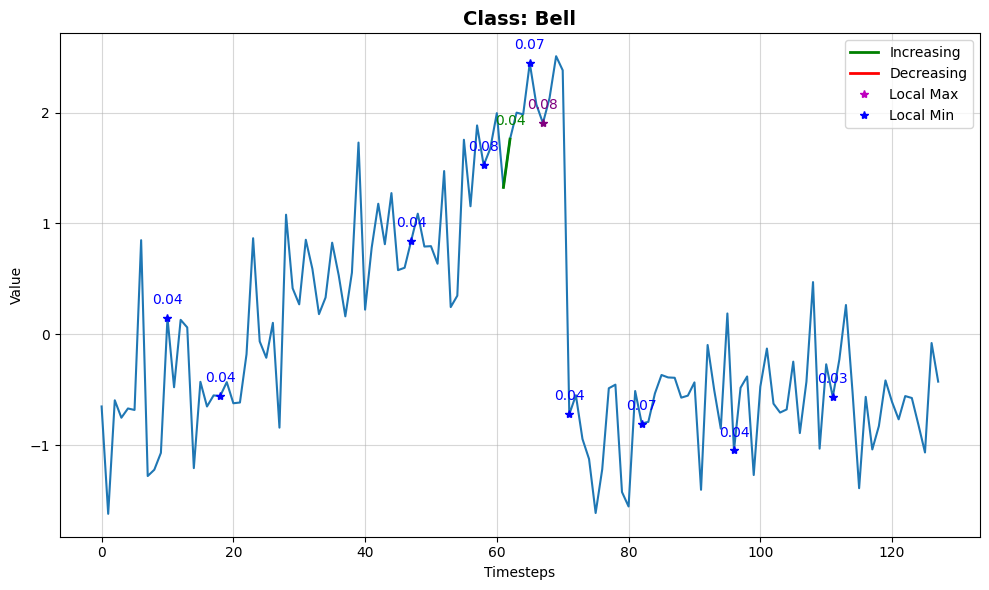

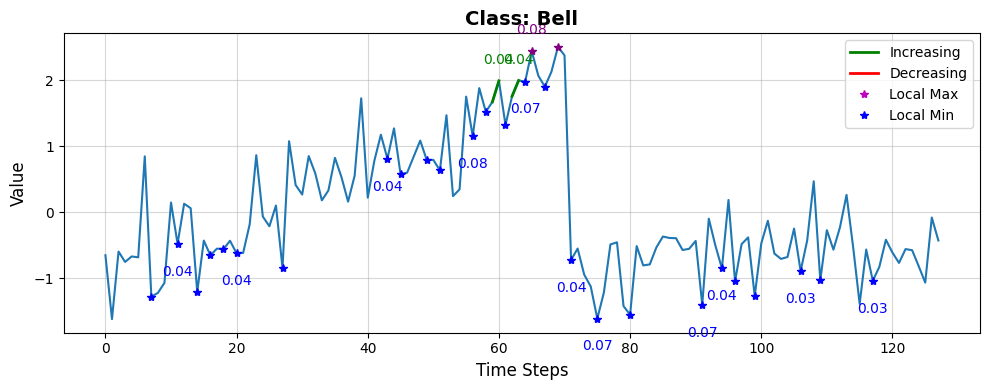

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1006, 0.8297, 0.0697])
Cylinder:                      0.1006
Bell:                      0.8297
Funnel:                      0.0697


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17808 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14387 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36484 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35675 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.9
INFO:lomatce.explainer:Model Type: Ridge


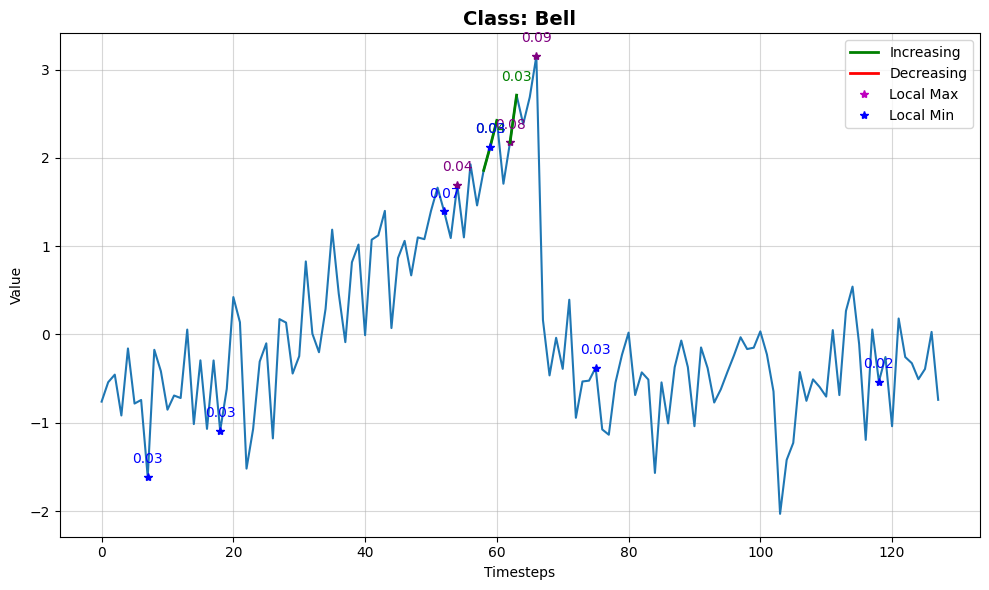

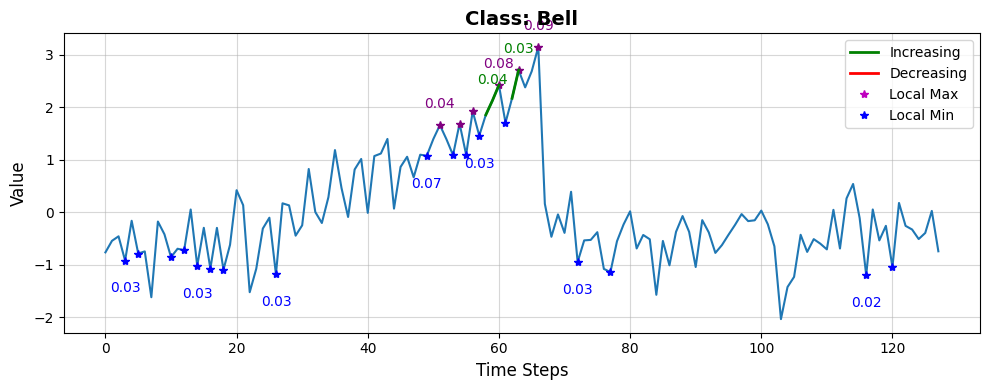

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0452, 0.9006, 0.0542])
Cylinder:                      0.0452
Bell:                      0.9006
Funnel:                      0.0542


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15291 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10860 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40454 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40460 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 70) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 70


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.91
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.75
INFO:lomatce.explainer:Model Type: Ridge


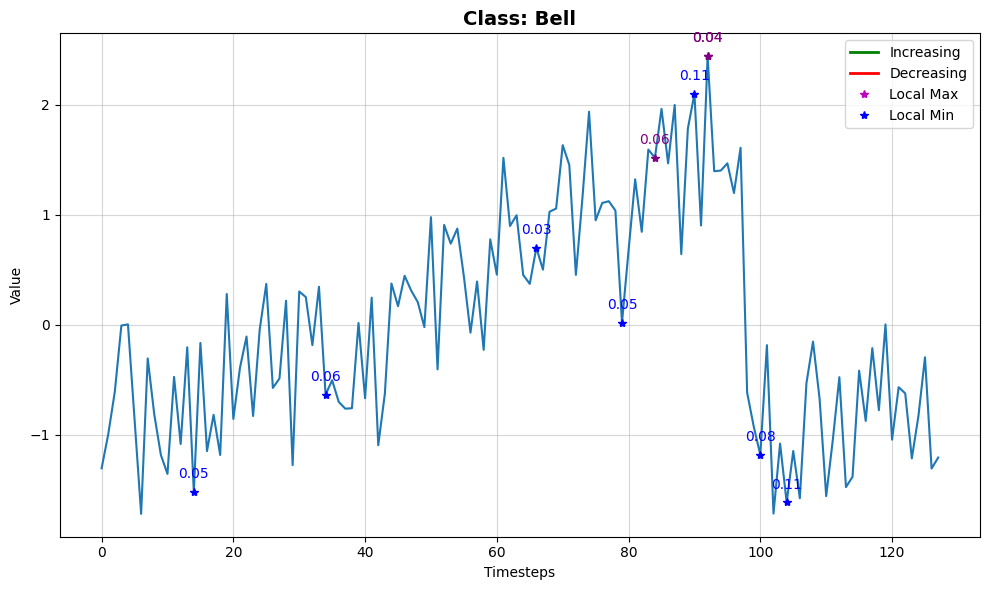

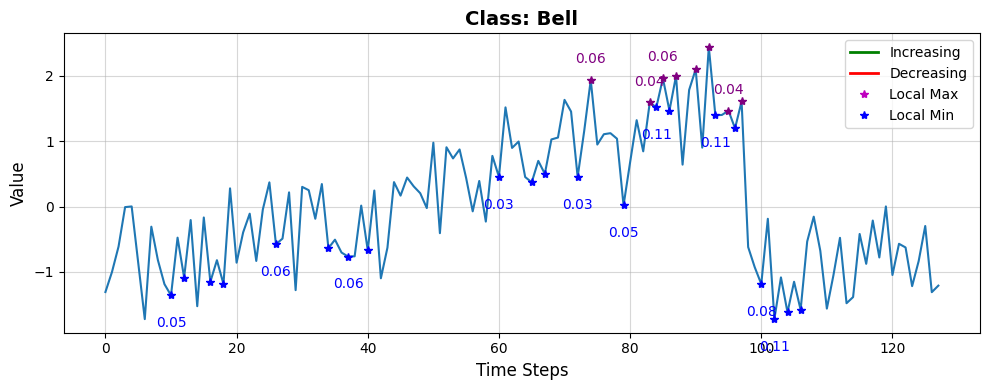

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1058, 0.7433, 0.1510])
Cylinder:                      0.1058
Bell:                      0.7433
Funnel:                      0.1510


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14278 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13631 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37084 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37223 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.73
INFO:lomatce.explainer:Model Type: Ridge


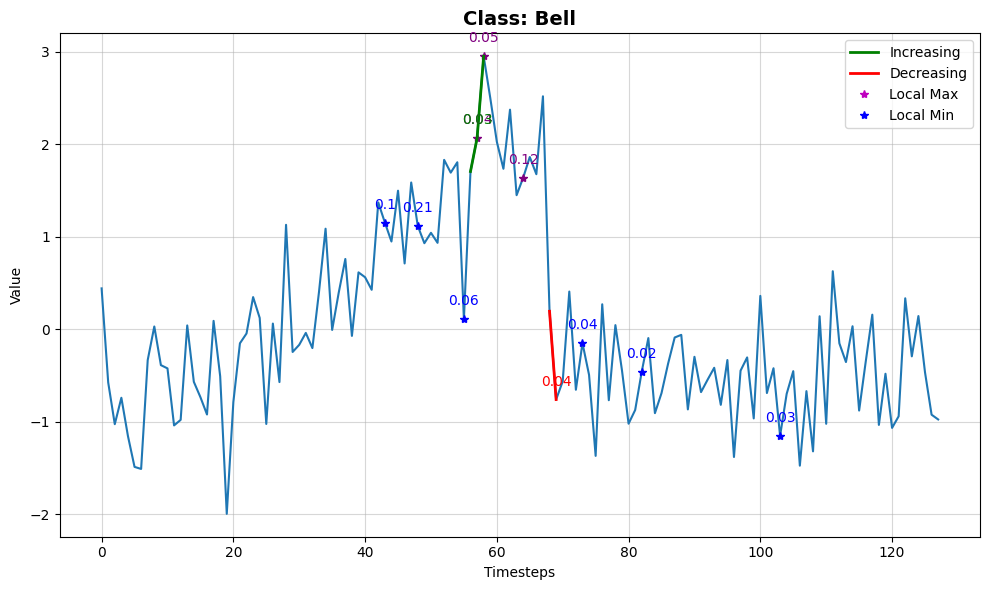

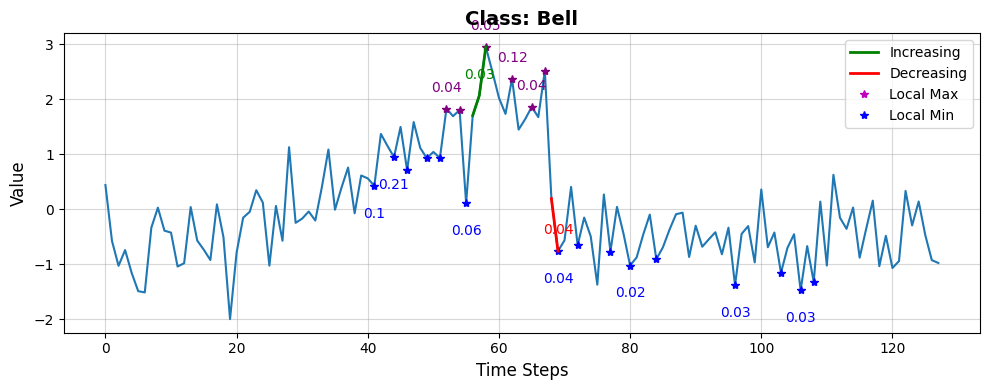

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0561, 0.7324, 0.2115])
Cylinder:                      0.0561
Bell:                      0.7324
Funnel:                      0.2115

📈 Global Faithfulness (Avg Local Fidelity): 0.9551

=== Running SP-LOMATCE for class Funnel ===


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13631 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15179 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36199 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37423 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.78
INFO:lomatce.explainer:Model Type: Ridge


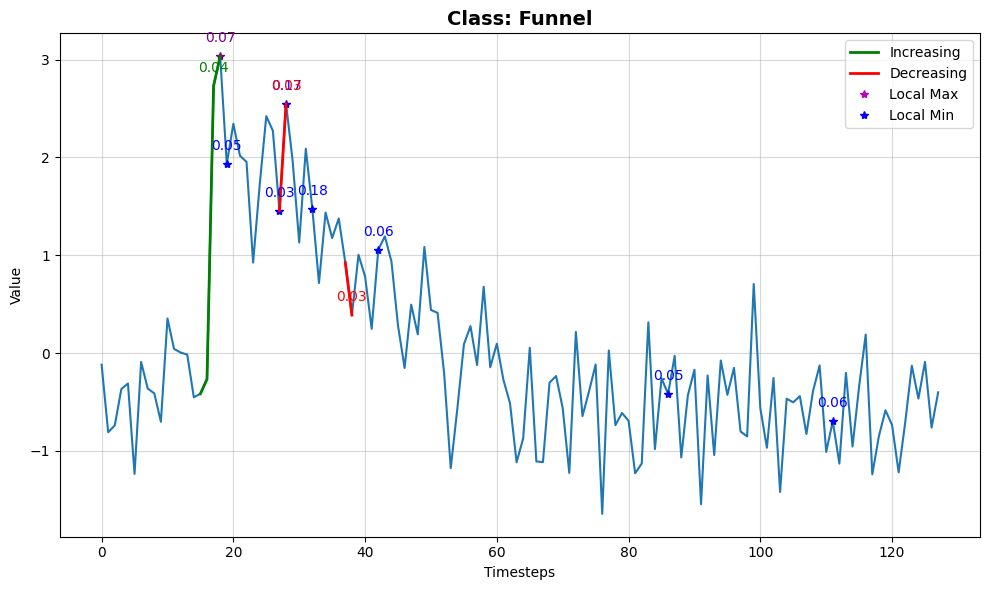

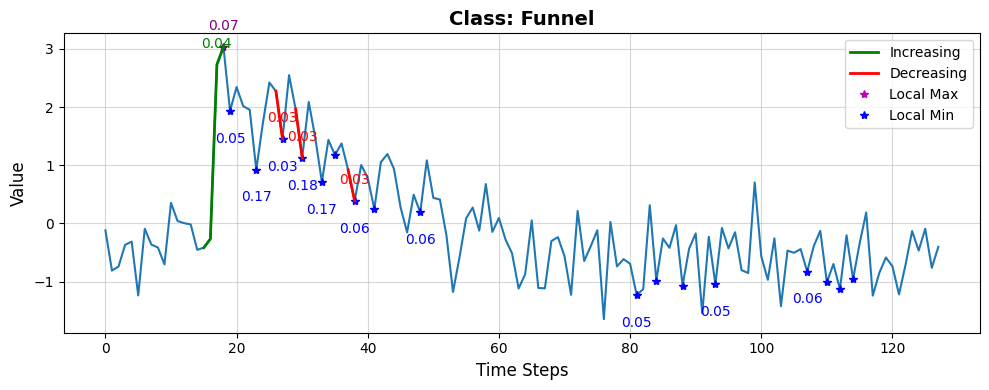

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0633, 0.1701, 0.7666])
Cylinder:                      0.0633
Bell:                      0.1701
Funnel:                      0.7666


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16049 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16973 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36095 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37140 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.65
INFO:lomatce.explainer:Model Type: Ridge


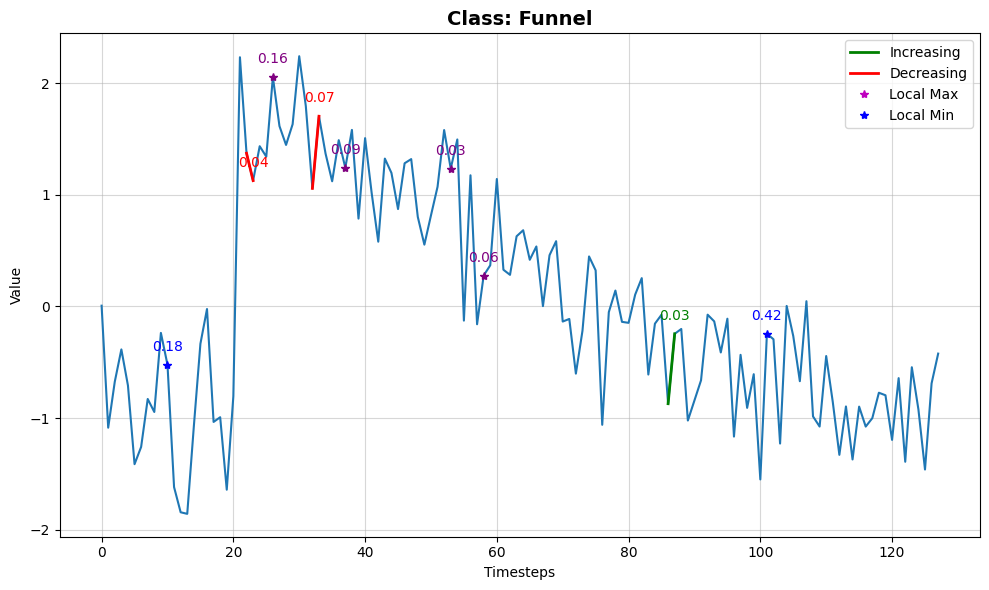

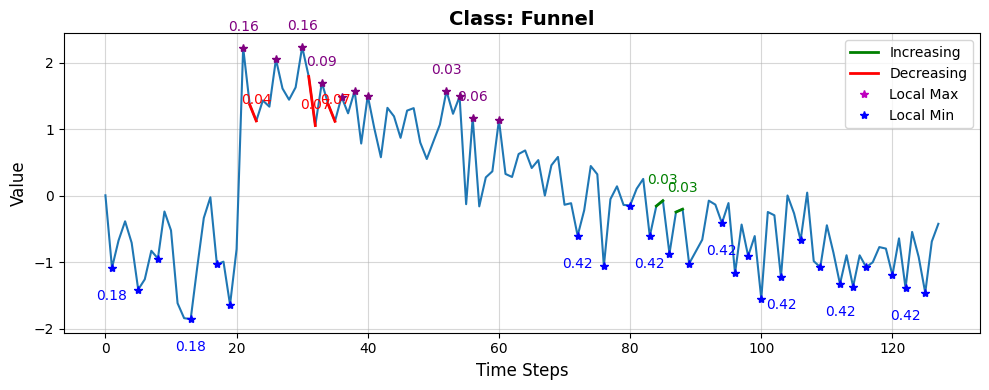

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2501, 0.1232, 0.6267])
Cylinder:                      0.2501
Bell:                      0.1232
Funnel:                      0.6267


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10824 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 20494 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36287 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35445 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.75
INFO:lomatce.explainer:Model Type: Ridge


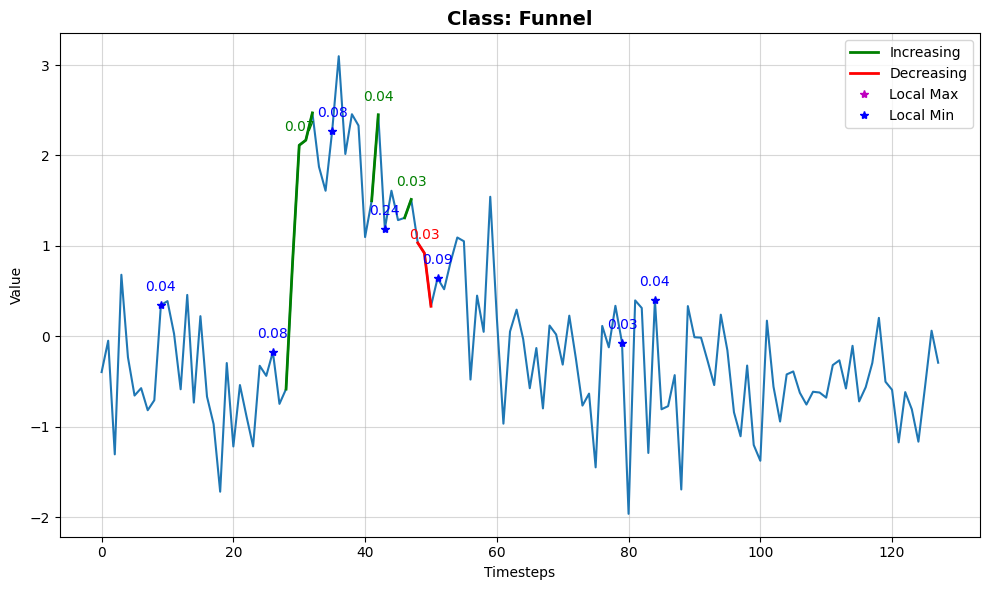

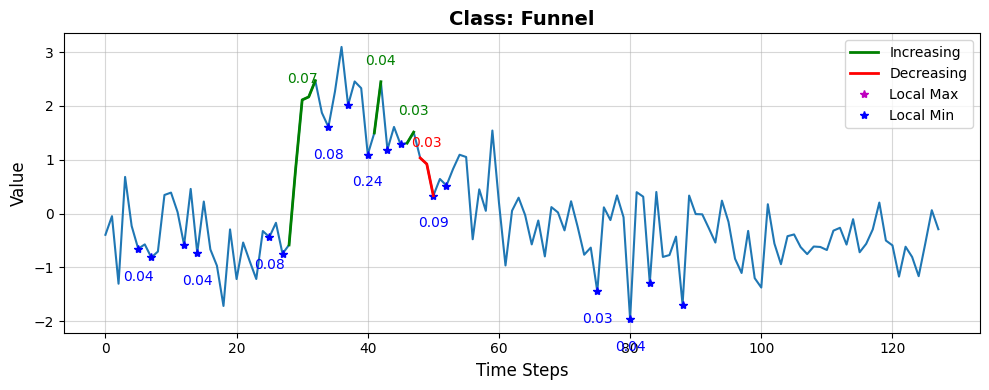

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0580, 0.2053, 0.7367])
Cylinder:                      0.0580
Bell:                      0.2053
Funnel:                      0.7367


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17037 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11558 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37755 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38792 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.74
INFO:lomatce.explainer:Model Type: Ridge


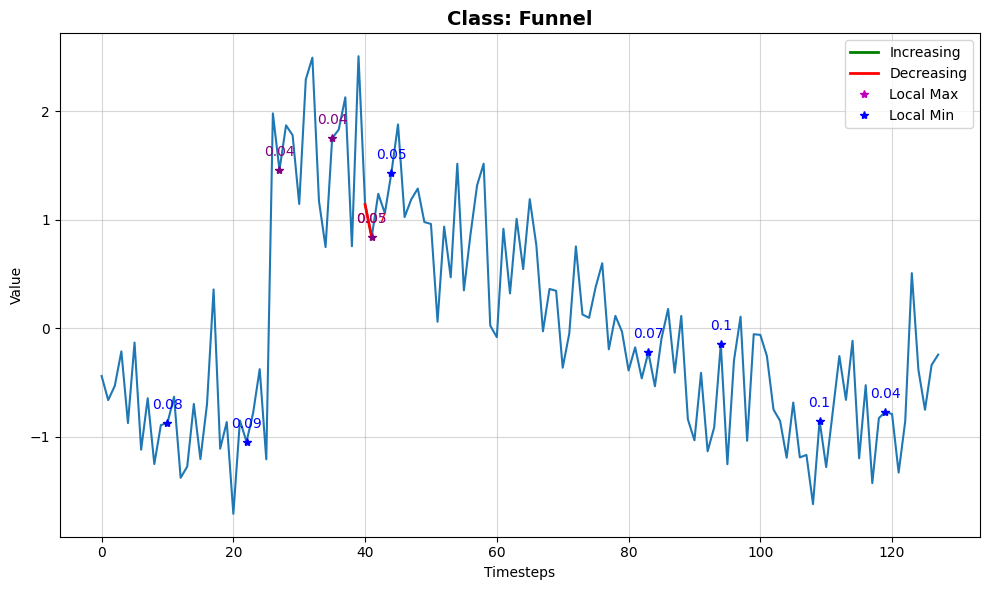

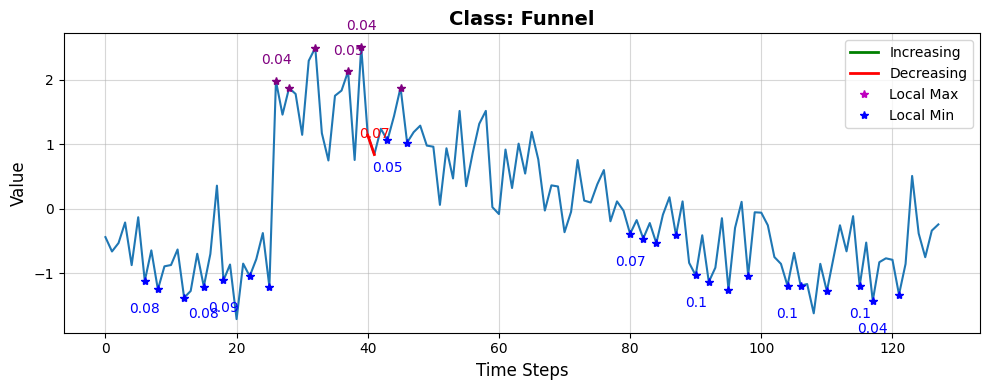

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1403, 0.1352, 0.7245])
Cylinder:                      0.1403
Bell:                      0.1352
Funnel:                      0.7245


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12567 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16026 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37754 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38909 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 55) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 55


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.78
INFO:lomatce.explainer:Model Type: Ridge


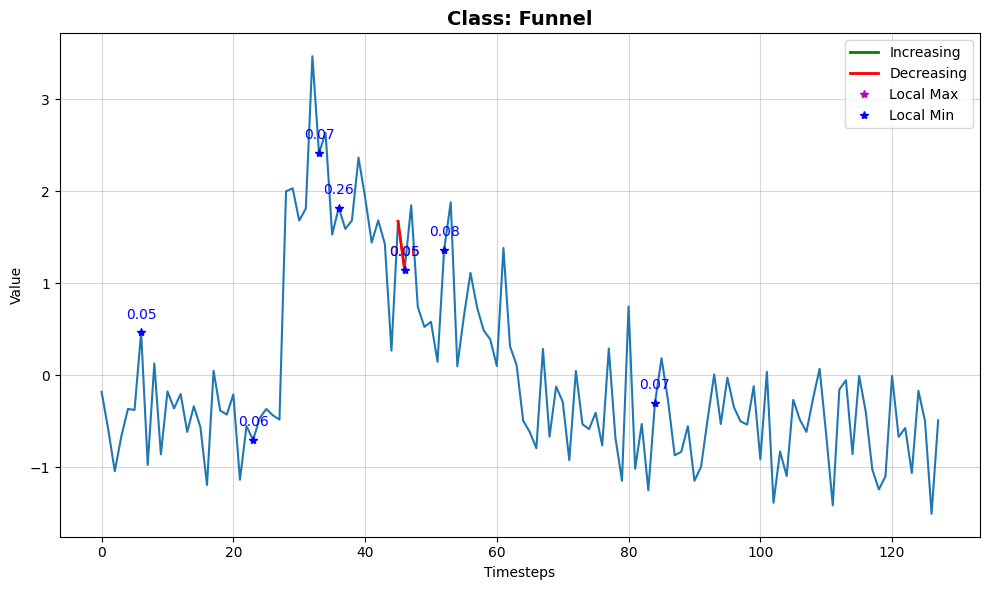

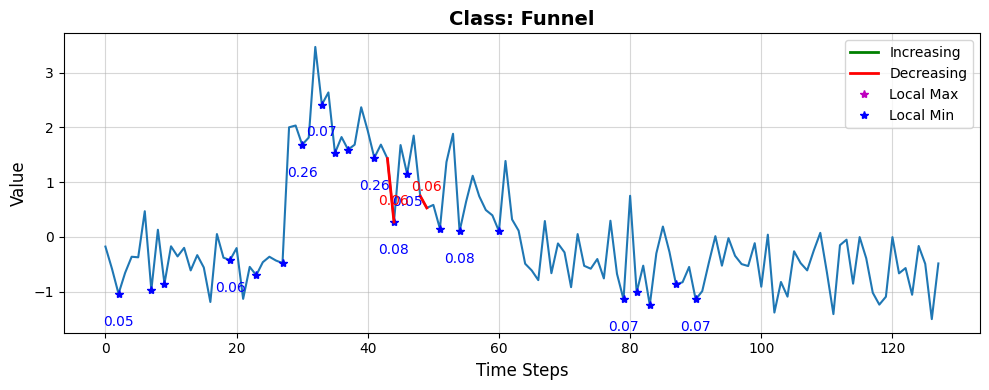

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0577, 0.1731, 0.7693])
Cylinder:                      0.0577
Bell:                      0.1731
Funnel:                      0.7693


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15261 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15254 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35566 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34423 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.57
INFO:lomatce.explainer:Model Type: Ridge


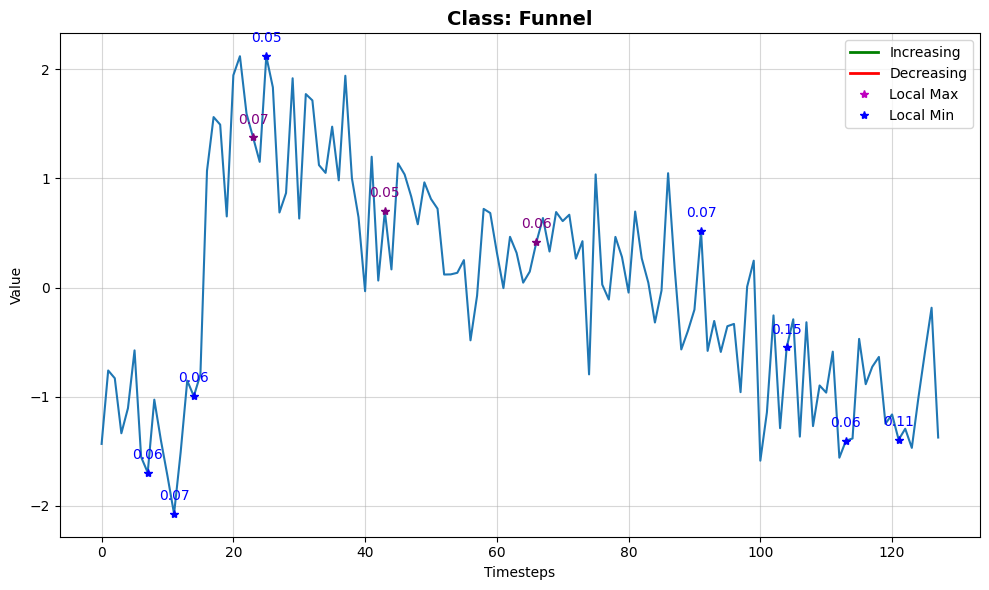

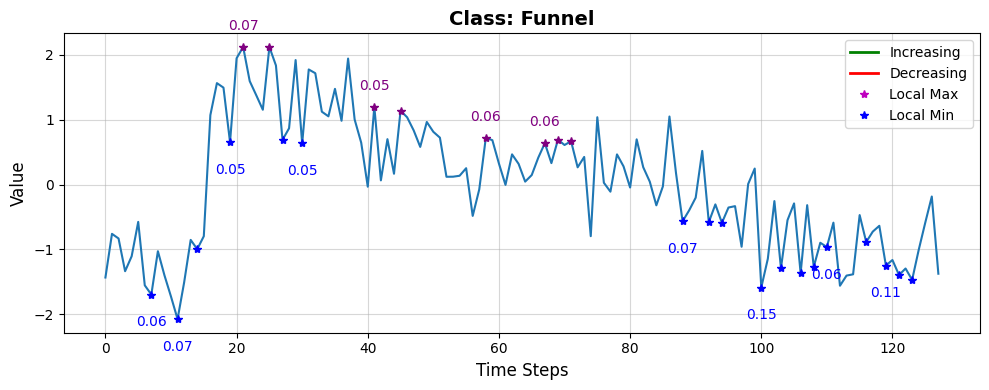

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2941, 0.1524, 0.5535])
Cylinder:                      0.2941
Bell:                      0.1524
Funnel:                      0.5535


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11542 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16830 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36976 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37080 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


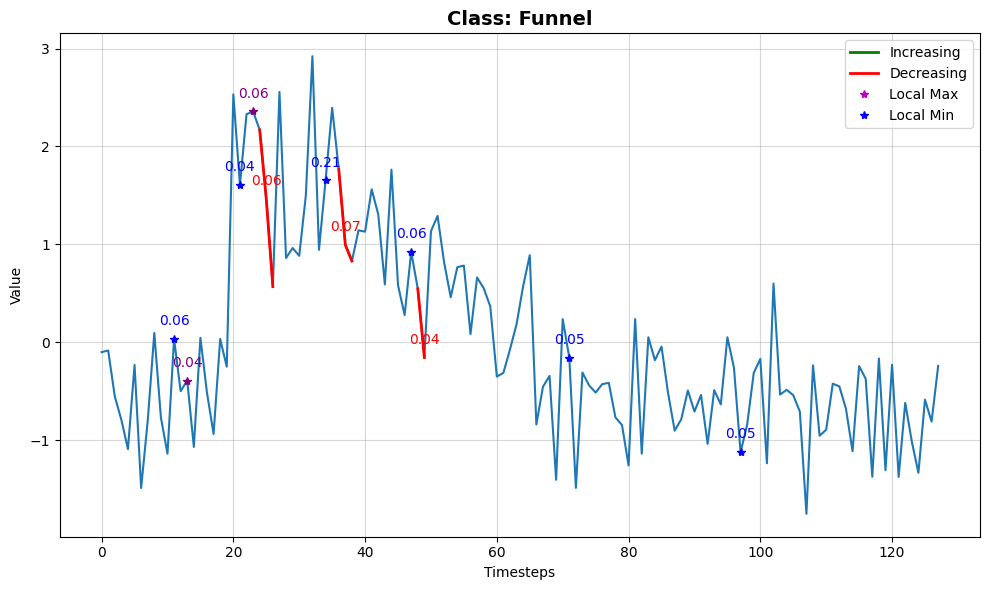

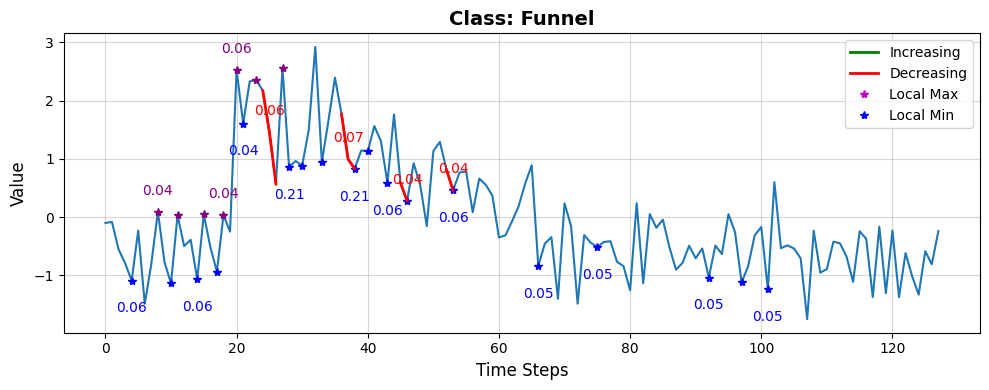

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0758, 0.1760, 0.7482])
Cylinder:                      0.0758
Bell:                      0.1760
Funnel:                      0.7482


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13440 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12669 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38612 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38698 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.75
INFO:lomatce.explainer:Model Type: Ridge


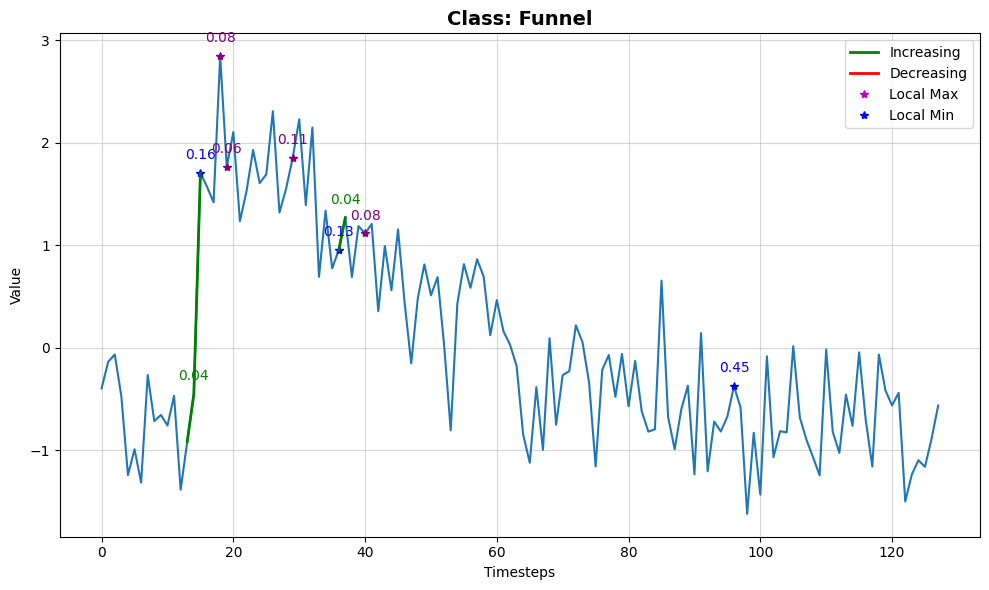

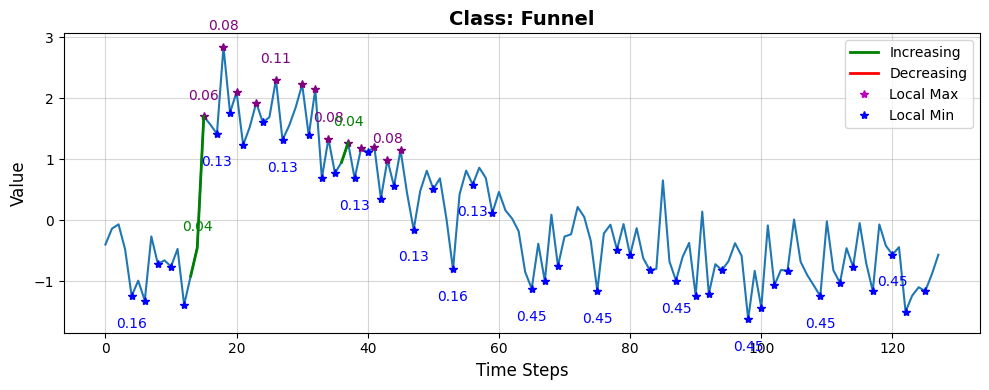

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1393, 0.1231, 0.7375])
Cylinder:                      0.1393
Bell:                      0.1231
Funnel:                      0.7375


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15171 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10131 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 41518 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 41699 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.63
INFO:lomatce.explainer:Model Type: Ridge


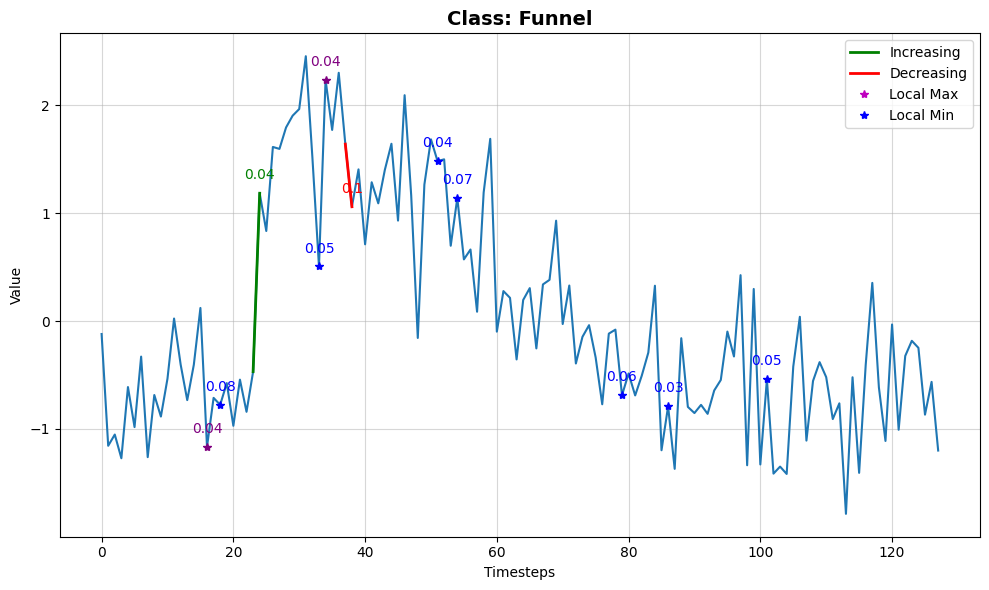

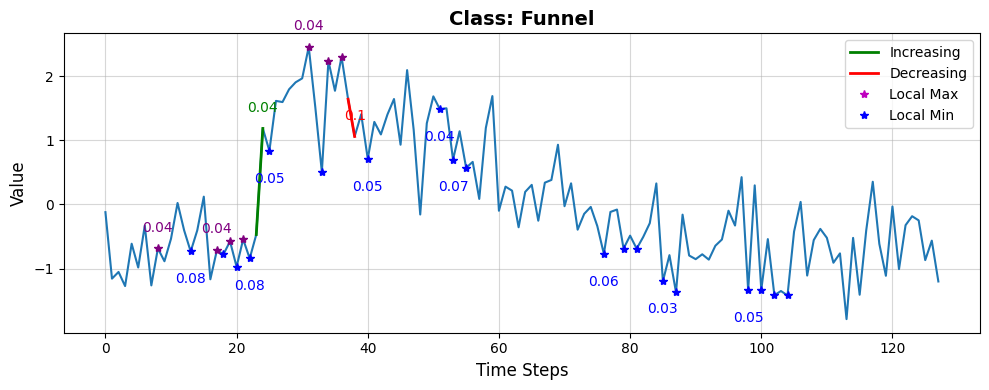

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1184, 0.2715, 0.6101])
Cylinder:                      0.1184
Bell:                      0.2715
Funnel:                      0.6101


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17719 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14226 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36164 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37260 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.74
INFO:lomatce.explainer:Model Type: Ridge


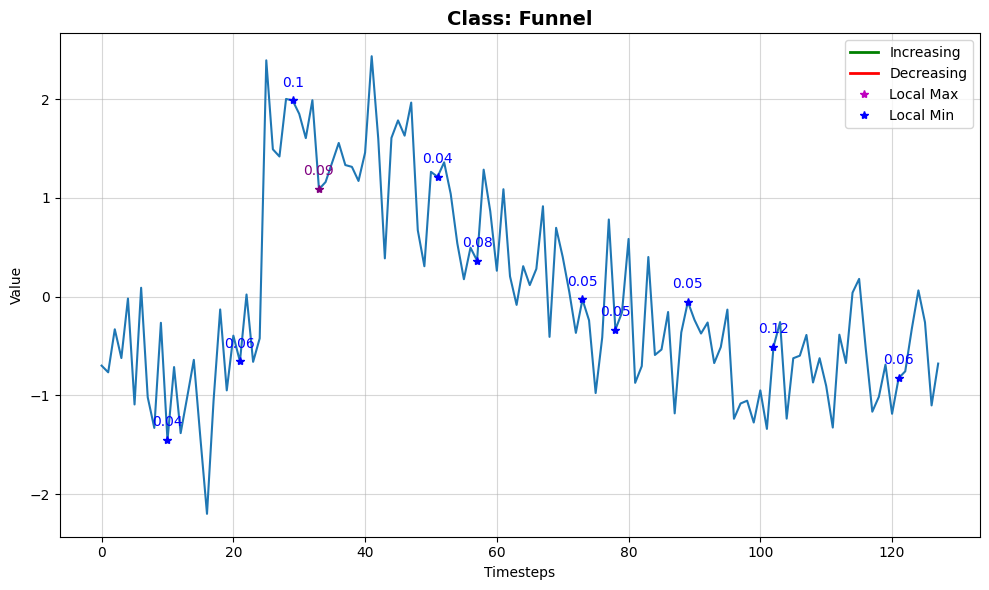

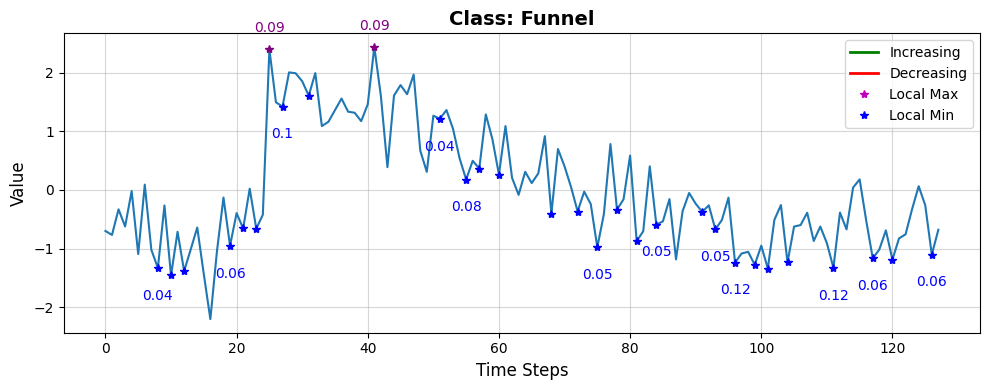

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1304, 0.1492, 0.7204])
Cylinder:                      0.1304
Bell:                      0.1492
Funnel:                      0.7204


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16058 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14383 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38067 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37216 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.79
INFO:lomatce.explainer:Model Type: Ridge


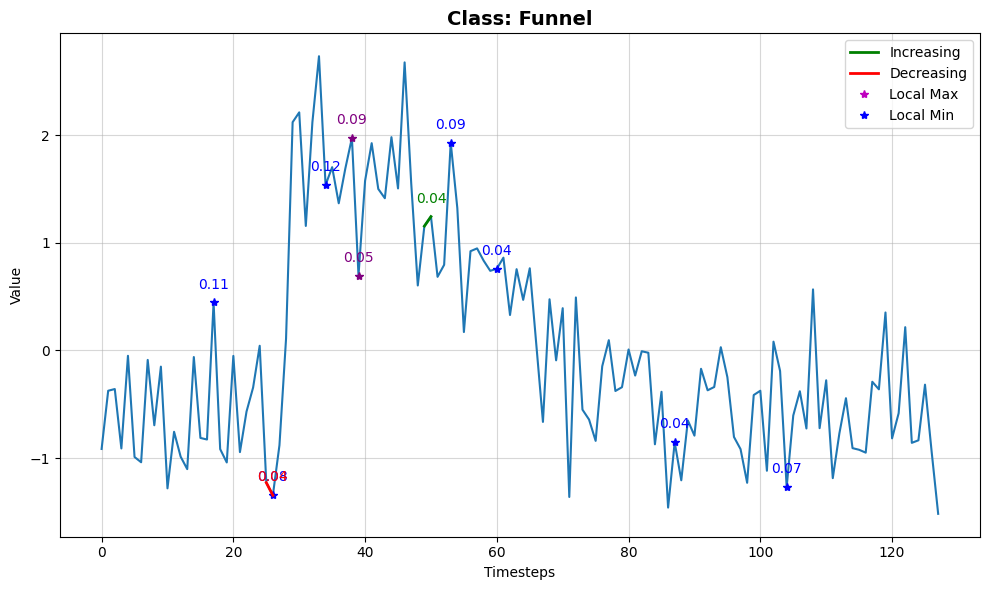

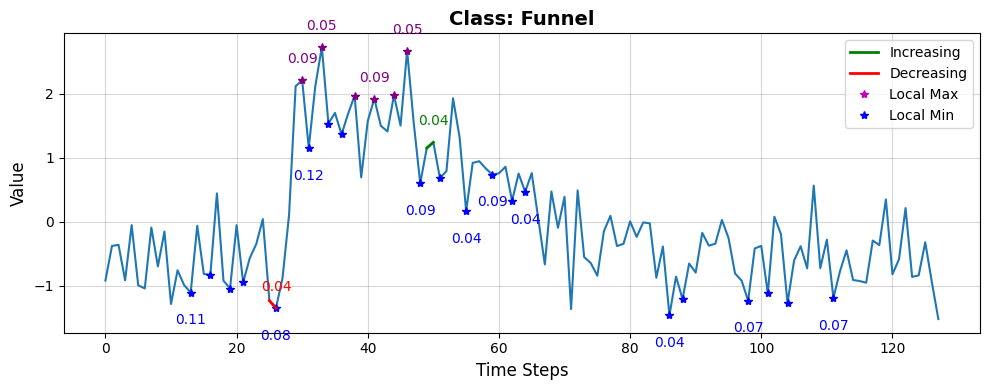

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0799, 0.1498, 0.7703])
Cylinder:                      0.0799
Bell:                      0.1498
Funnel:                      0.7703


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17023 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12611 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35264 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36447 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.73
INFO:lomatce.explainer:Model Type: Ridge


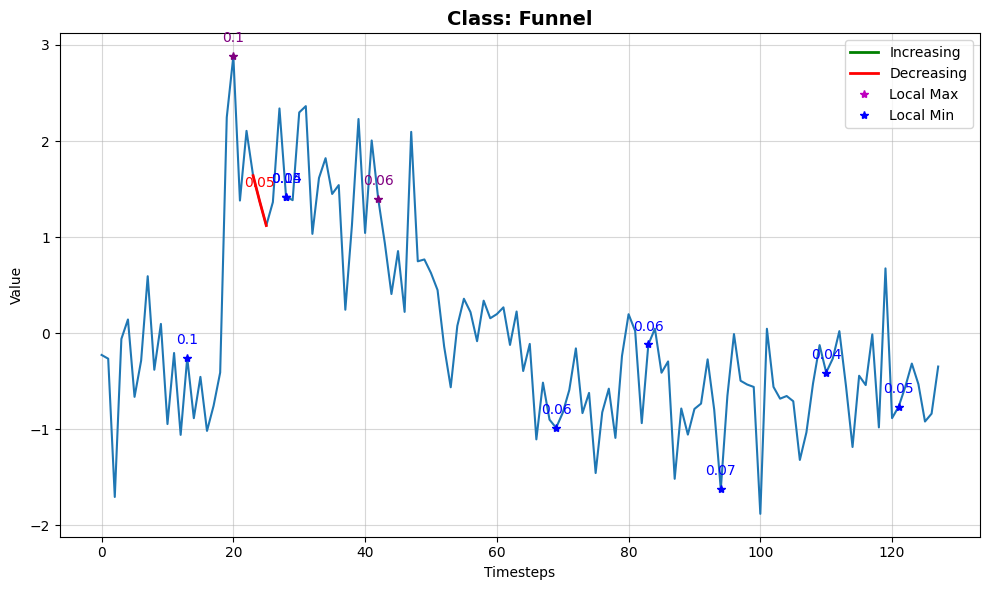

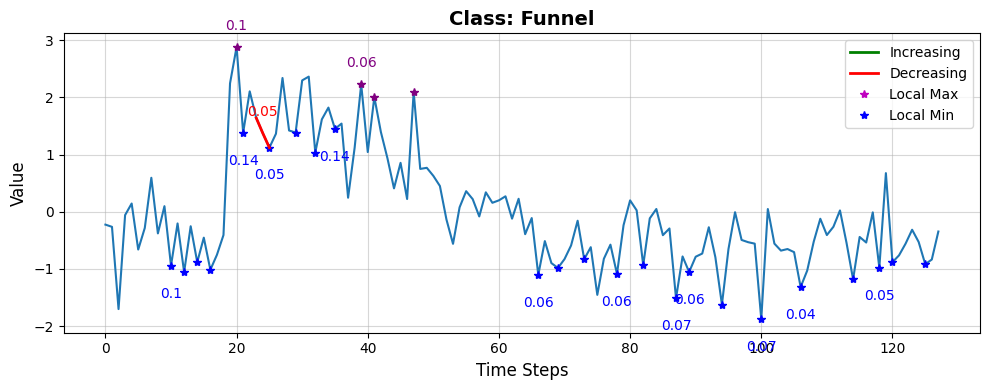

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0776, 0.1986, 0.7238])
Cylinder:                      0.0776
Bell:                      0.1986
Funnel:                      0.7238


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13657 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12528 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36892 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36842 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.66
INFO:lomatce.explainer:Model Type: Ridge


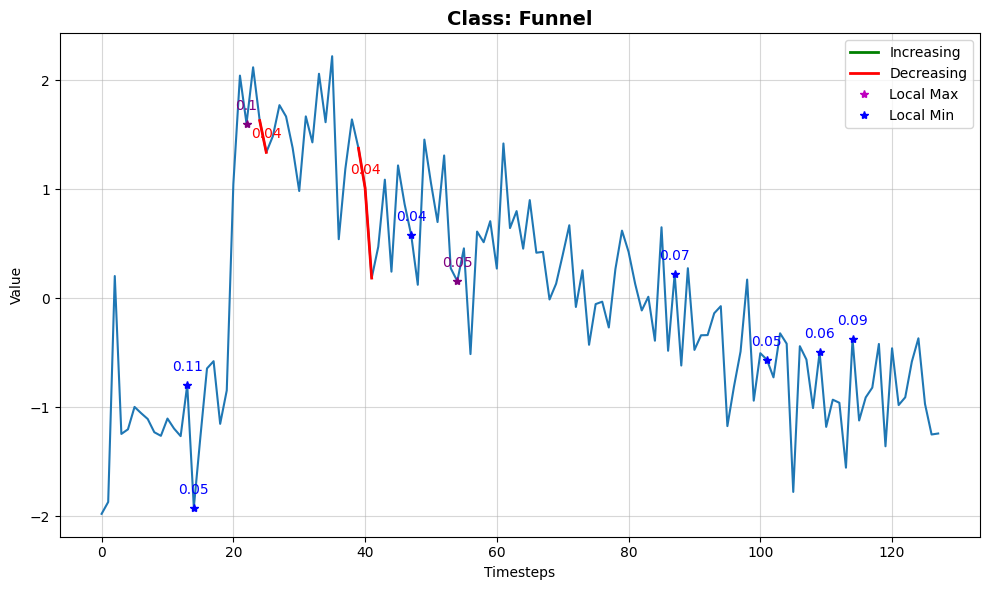

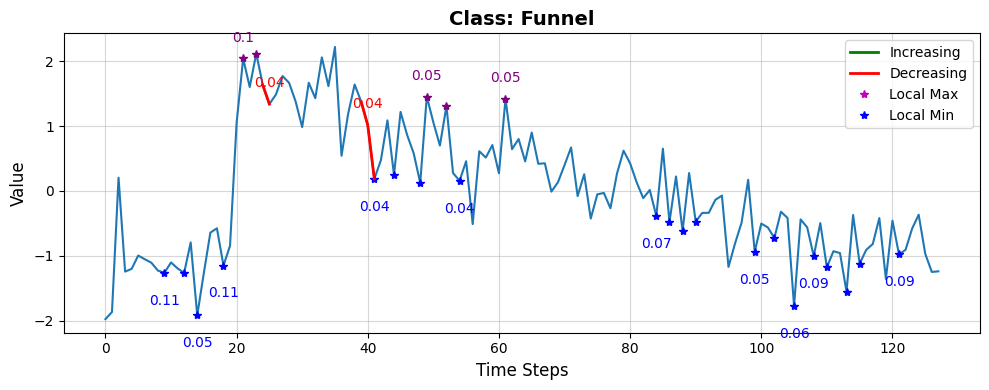

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2409, 0.1173, 0.6417])
Cylinder:                      0.2409
Bell:                      0.1173
Funnel:                      0.6417


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16807 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10664 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36931 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37118 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.8
INFO:lomatce.explainer:Model Type: Ridge


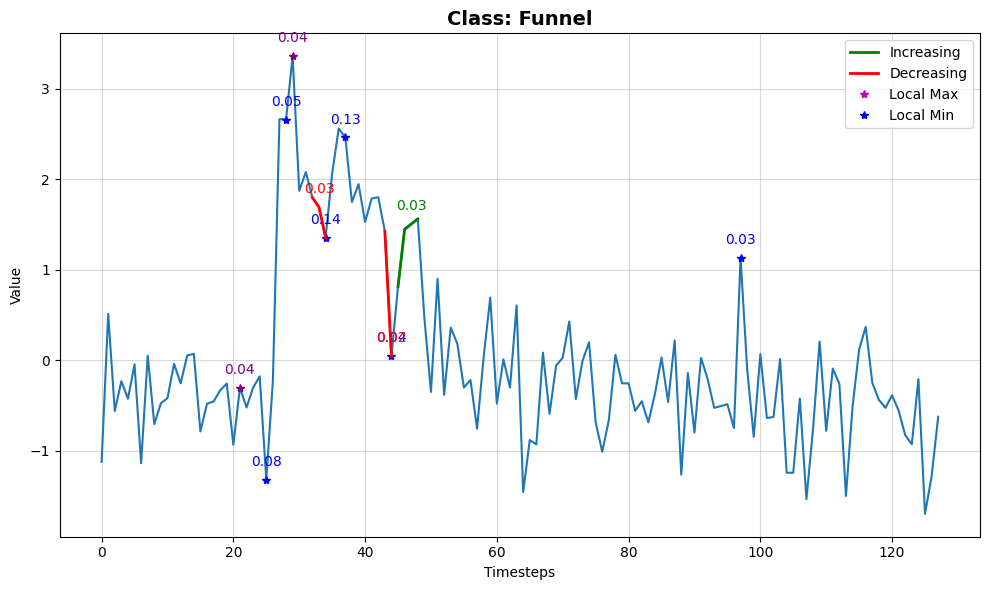

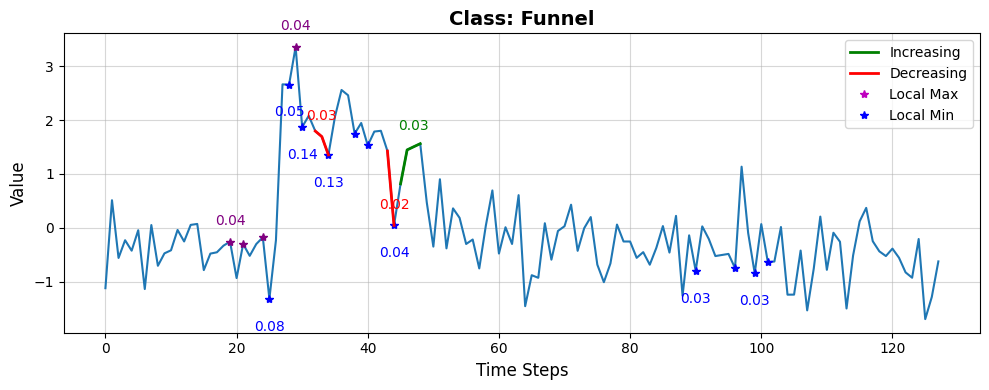

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0351, 0.1775, 0.7874])
Cylinder:                      0.0351
Bell:                      0.1775
Funnel:                      0.7874


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11488 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17821 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37663 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36716 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.64
INFO:lomatce.explainer:Model Type: Ridge


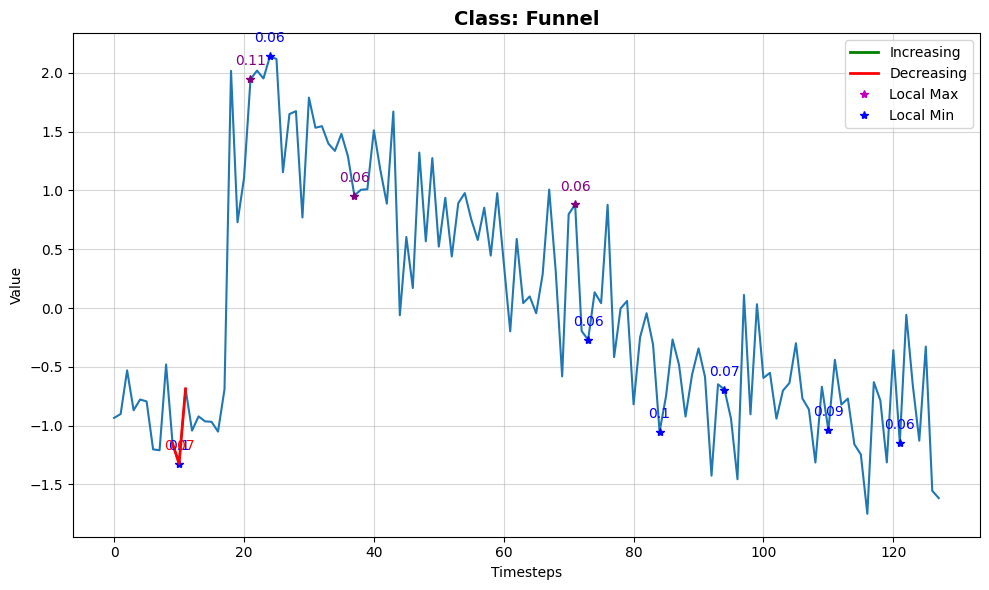

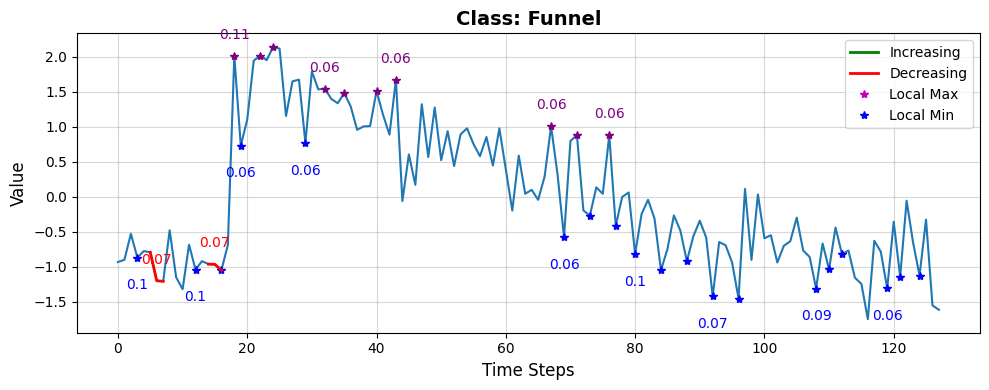

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2872, 0.0967, 0.6161])
Cylinder:                      0.2872
Bell:                      0.0967
Funnel:                      0.6161


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18602 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14319 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34326 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34272 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.7
INFO:lomatce.explainer:Model Type: Ridge


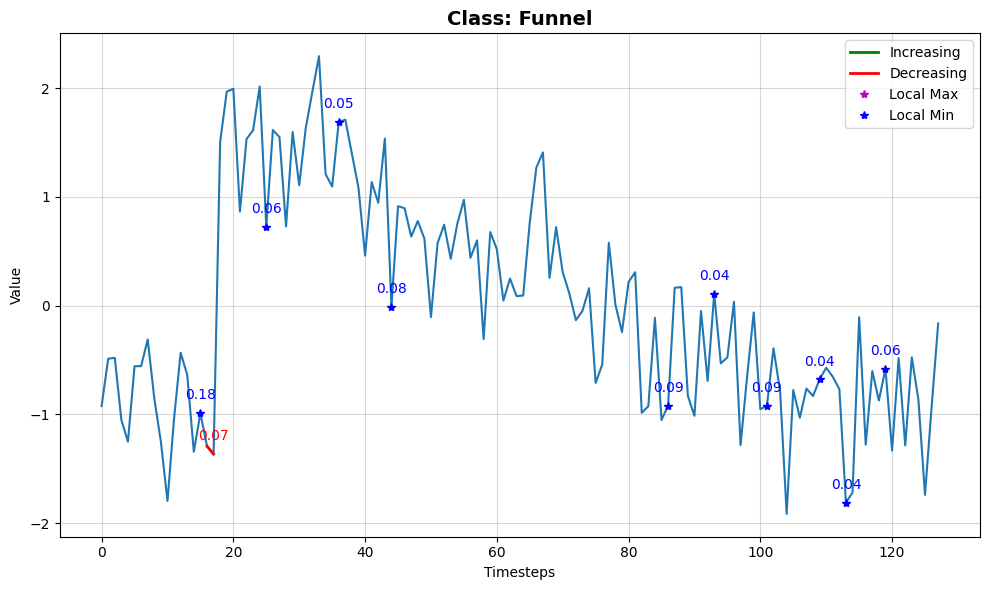

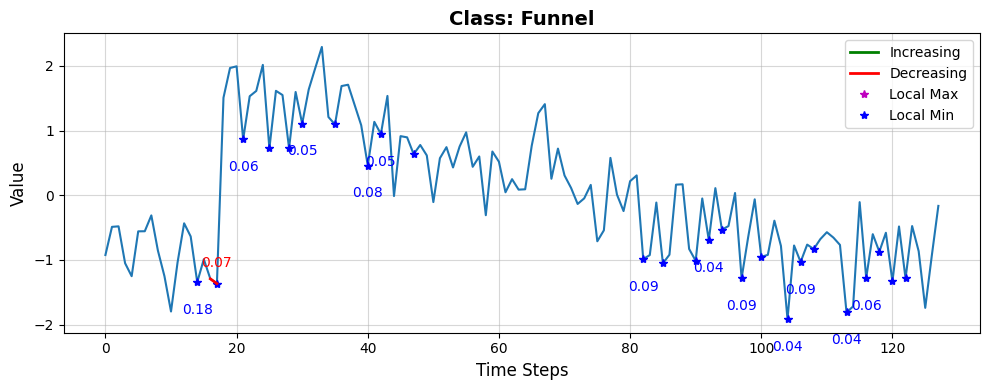

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1860, 0.1290, 0.6850])
Cylinder:                      0.1860
Bell:                      0.1290
Funnel:                      0.6850


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15011 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17926 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32722 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32726 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.61
INFO:lomatce.explainer:Model Type: Ridge


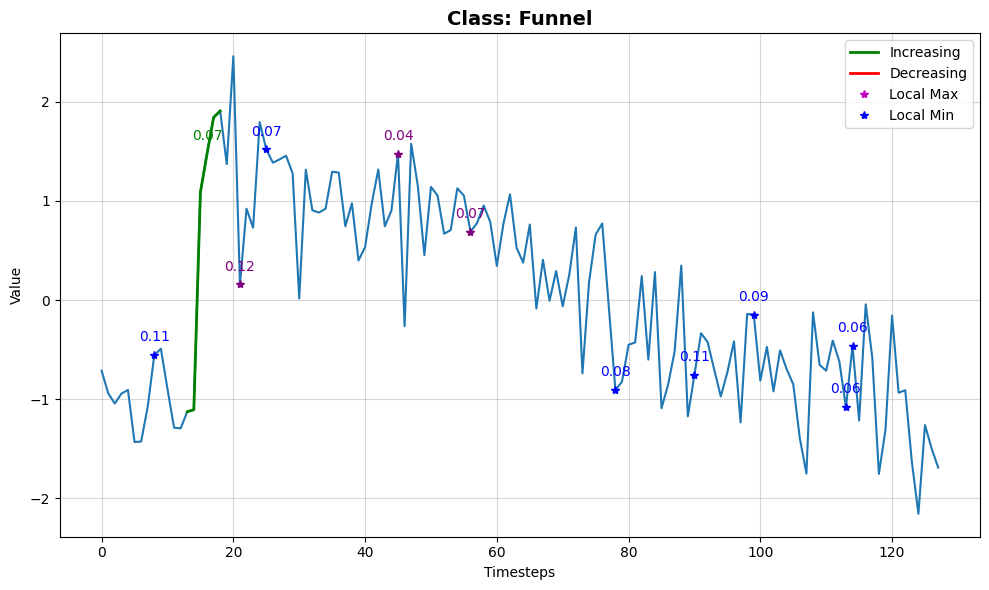

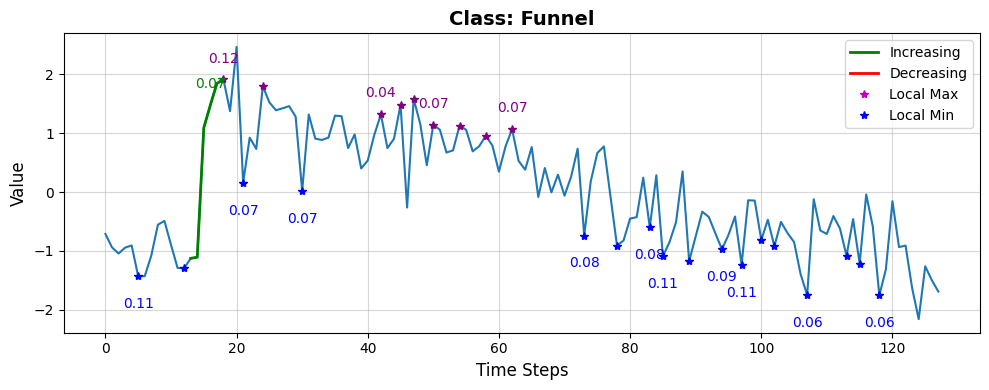

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.2884, 0.1177, 0.5940])
Cylinder:                      0.2884
Bell:                      0.1177
Funnel:                      0.5940


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13341 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15258 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37220 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36557 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.85
INFO:lomatce.explainer:Model Type: Ridge


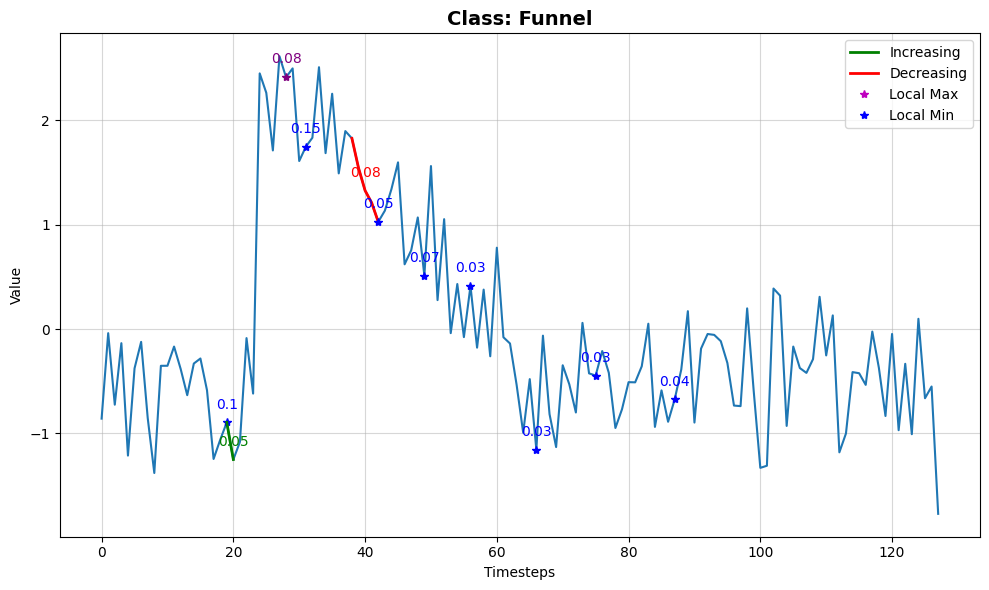

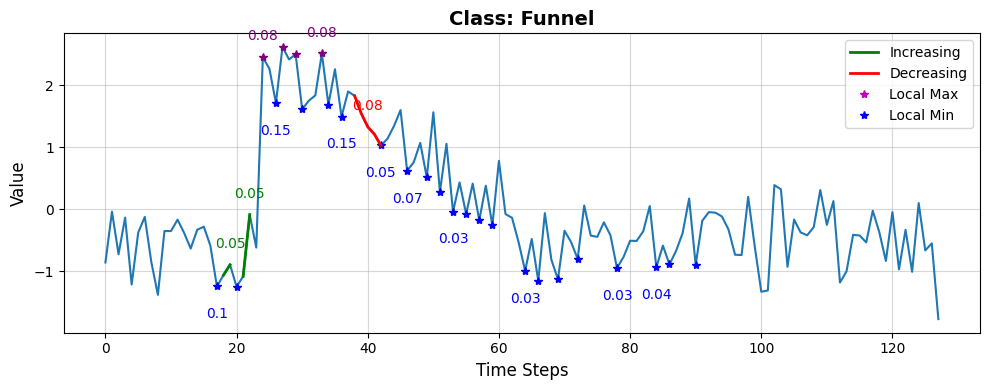

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.0757, 0.0888, 0.8355])
Cylinder:                      0.0757
Bell:                      0.0888
Funnel:                      0.8355


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13661 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14044 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36929 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37858 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 57) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 57


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.75
INFO:lomatce.explainer:Model Type: Ridge


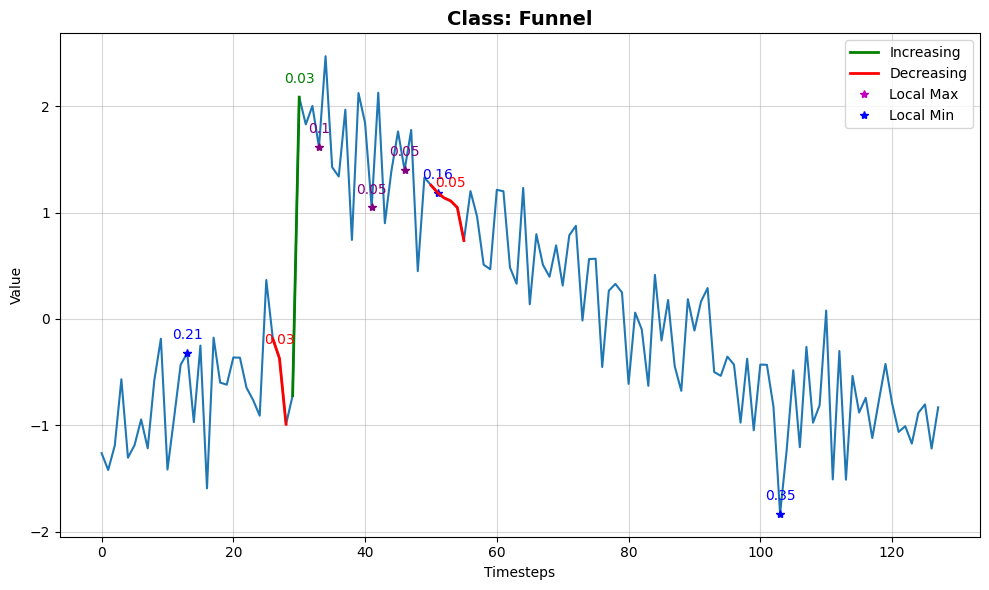

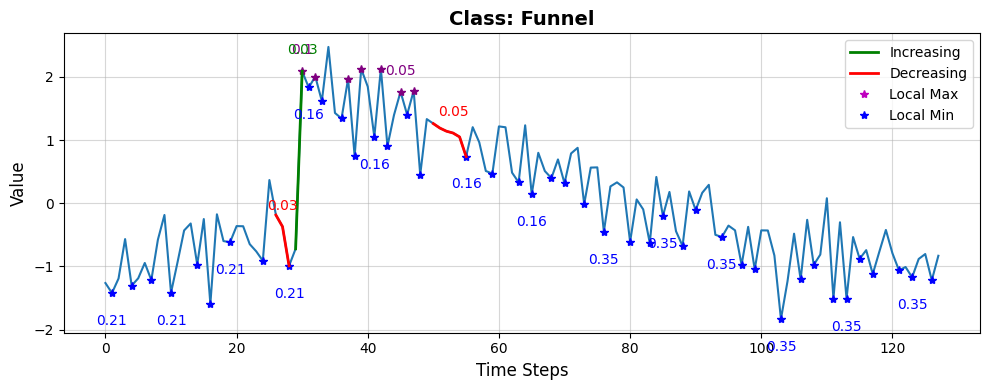

INFO:lomatce.explainer:Starting time series local explanation


Prediction probability : tensor([0.1807, 0.0888, 0.7305])
Cylinder:                      0.1807
Bell:                      0.0888
Funnel:                      0.7305


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12467 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10666 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40593 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40561 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.71
INFO:lomatce.explainer:Model Type: Ridge


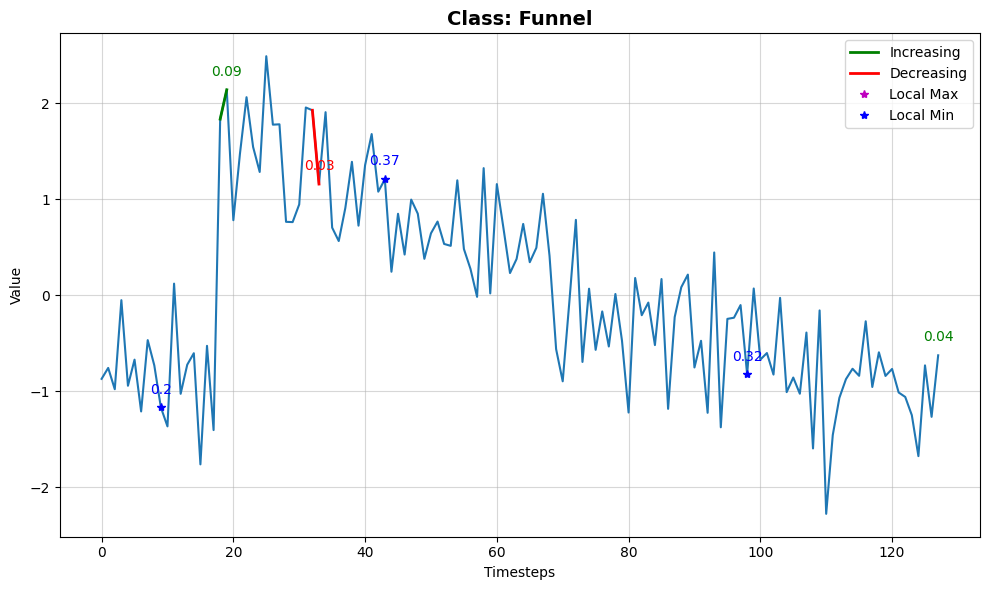

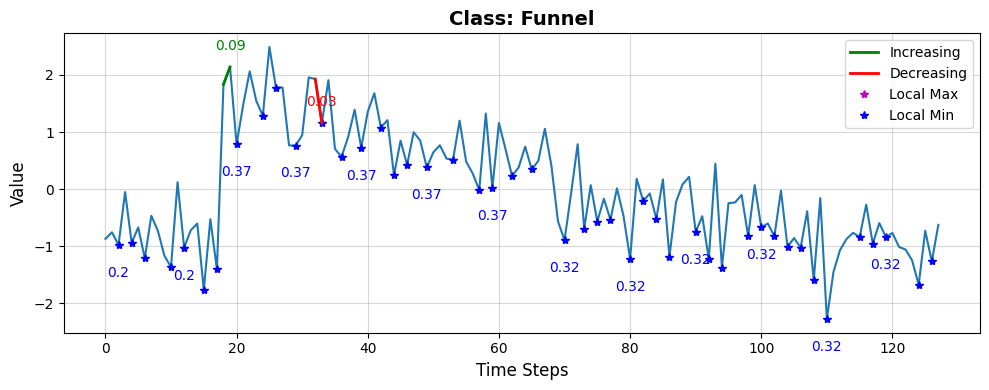

Prediction probability : tensor([0.1445, 0.1781, 0.6774])
Cylinder:                      0.1445
Bell:                      0.1781
Funnel:                      0.6774

📈 Global Faithfulness (Avg Local Fidelity): 0.9596

=== 📊 Final Visualization for All Classes ===



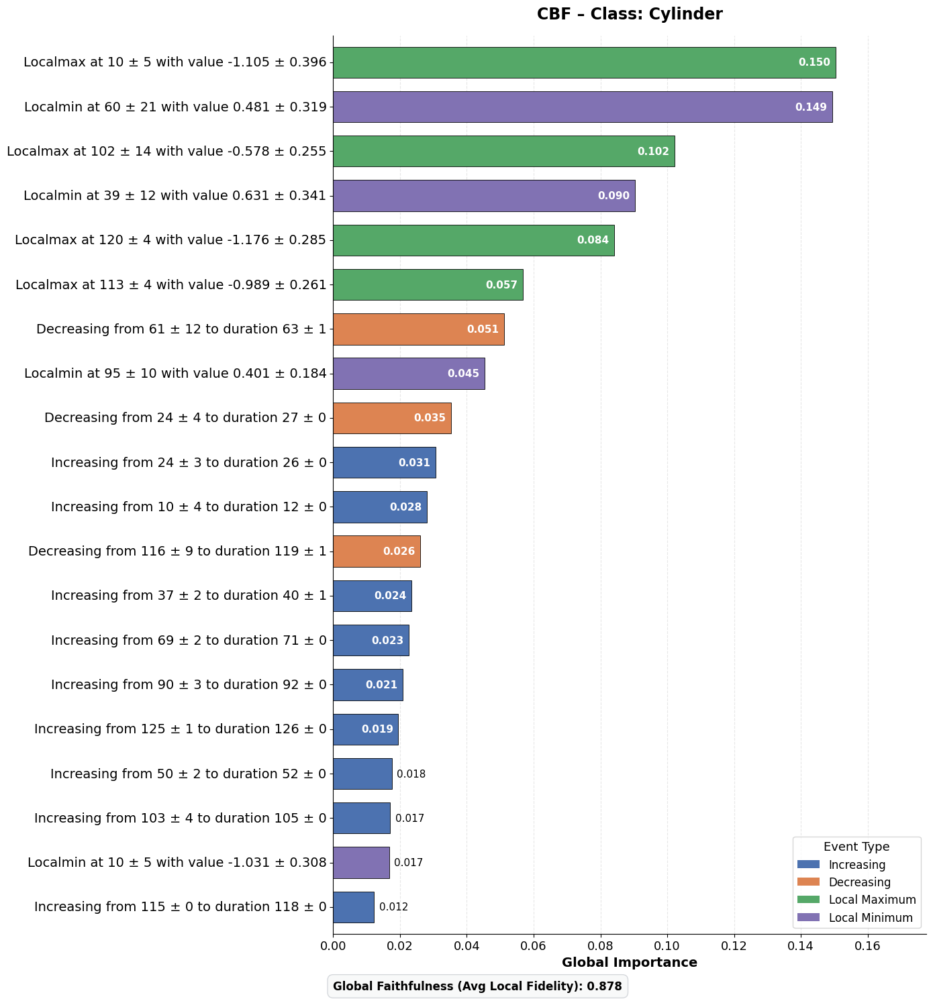

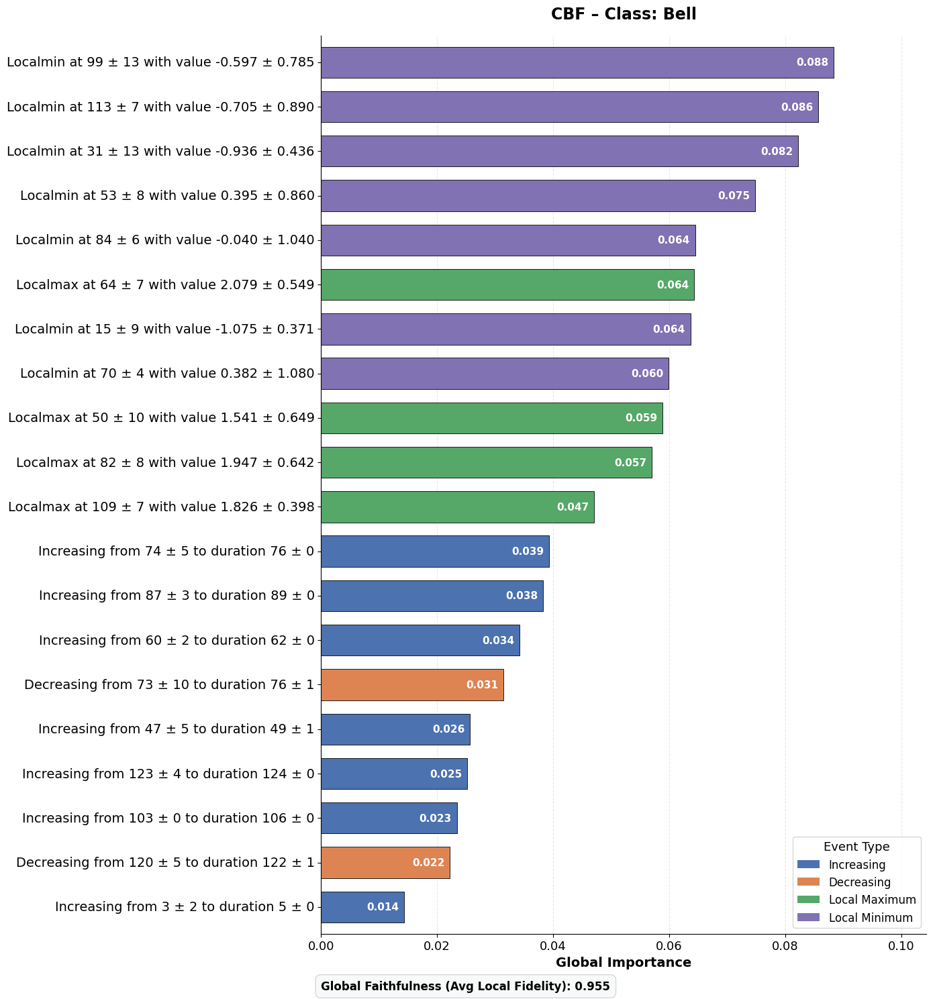

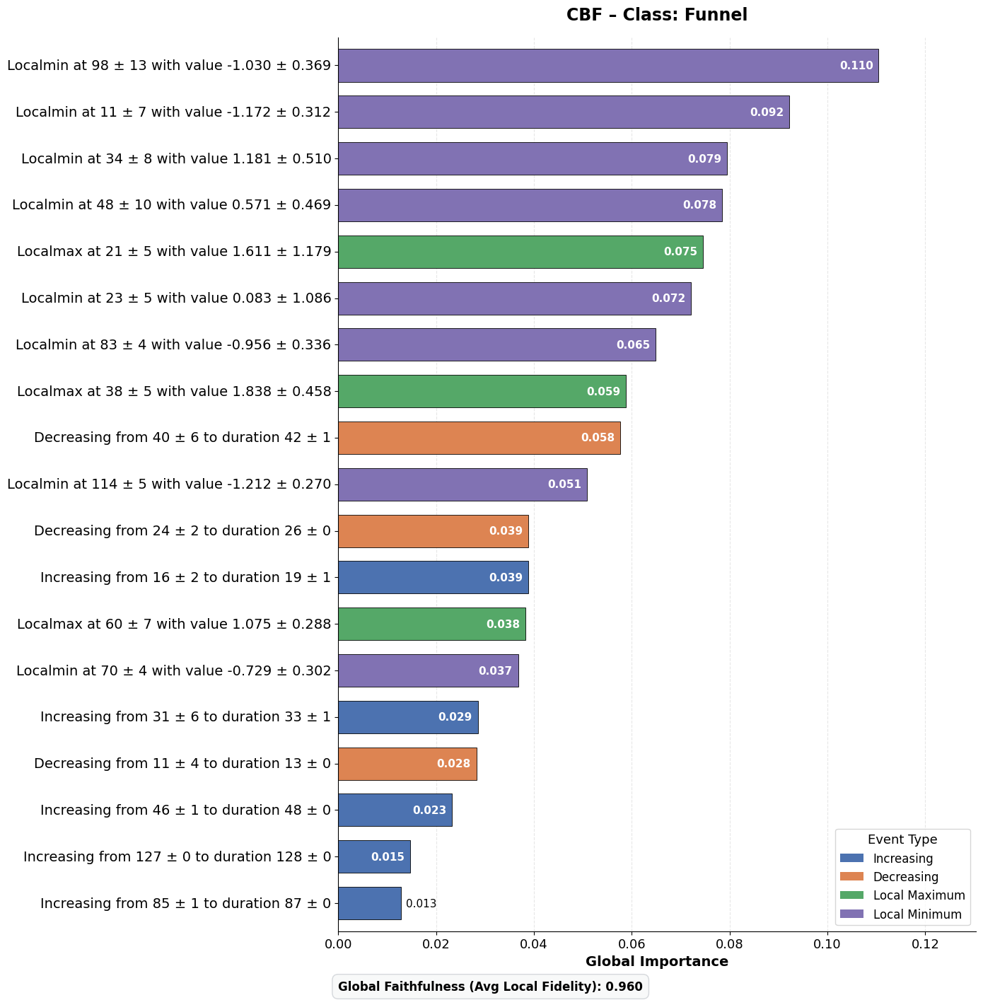

In [26]:
result_p95 = splomatce_explainer.run(X_test, test_preds, n_per_class=20, B=20, merge_percentile=95)